In [1]:
import torch.nn as nn
import torch.nn.functional as F
import torch

import sys 
import numpy as np 
import matplotlib.pyplot as plt

from torch.utils.data.sampler import SubsetRandomSampler
import torch
import torchvision 
import torch.optim as optim
import torch.nn as nn
from torch.autograd import Variable
from six import add_metaclass
from contextlib import contextmanager
import random
import pickle
import functools

sys.path.insert(0, '/home/fmejia/fmejia/VennData_repo/Utils/')
import utils

print("Python: %s" % sys.version)
print("Pytorch: %s" % torch.__version__)

Python: 3.6.10 |Anaconda, Inc.| (default, Mar 25 2020, 23:51:54) 
[GCC 7.3.0]
Pytorch: 1.4.0


In [2]:
batch_size = 128
# determine device to run network on (runs on gpu if available)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# define series of transforms to pre process images 
transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),

    torchvision.transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])
    

classes = ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]

# load training set 
cifar10_trainset = torchvision.datasets.CIFAR10('/home/fmejia/fmejia/Cypercat/cyphercat/datasets//', train=True, transform=transform, download=True)
cifar10_trainloader = torch.utils.data.DataLoader(cifar10_trainset, batch_size=batch_size, shuffle=True, num_workers=2)

# load test set 
cifar10_testset = torchvision.datasets.CIFAR10('/home/fmejia/fmejia/Cypercat/cyphercat/datasets//', train=False, transform=transform, download=True)
cifar10_testloader = torch.utils.data.DataLoader(cifar10_testset, batch_size=batch_size, shuffle=False, num_workers=2)


testset_list = []
test_batch_size = batch_size
for i in range(int(5 * test_batch_size / batch_size)):
    testset_list.append(cifar10_testset)

cifar10_testset5 = torch.utils.data.ConcatDataset(testset_list)
cifar10_testloader5 = torch.utils.data.DataLoader(cifar10_testset5, batch_size=test_batch_size, shuffle=True, num_workers=2)



# helper function to unnormalize and plot image 
def imshow(img, filename = None):
    mean = torch.tensor((0.4914, 0.4822, 0.4465)).to(device)
    mean = mean.view(-1,1,1).cpu().detach().numpy()
    var = torch.tensor((0.2023, 0.1994, 0.2010)).to(device)
    var = var.view(-1,1,1).cpu().detach().numpy()
    
    img = np.array(img)
    img = (img*var) + mean
    img = np.moveaxis(img, 0, -1)
    plt.imshow(img)
    try:
        plt.savefig(filename)
        plt.show()
    except:
        plt.show()
    
    
# display sample from dataset 
imgs,labels = iter(cifar10_trainloader).next()
# imshow(torchvision.utils.make_grid(imgs))  

Files already downloaded and verified
Files already downloaded and verified


In [3]:
# net = utils.Wide_ResNet(28, 10, 0.3, 10)
# net = utils.VGG()
# net = utils.resnet('BasicBlock', [2, 2, 2, 2])
net = utils.ResNet('BasicBlock', [2, 2, 2, 2], num_classes=10)
net = net.to(device)
out = net(imgs.to(device))
print(out.size())
net.reset()

torch.Size([128, 10])


Parameter containing:
tensor([-0.0182, -0.0047,  0.0227,  ...,  0.0000,  0.0000,  0.0000],
       device='cuda:0', requires_grad=True)

In [4]:
class MyDataset():
    def __init__(self, dataset):
        self.dataset = dataset
        
    def __getitem__(self, index):
        data, target = self.dataset[index]        
        return data, target, index

    def __len__(self):
        return len(self.dataset)
cifar10_trainset = MyDataset(cifar10_trainset)
cifar10_trainloader = torch.utils.data.DataLoader(cifar10_trainset, batch_size = batch_size, shuffle=True, num_workers=2)

In [5]:
def eval_target_net(net, testloader, w, classes=None):

    if classes is not None:
        class_correct = np.zeros(10)
        class_total = np.zeros(10)
    total = 0
    correct = 0
    with torch.no_grad():
        net.eval()
        for i, (imgs, lbls) in enumerate(testloader):

            imgs, lbls = imgs.to(device), lbls.to(device)

#             output = net(imgs)
            output = net.forward_with_param(imgs, w)
            predicted = output.argmax(dim=1)

            total += imgs.size(0)
            correct += predicted.eq(lbls).sum().item()

            if classes is not None:
                for prediction, lbl in zip(predicted, lbls):

                    class_correct[lbl] += prediction == lbl
                    class_total[lbl] += 1
             
    if classes is not None:
        for i in range(len(classes)):
            print('Accuracy of %s : %.2f %%' % (classes[i], 100 * class_correct[i] / class_total[i]))
    print("\nTotal accuracy = %.2f %%\n\n" % (100*(correct/total)) )
    
    return((100*(correct/total)))

In [12]:
class MyDataset():
    def __init__(self, dataset):
        self.dataset = dataset
        
    def __getitem__(self, index):
        data, target = self.dataset[index]        
        return data, target, index

    def __len__(self):
        return len(self.dataset)
    
cifar10_trainset = torchvision.datasets.CIFAR10('/home/fmejia/fmejia/Cypercat/cyphercat/datasets//', train=True, transform=transform, download=True)
trainset = MyDataset(cifar10_trainset)
testset = MyDataset(cifar10_testset5)

cifar10_trainloader = torch.utils.data.DataLoader(trainset, batch_size = batch_size, shuffle=True, num_workers=2)
# testset = MyDataset(cifar10_testset5)
# cifar10_testloader5 = torch.utils.data.DataLoader(testset, batch_size=test_batch_size, shuffle=True, num_workers=2)



Files already downloaded and verified


In [15]:
optimizer = optim.SGD(net.parameters(), lr=0.1, momentum=0.9, weight_decay=0.0002)   

In [16]:
imgs,labels, ind0 = iter(cifar10_trainloader).next()
im_noise = torch.zeros((len(cifar10_trainset) , imgs.size(1), int(imgs.size(2)) , int(imgs.size(3)) ), device = device) 
im_noise0 = torch.tensor(im_noise[ind0, :, : ,: ],requires_grad = True, device = device)
optimizer = optim.SGD([im_noise0], lr=0.1, momentum=0.9, weight_decay=0.0002) 

/home/fmejia/anaconda3/envs/pytorch1.4/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  This is separate from the ipykernel package so we can avoid doing imports until


In [18]:

train_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(256),
    torchvision.transforms.CenterCrop(256),
    torchvision.transforms.Resize(32),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])

# load training set 
alt_trainset = torchvision.datasets.ImageFolder('/mnt/fs03/Datasets/CIFAR10_analogous/alt-CIFAR-variant/',transform=train_transform)
alt_trainloader = torch.utils.data.DataLoader(alt_trainset, batch_size=128, shuffle=True, num_workers=2)


In [ ]:
## Train model

In [19]:
losses = []  
losses_syn = []

w = torch.tensor(net.get_param().cpu().detach().numpy(), requires_grad = True).to(device) 
class_criterion = nn.CrossEntropyLoss()

lr_synthetic = 1e-2
lr = 1e-2

# for i in range(1000):
n_epoch = 50
n_restarts = 1

criterion = nn.CrossEntropyLoss()

for ii in range(n_restarts):
    print('n_restart = ' + str(ii))
    net = utils.ResNet('BasicBlock', [2, 2, 2, 2], num_classes=10)
    net = net.to(device)
    w0 = torch.tensor(net.get_param().cpu().detach().numpy(), requires_grad = True).to(device)    
    for jj in range(n_epoch):

        for batch in cifar10_trainloader: 
            imgs, labels,_ = batch          
            imgs, labels = imgs.to(device), labels.to(device)  
       
            ## train with weighted data
            with torch.enable_grad():
                output = net.forward_with_param(imgs, w0)
                loss = criterion(output, labels)
            gw, = torch.autograd.grad(loss, w0, grad_outputs = torch.tensor(lr).to(device)) 
            
            w0 = w0.sub(gw).requires_grad_()

        print('epoch ' + str(jj))    


n_restart = 0
epoch 0
epoch 1
epoch 2
epoch 3
epoch 4
epoch 5
epoch 6
epoch 7
epoch 8
epoch 9
epoch 10
epoch 11
epoch 12
epoch 13
epoch 14
epoch 15
epoch 16
epoch 17
epoch 18
epoch 19
epoch 20
epoch 21
epoch 22
epoch 23
epoch 24
epoch 25
epoch 26
epoch 27
epoch 28
epoch 29
epoch 30
epoch 31
epoch 32
epoch 33
epoch 34
epoch 35
epoch 36
epoch 37
epoch 38
epoch 39
epoch 40
epoch 41
epoch 42
epoch 43
epoch 44
epoch 45
epoch 46
epoch 47
epoch 48
epoch 49


n_restart = 0
epoch 0


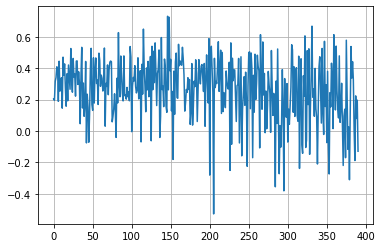

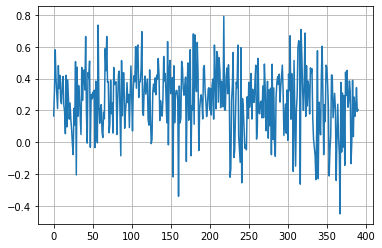

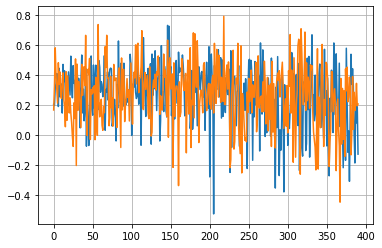

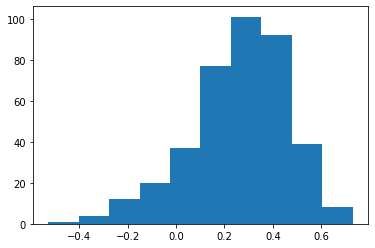

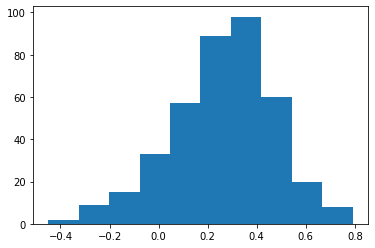

epoch 1


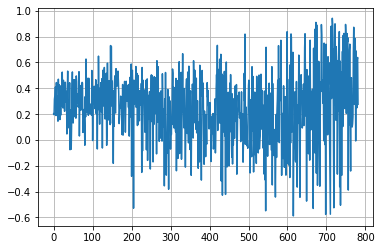

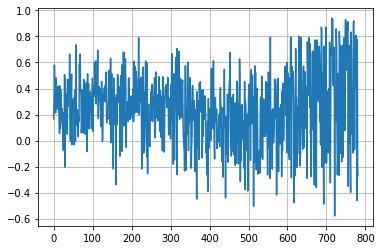

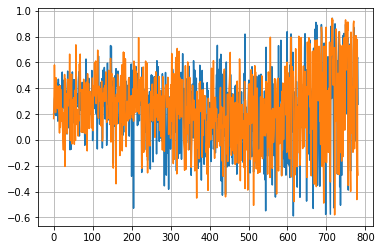

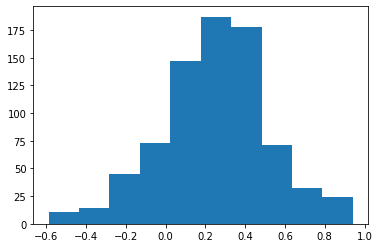

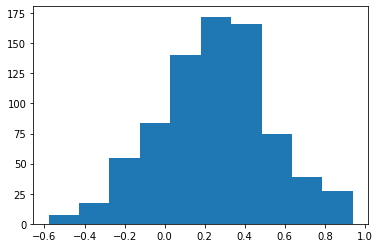

epoch 2


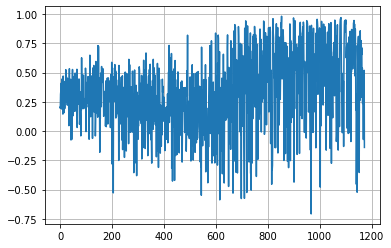

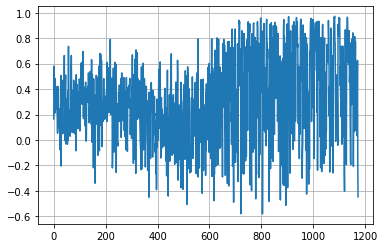

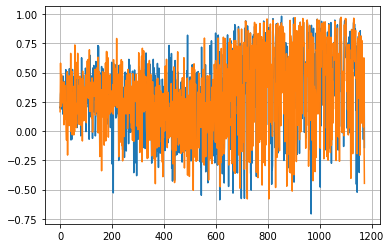

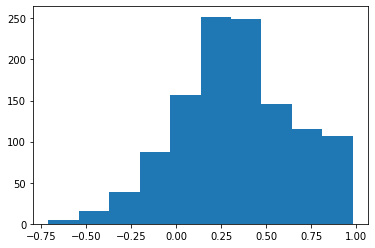

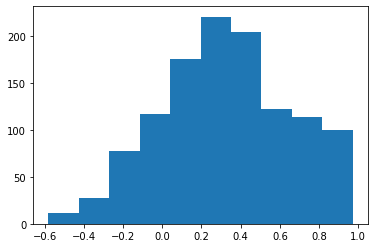

epoch 3


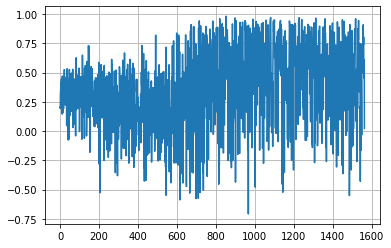

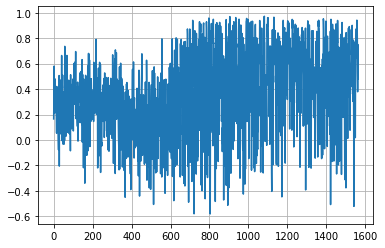

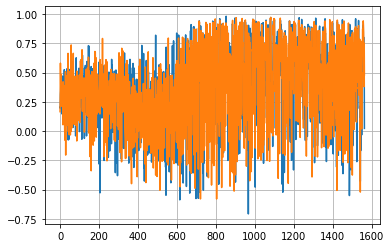

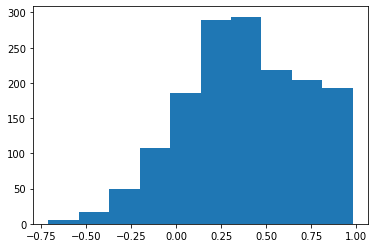

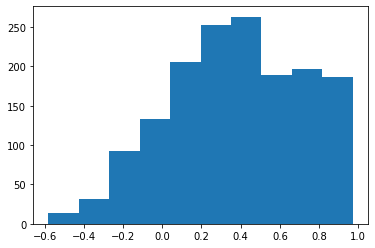

epoch 4


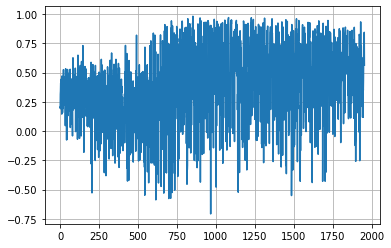

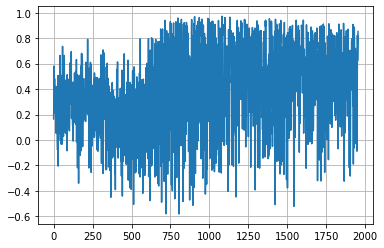

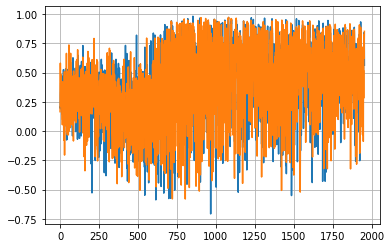

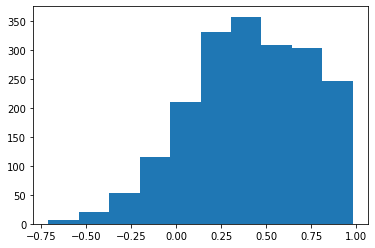

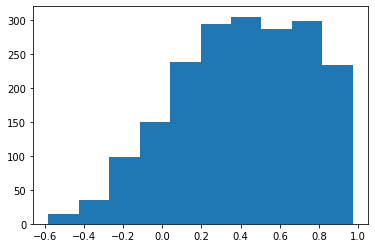

epoch 5


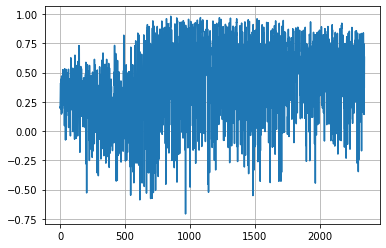

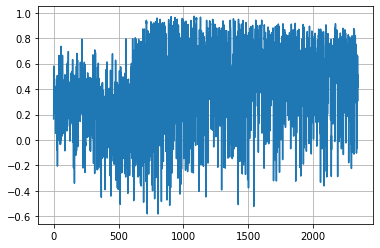

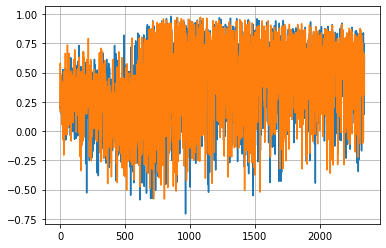

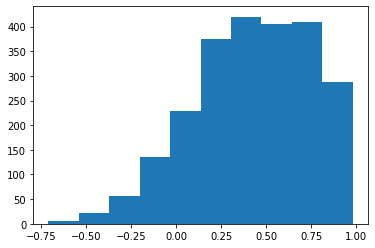

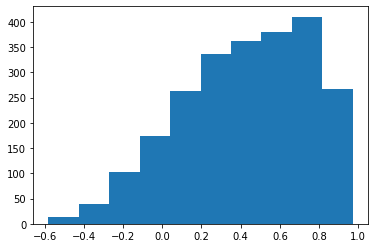

epoch 6


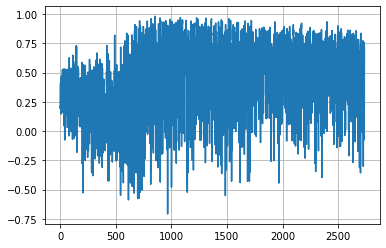

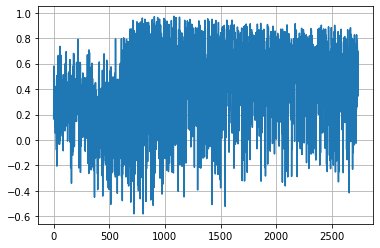

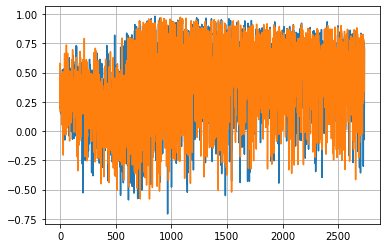

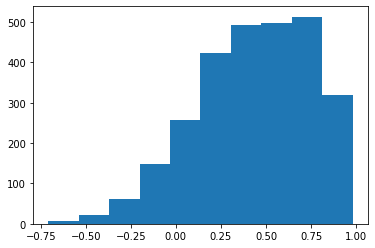

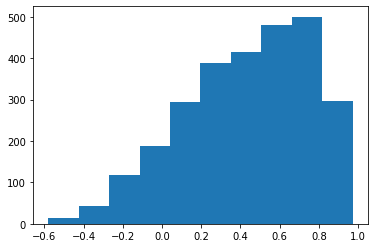

epoch 7


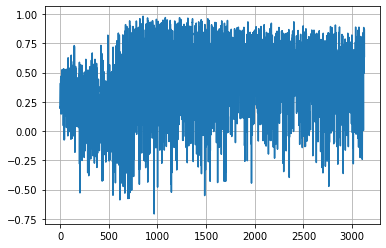

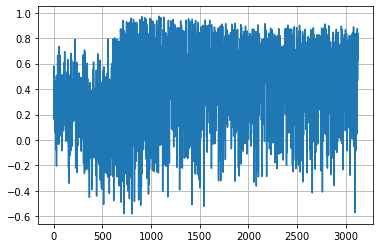

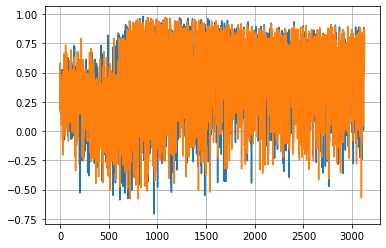

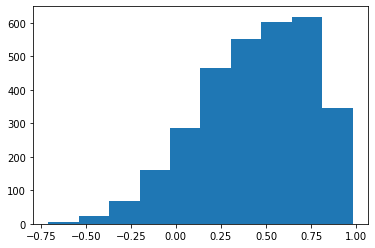

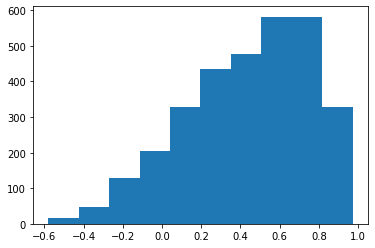

epoch 8


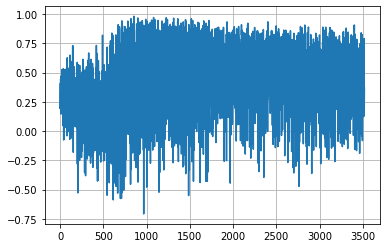

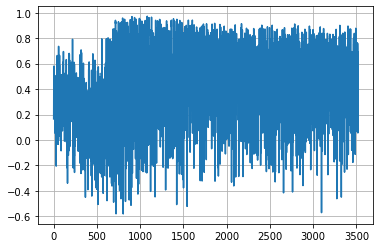

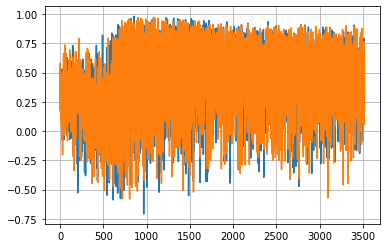

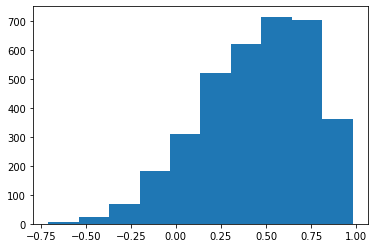

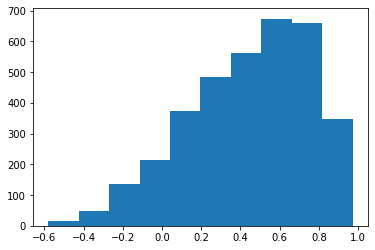

epoch 9


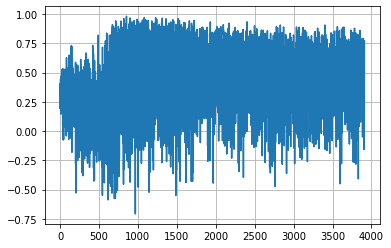

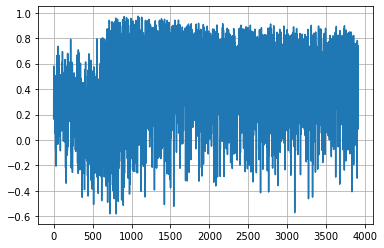

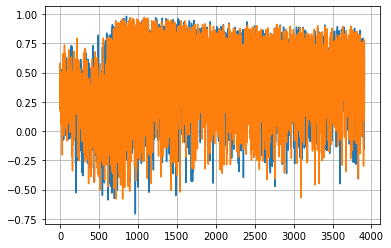

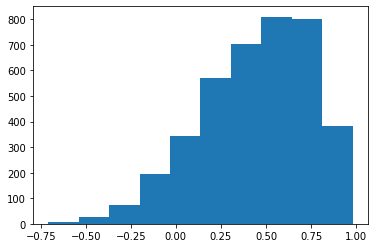

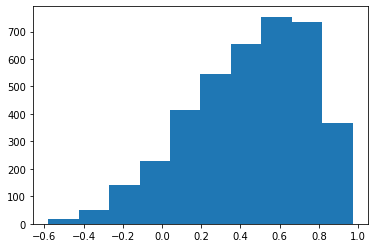

epoch 10


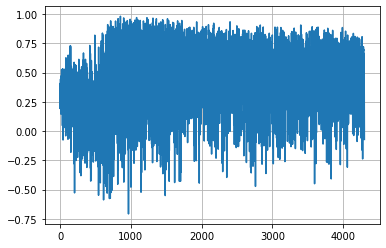

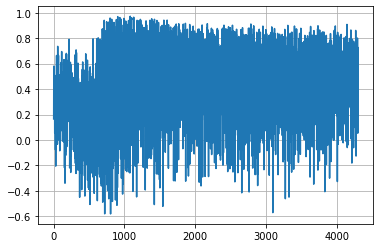

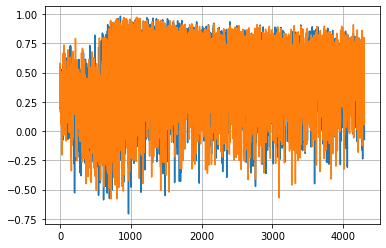

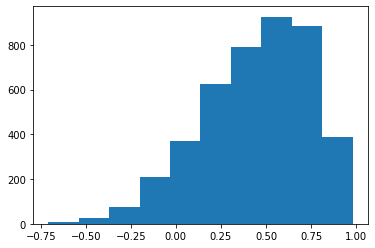

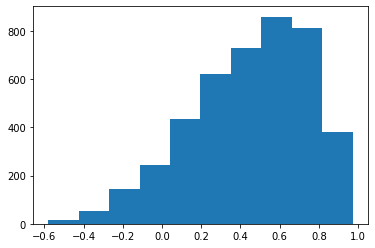

epoch 11


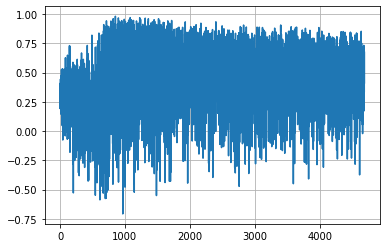

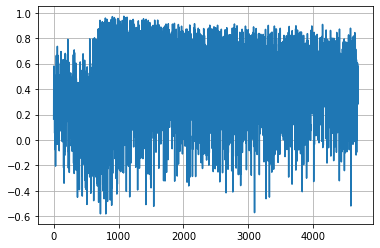

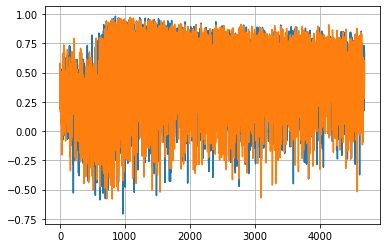

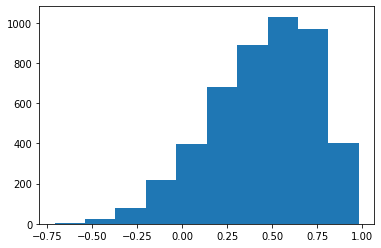

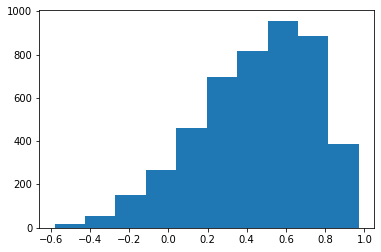

epoch 12


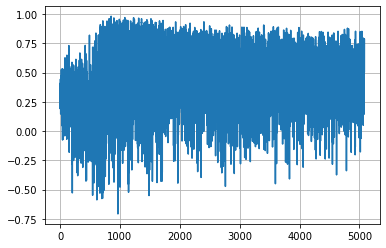

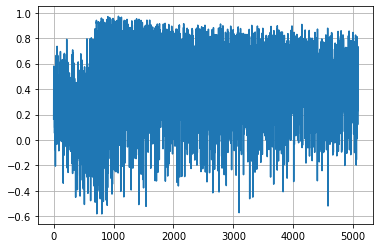

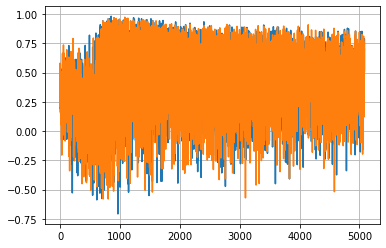

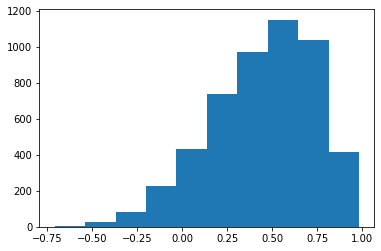

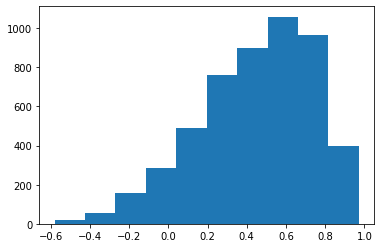

epoch 13


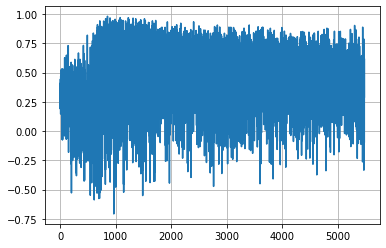

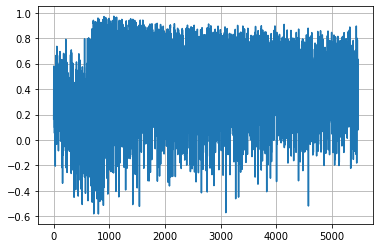

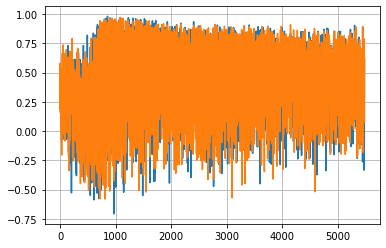

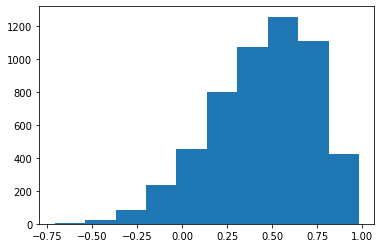

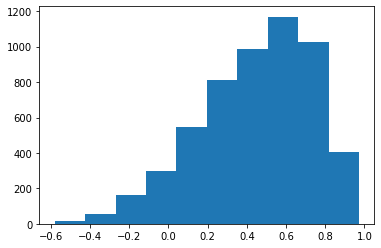

epoch 14


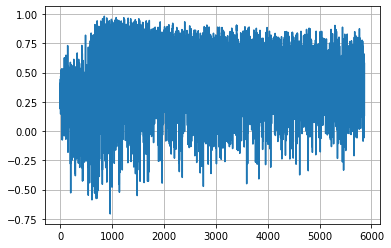

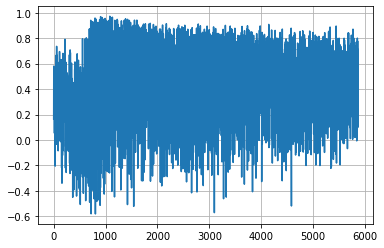

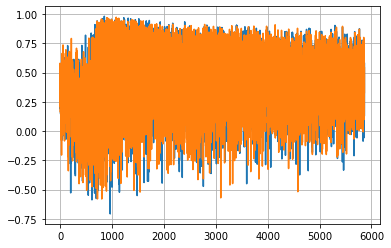

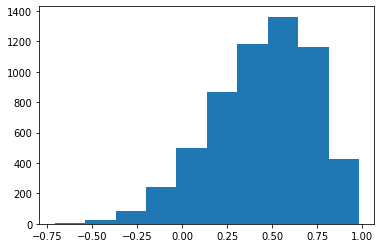

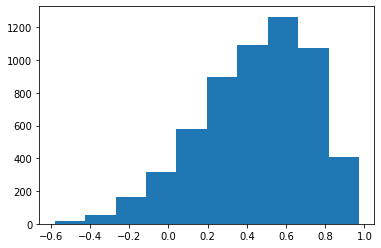

epoch 15


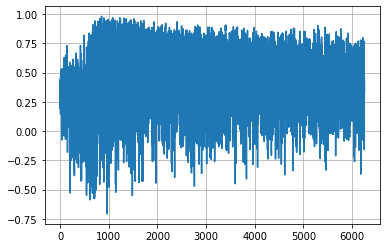

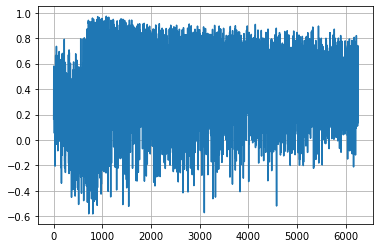

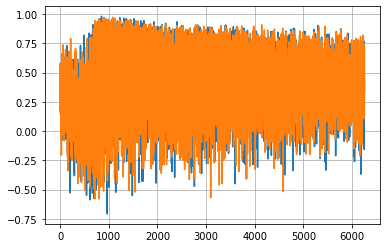

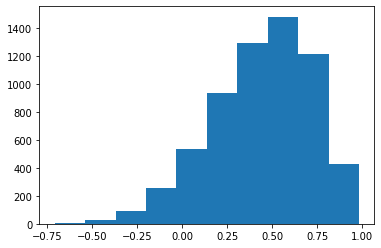

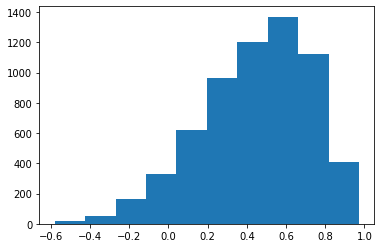

epoch 16


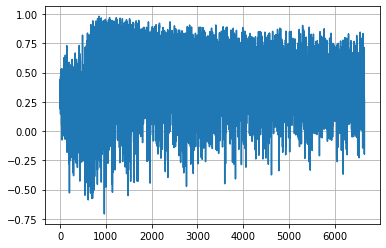

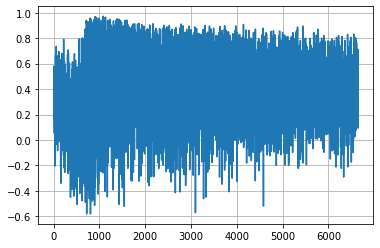

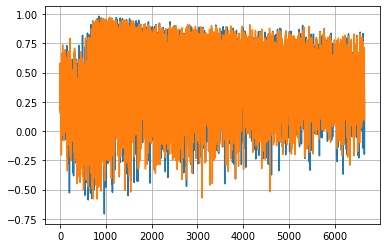

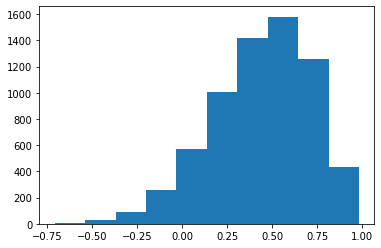

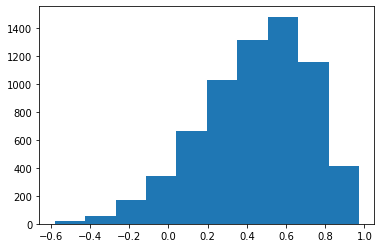

epoch 17


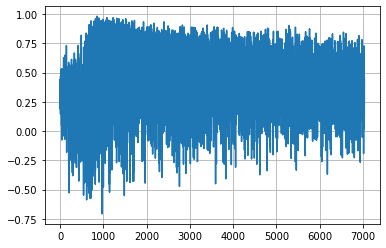

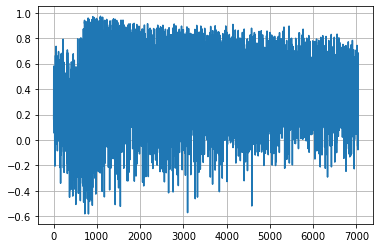

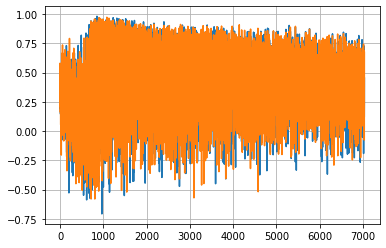

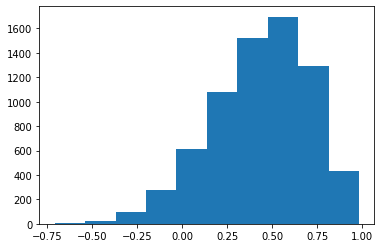

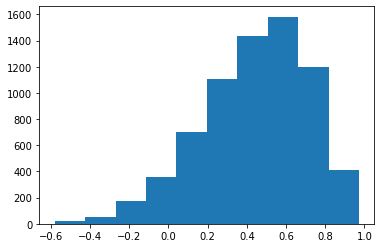

epoch 18


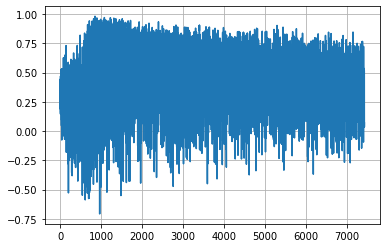

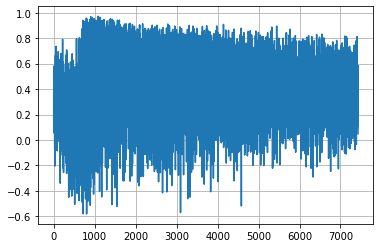

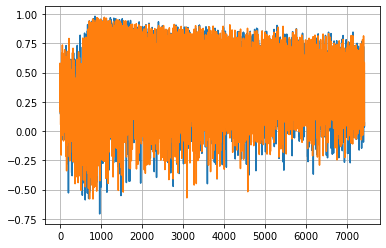

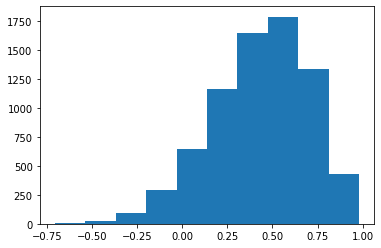

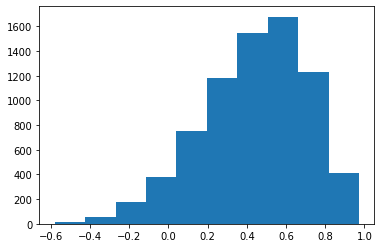

epoch 19


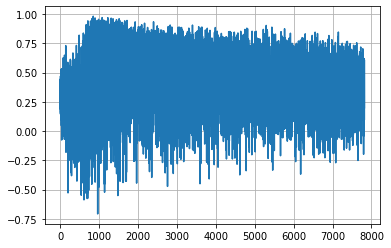

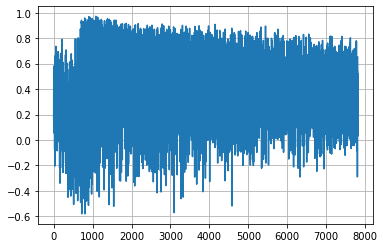

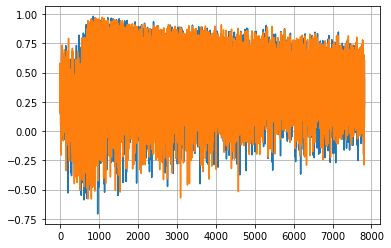

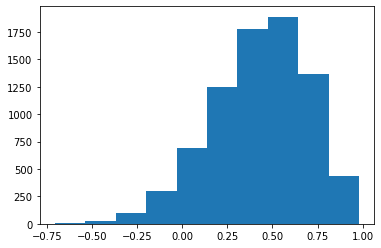

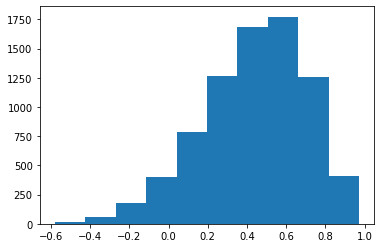

epoch 20


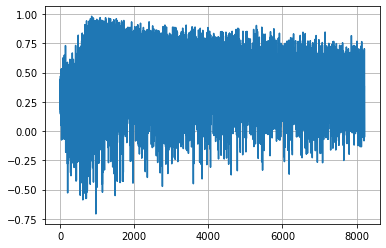

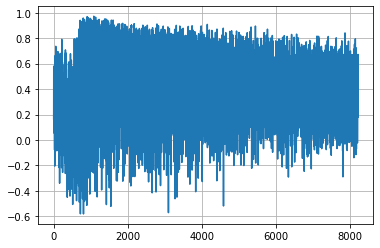

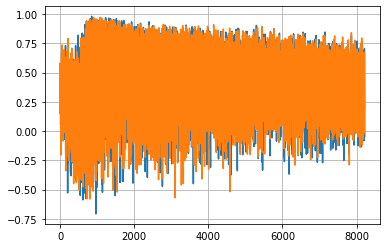

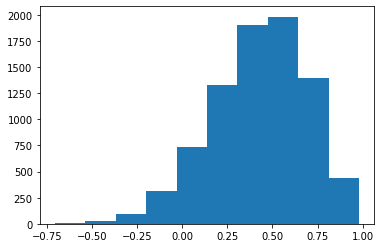

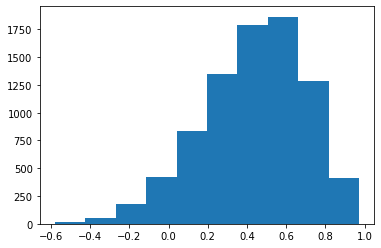

epoch 21


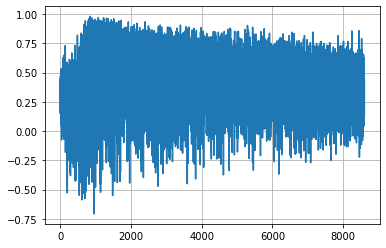

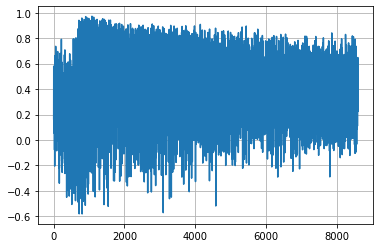

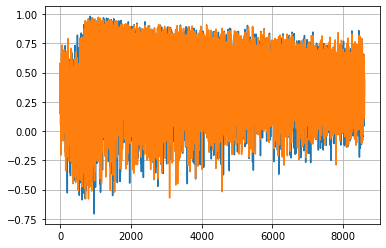

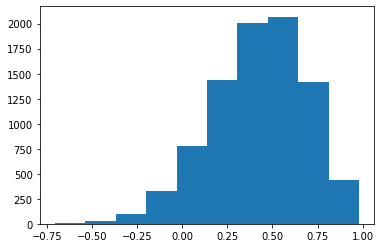

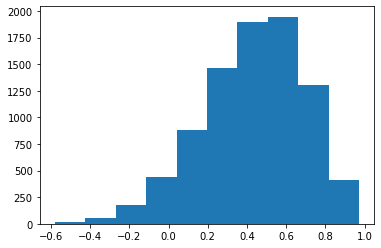

epoch 22


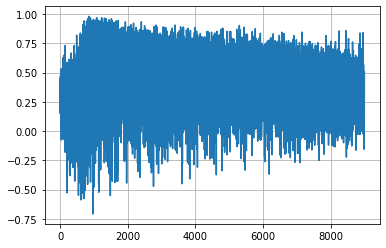

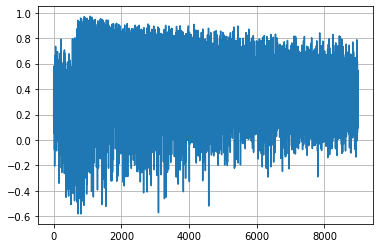

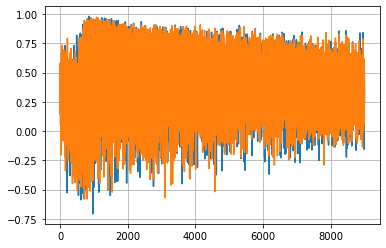

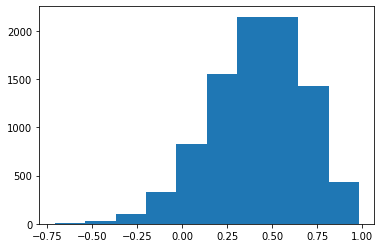

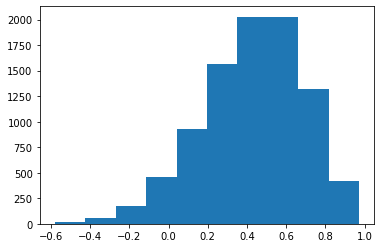

epoch 23


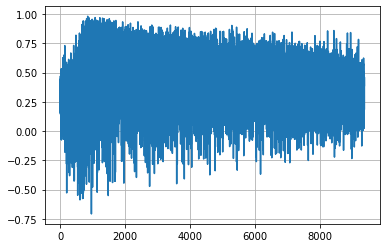

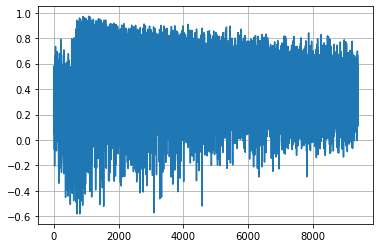

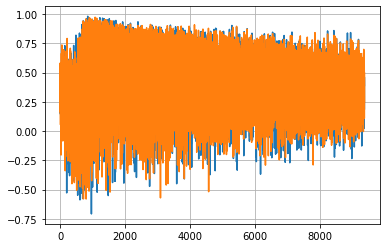

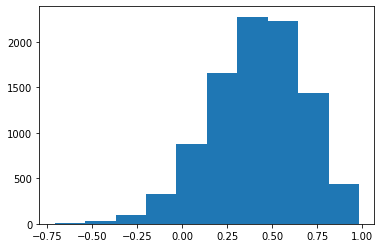

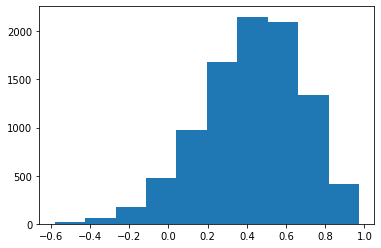

epoch 24


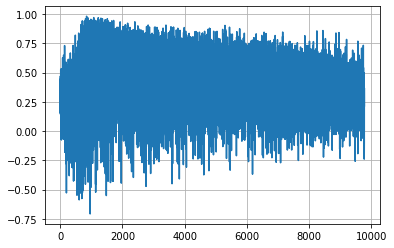

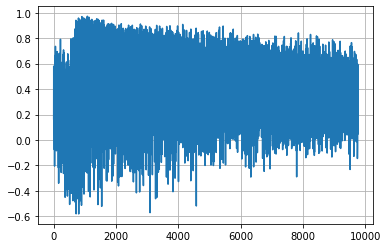

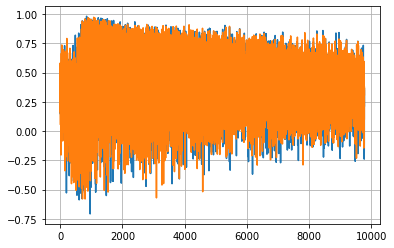

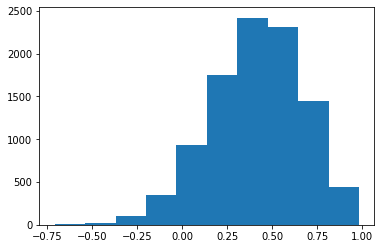

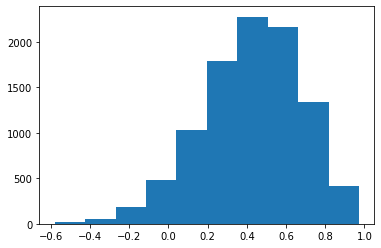

epoch 25


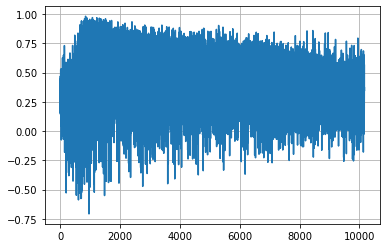

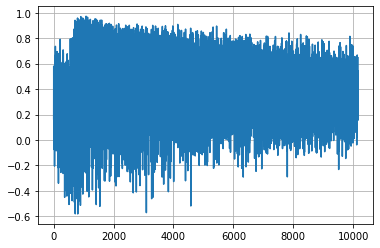

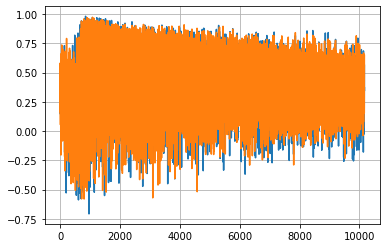

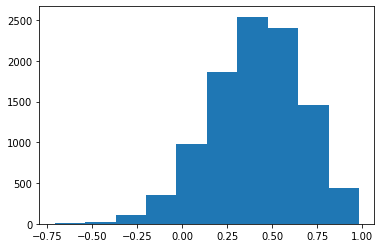

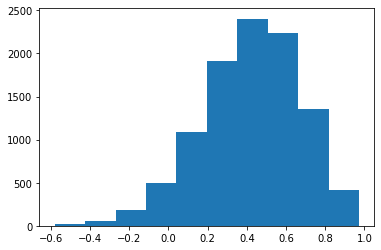

epoch 26


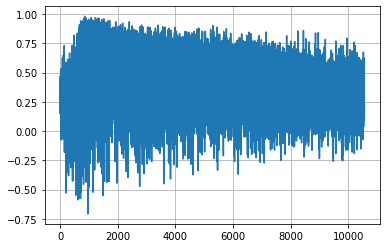

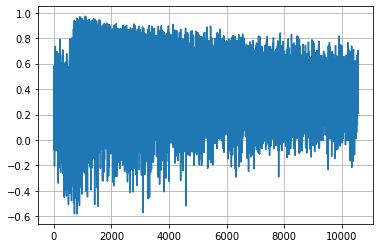

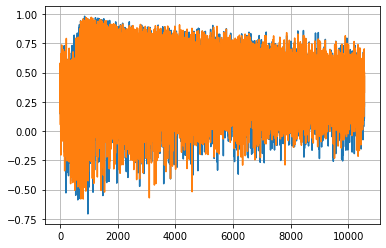

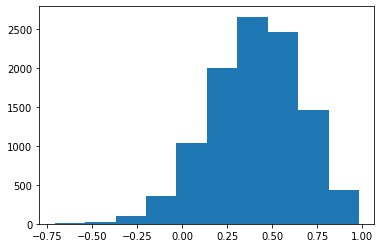

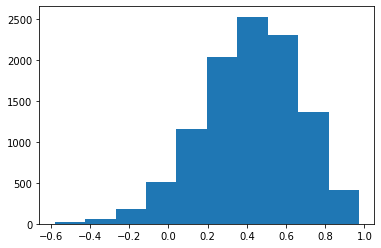

epoch 27


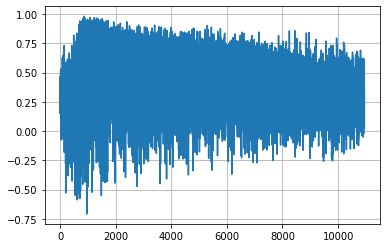

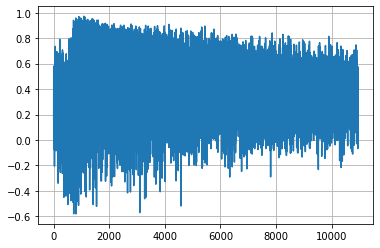

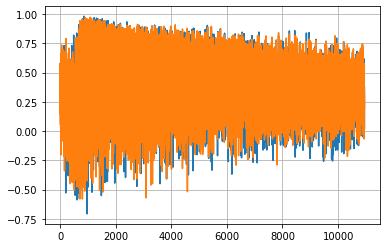

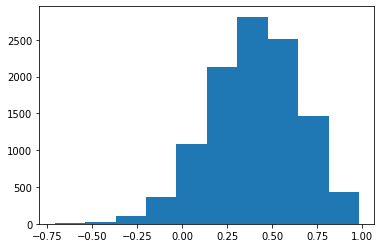

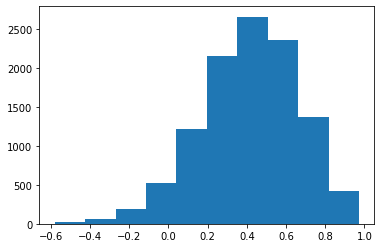

epoch 28


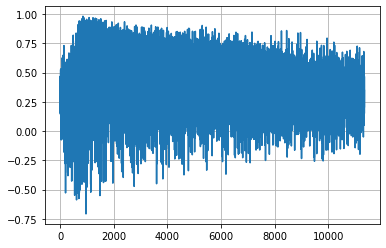

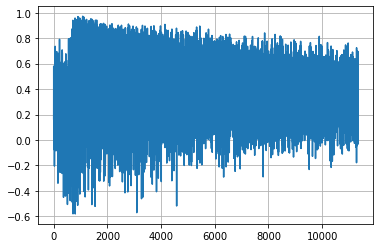

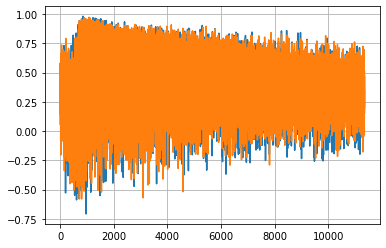

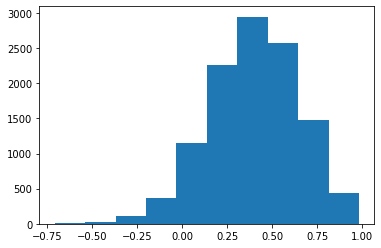

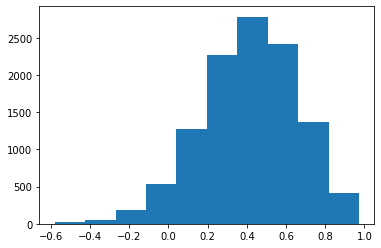

epoch 29


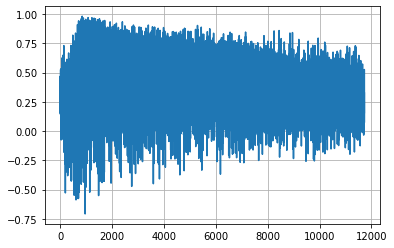

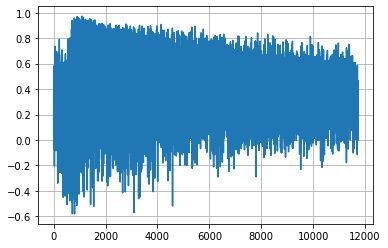

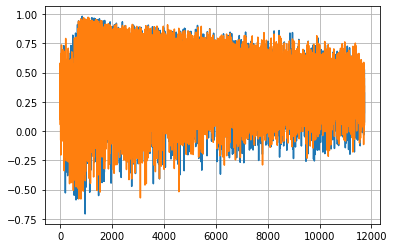

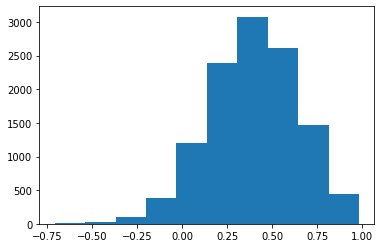

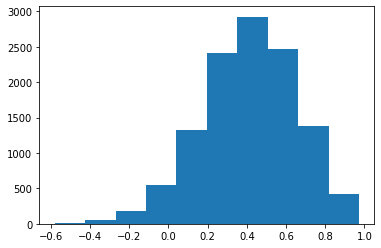

epoch 30


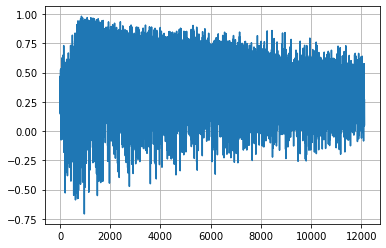

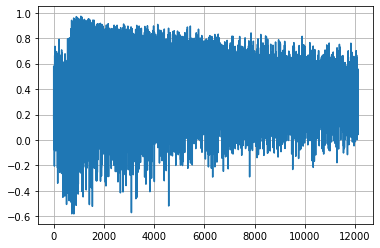

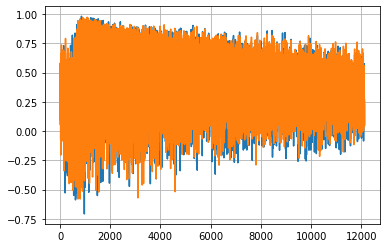

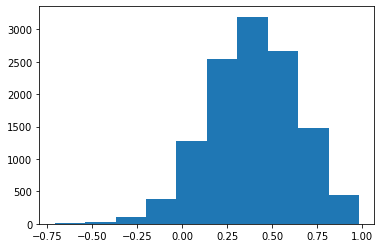

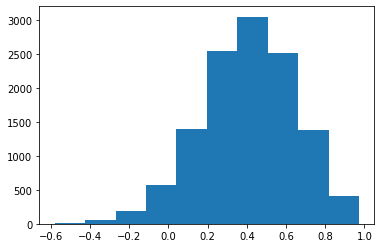

epoch 31


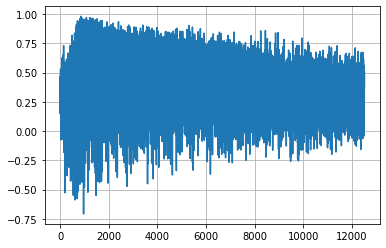

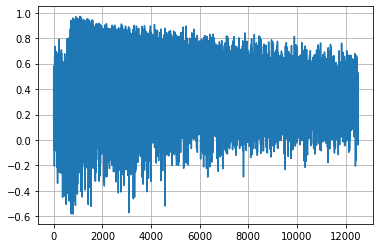

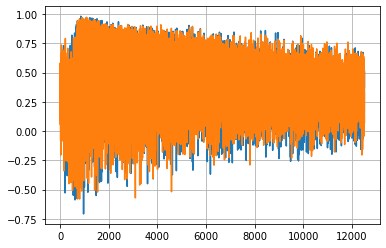

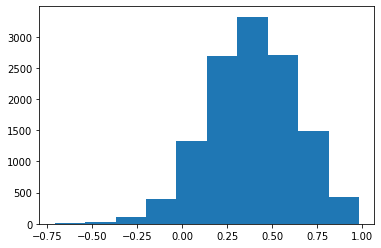

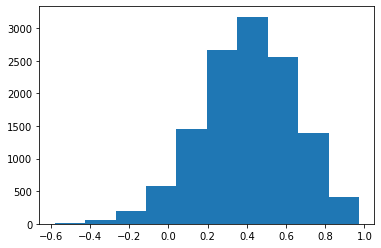

epoch 32


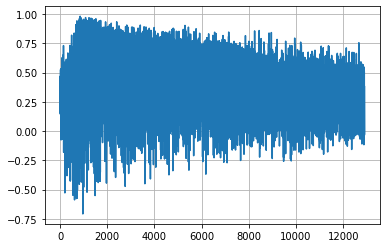

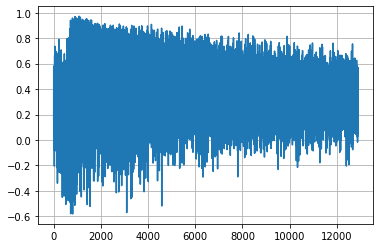

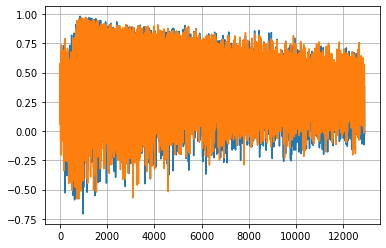

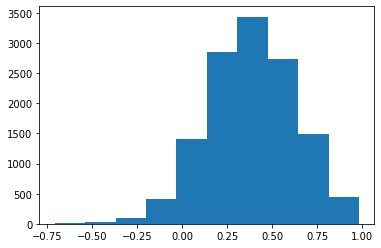

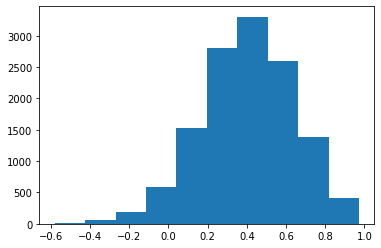

epoch 33


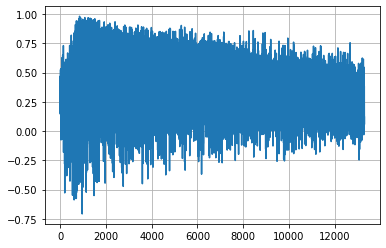

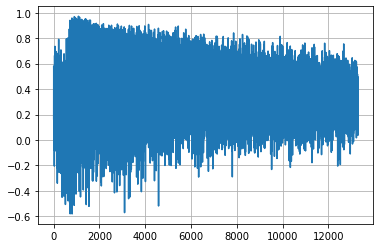

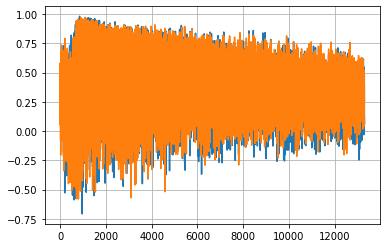

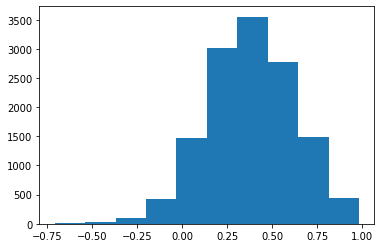

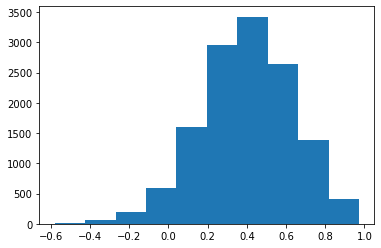

epoch 34


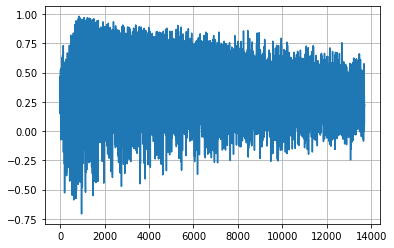

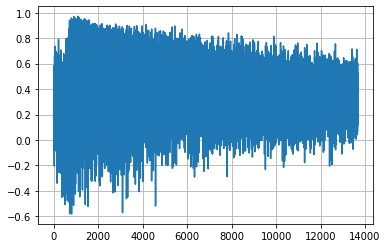

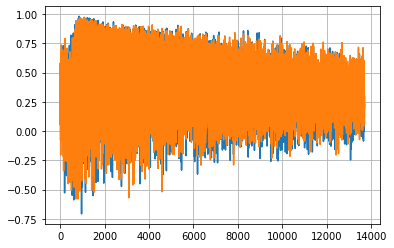

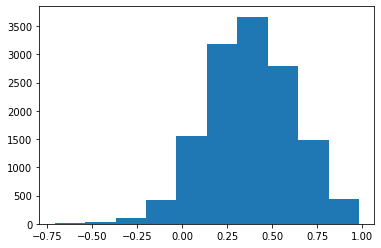

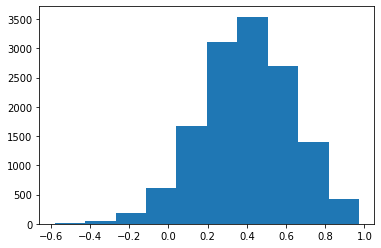

epoch 35


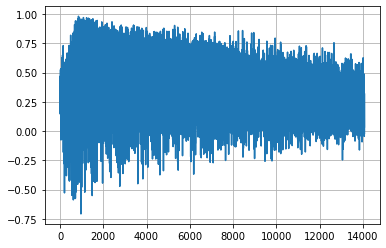

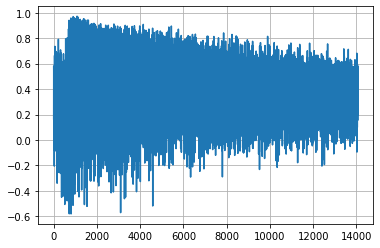

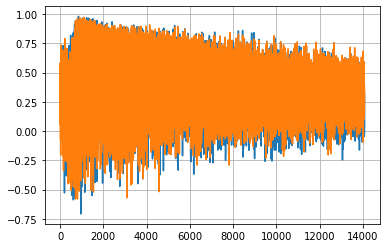

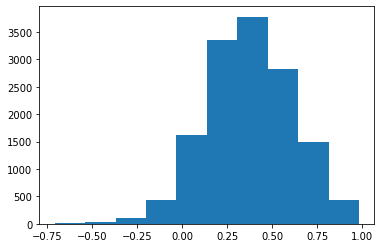

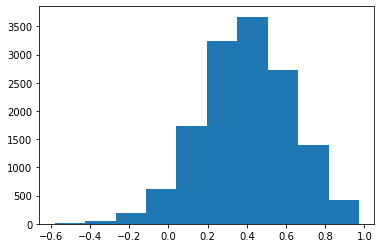

epoch 36


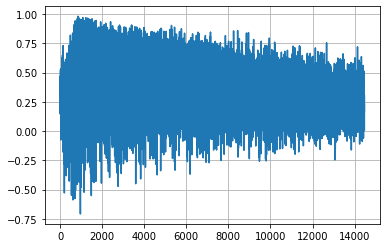

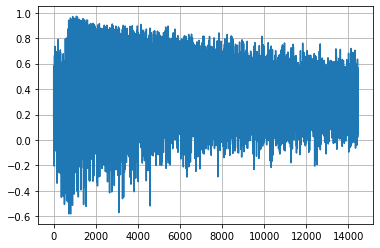

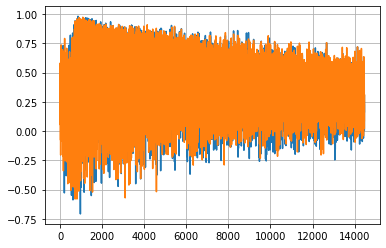

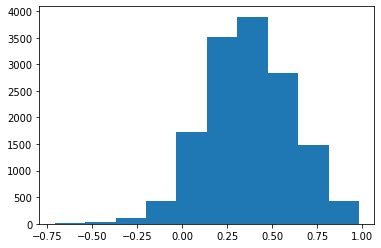

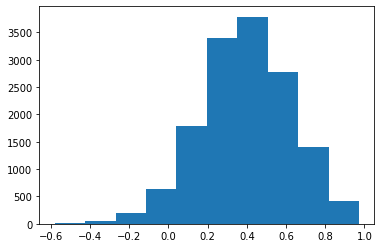

epoch 37


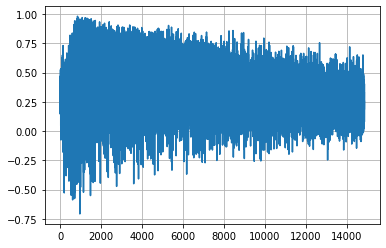

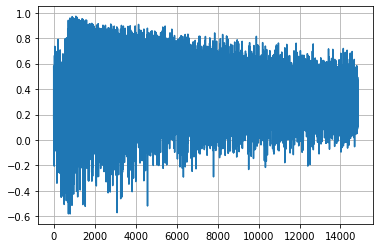

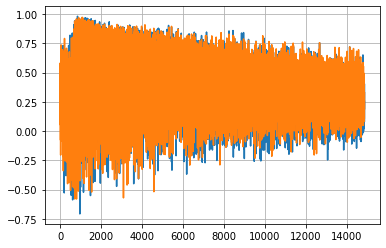

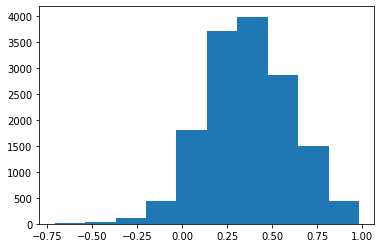

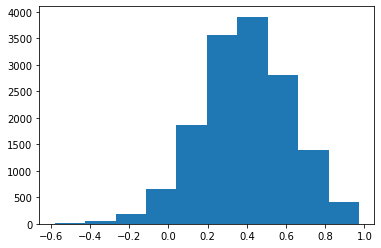

epoch 38


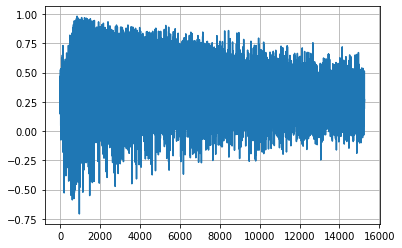

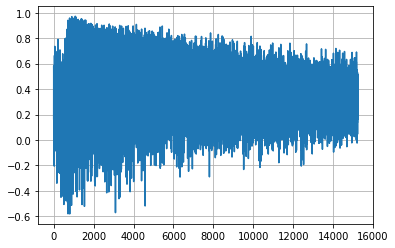

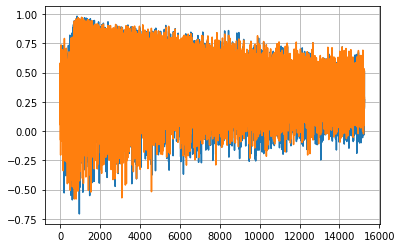

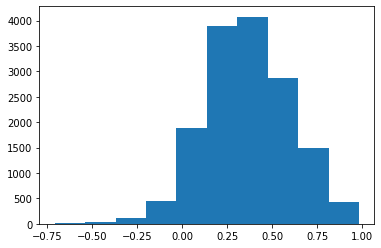

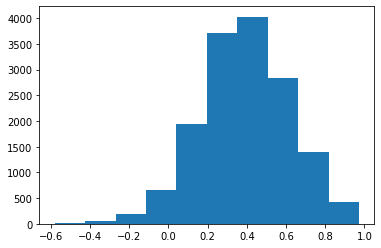

epoch 39


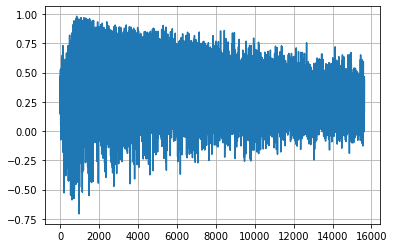

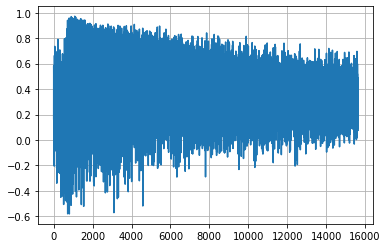

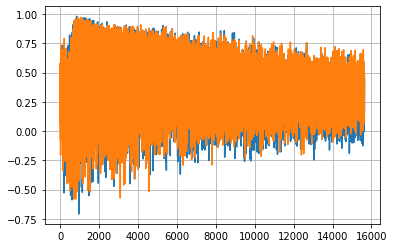

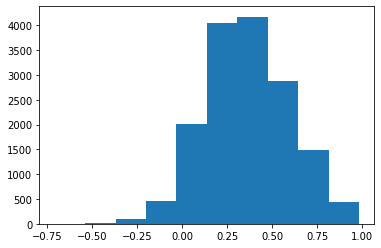

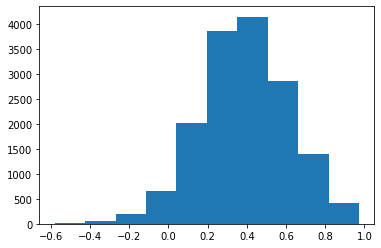

epoch 40


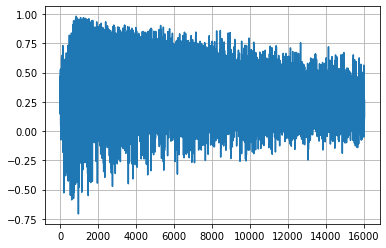

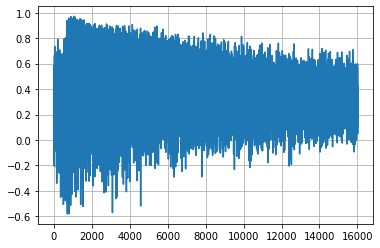

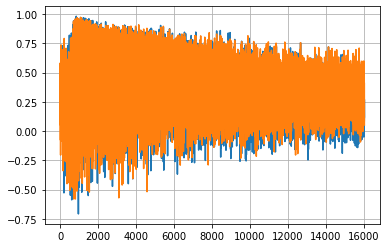

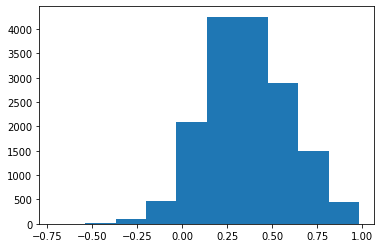

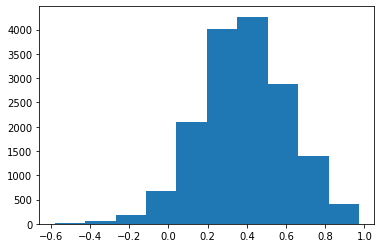

epoch 41


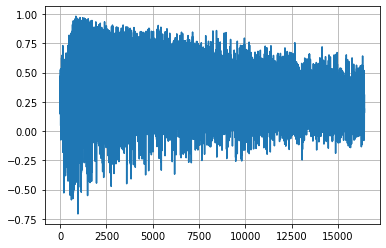

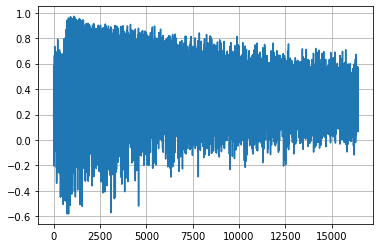

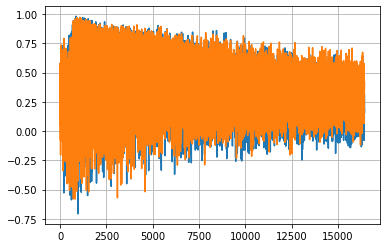

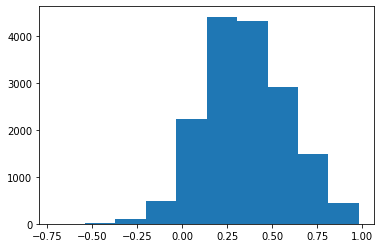

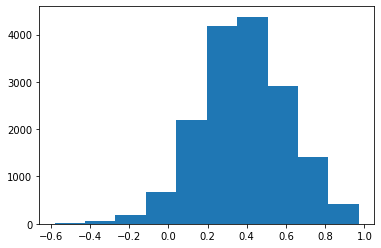

epoch 42


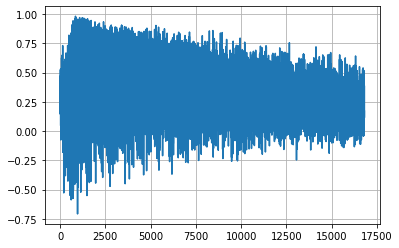

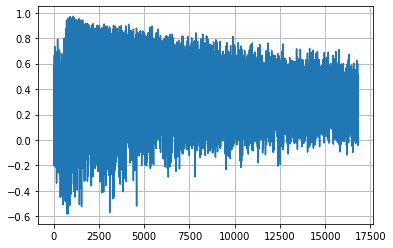

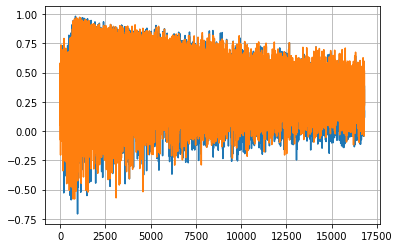

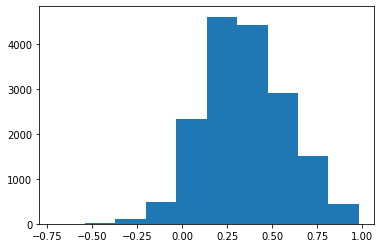

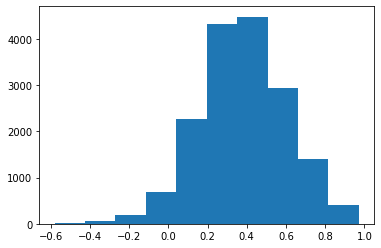

epoch 43


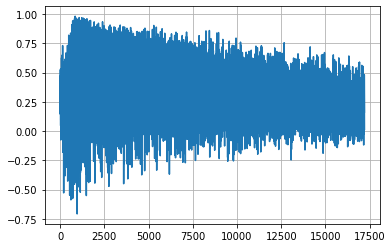

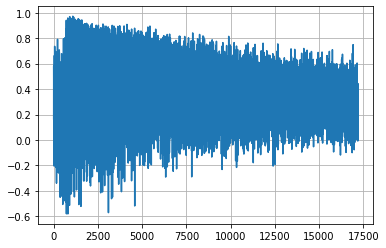

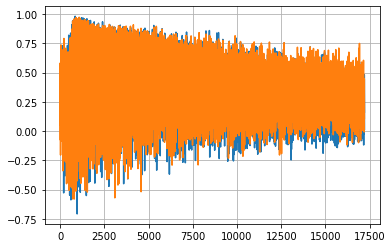

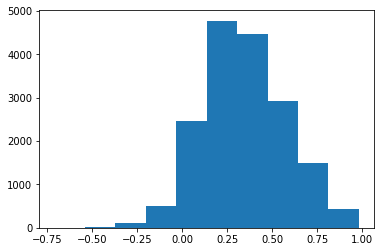

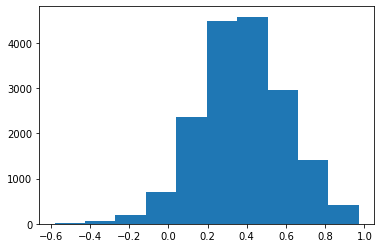

epoch 44


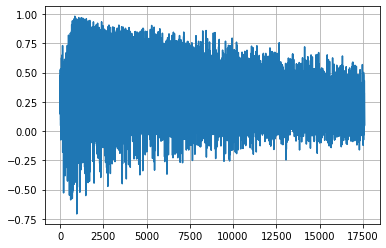

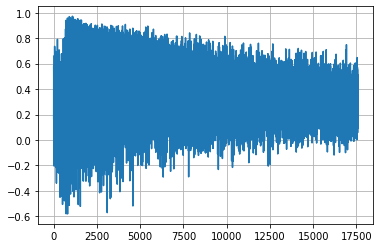

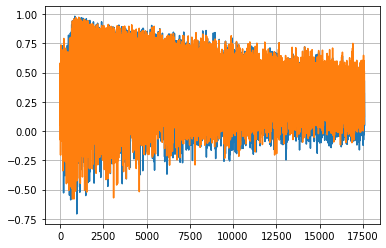

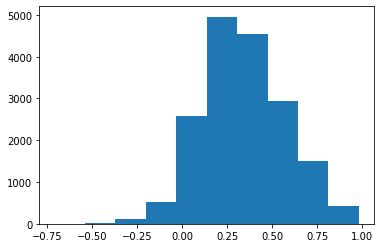

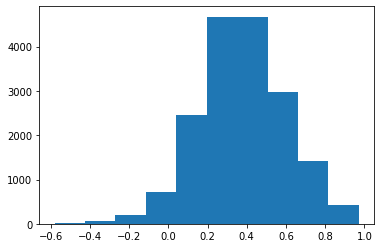

epoch 45


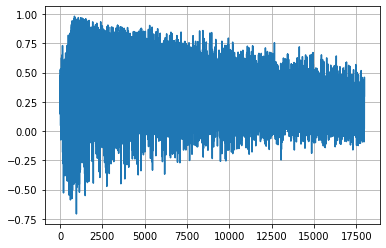

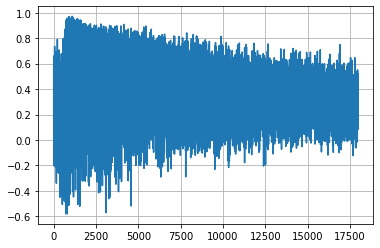

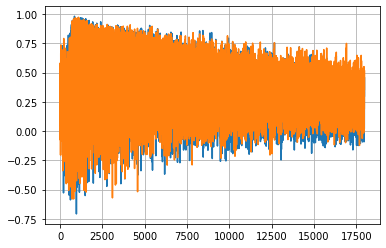

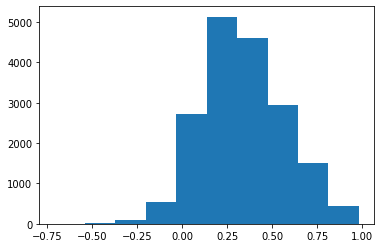

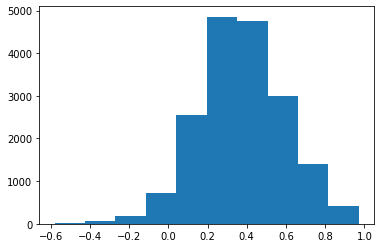

epoch 46


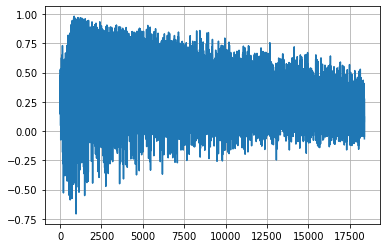

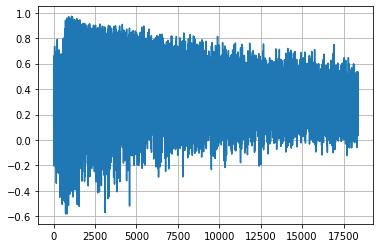

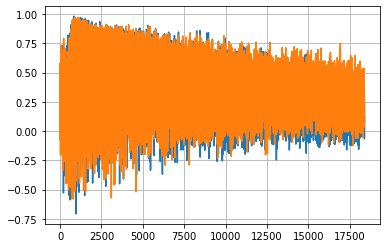

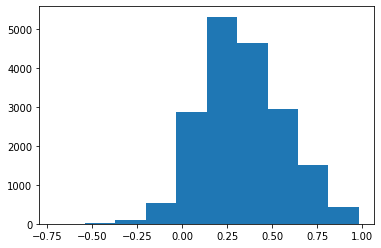

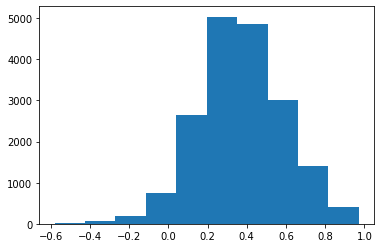

epoch 47


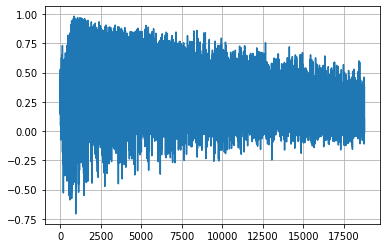

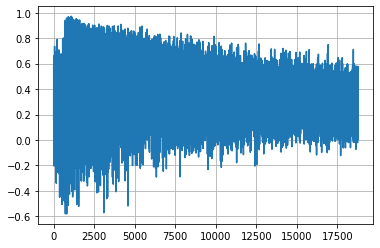

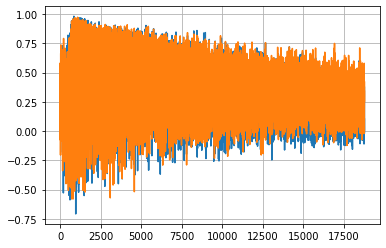

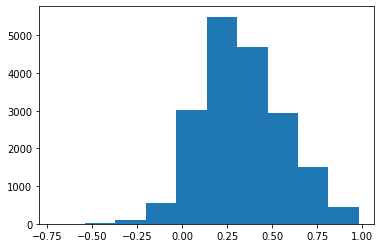

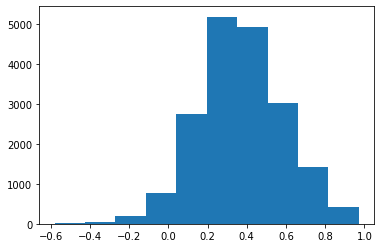

epoch 48


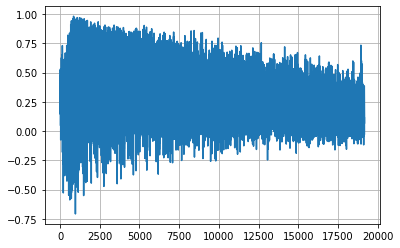

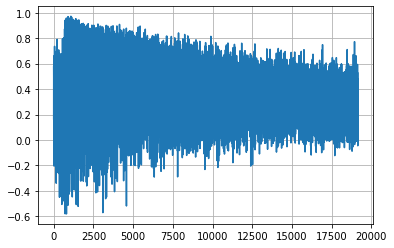

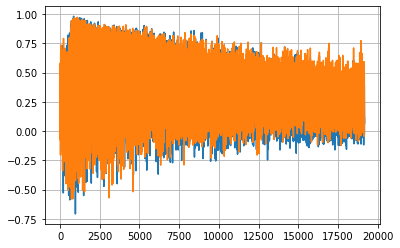

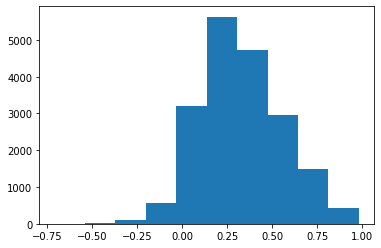

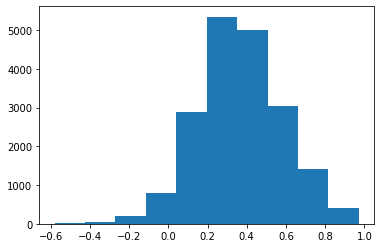

epoch 49


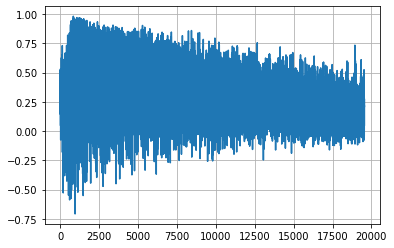

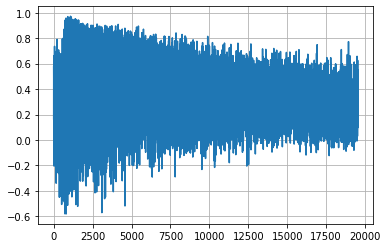

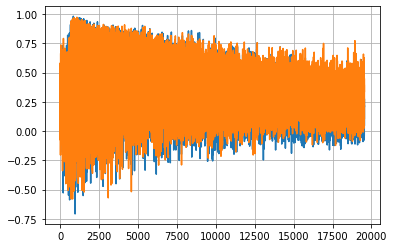

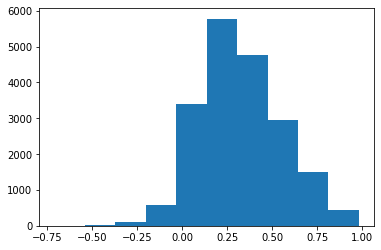

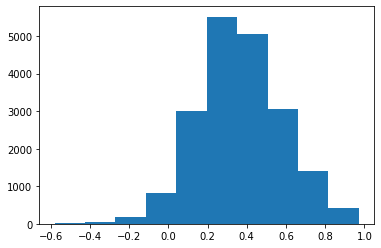

/home/fmejia/anaconda3/envs/pytorch1.4/lib/python3.6/site-packages/ipykernel_launcher.py:90: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


In [19]:
losses = []  
losses_syn = []

w = torch.tensor(net.get_param().cpu().detach().numpy(), requires_grad = True).to(device) 
class_criterion = nn.CrossEntropyLoss()

lr_synthetic = 1e-2
lr = 1e-2

# for i in range(1000):
n_epoch = 50
n_restarts = 1
gradient_align = []
gradient_align2 = []
gradient_align3 = []
gradient_align4 = []
criterion = nn.CrossEntropyLoss()
cos = nn.CosineSimilarity(dim = 0)
for ii in range(n_restarts):
    print('n_restart = ' + str(ii))
    net = utils.ResNet('BasicBlock', [2, 2, 2, 2], num_classes=10)
    net = net.to(device)
    w0 = torch.tensor(net.get_param().cpu().detach().numpy(), requires_grad = True).to(device)    
    for jj in range(n_epoch):

        for batch, batch_eval, batch_eval2, batch_train, batch_alt in zip(
            cifar10_trainloader, cifar10_testloader5, cifar10_testloader5, cifar10_trainloader, alt_trainloader): 
            imgs, labels,_ = batch
            imgs_eval, labels_eval = batch_eval
            imgs_eval2, labels_eval2 = batch_eval2
            imgs_train, labels_train,_ = batch_train
            imgs_alt, labels_alt = batch_alt
            
            imgs, labels = imgs.to(device), labels.to(device)  
            imgs_eval, labels_eval = imgs_eval.to(device), labels_eval.to(device)
            imgs_eval2, labels_eval2 = imgs_eval2.to(device), labels_eval2.to(device)
            imgs_train, labels_train = imgs_train.to(device), labels_train.to(device)
            imgs_alt, labels_alt = imgs_alt.to(device), labels_alt.to(device)
            ## train with weighted data
            with torch.enable_grad():
                output = net.forward_with_param(imgs, w0)
                loss = criterion(output, labels)
            gw, = torch.autograd.grad(loss, w0, grad_outputs = torch.tensor(lr).to(device)) 

            
            
            outputs = net.forward_with_param(imgs_train, w0)
            loss = class_criterion(outputs, labels_train) 
            ggw, = torch.autograd.grad(loss, w0) 

            ## test loss
            outputs = net.forward_with_param(imgs_eval, w0)
            loss_test = class_criterion(outputs, labels_eval) 
            dw, = torch.autograd.grad(loss_test, w0)
            
            ## test loss
            outputs = net.forward_with_param(imgs_eval2, w0)
            loss_test = class_criterion(outputs, labels_eval2) 
            dw2, = torch.autograd.grad(loss_test, w0)
#             gradient_align.append((gw*dw).sum().item())
#             gradient_align2.append((gw*ggw).sum().item())
            ## test loss
            outputs = net.forward_with_param(imgs_alt, w0)
            loss_test = class_criterion(outputs, labels_alt) 
            dw3, = torch.autograd.grad(loss_test, w0)
            
            gradient_align.append(cos(gw,dw).item())
            gradient_align2.append(cos(gw,ggw).item())
            gradient_align3.append(cos(dw,dw2).item())
            gradient_align4.append(cos(gw,dw3).item())
            w0 = w0.sub(gw).requires_grad_()

        print('epoch ' + str(jj))    

        plt.plot(gradient_align)
        plt.grid(True)
        plt.show() 
        plt.plot(gradient_align2)
        plt.grid(True)
        plt.show()
        plt.plot(gradient_align)
        plt.plot(gradient_align2)
        plt.grid(True)
        plt.show()
        plt.hist(gradient_align)
        plt.show()
        plt.hist(gradient_align2)
        plt.show()
#         eval_target_net(net, cifar10_testloader, w0, classes=classes)
w = torch.tensor(w0[:])

In [22]:
eval_target_net(net, cifar10_testloader, w0, classes=classes)

Accuracy of airplane : 78.40 %
Accuracy of automobile : 82.90 %
Accuracy of bird : 63.10 %
Accuracy of cat : 56.20 %
Accuracy of deer : 57.90 %
Accuracy of dog : 67.40 %
Accuracy of frog : 86.40 %
Accuracy of horse : 70.80 %
Accuracy of ship : 83.70 %
Accuracy of truck : 71.30 %

Total accuracy = 71.81 %




71.81

Files already downloaded and verified
n_restart = 0
epoch 0


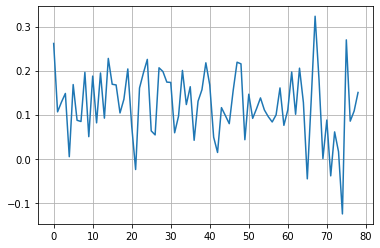

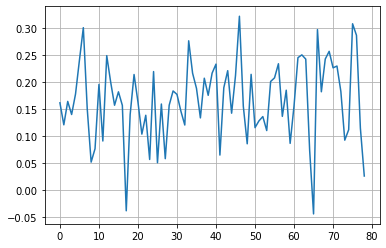

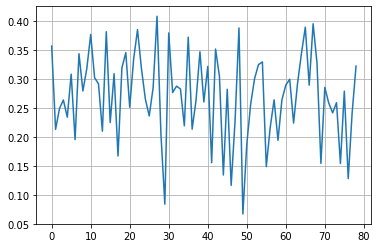

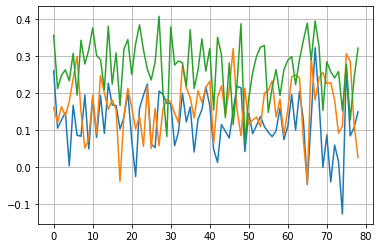

epoch 1


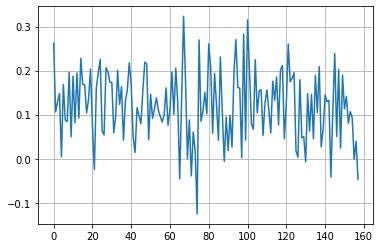

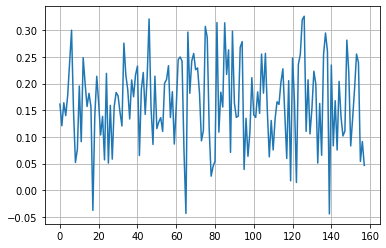

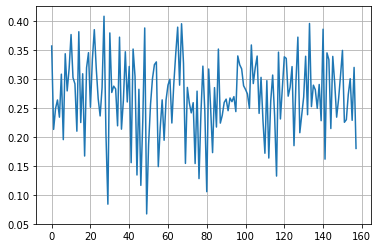

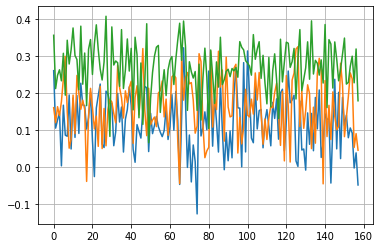

epoch 2


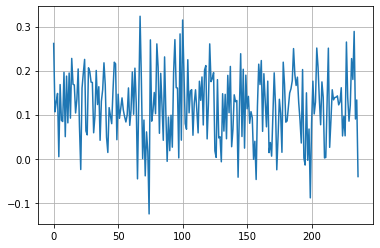

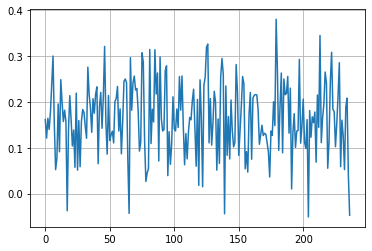

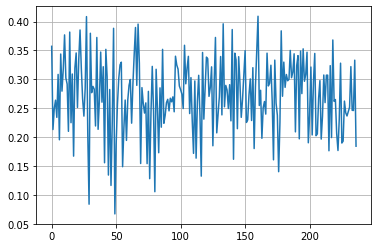

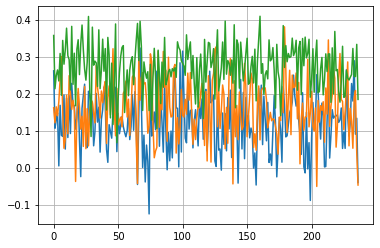

epoch 3


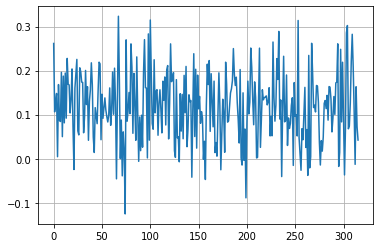

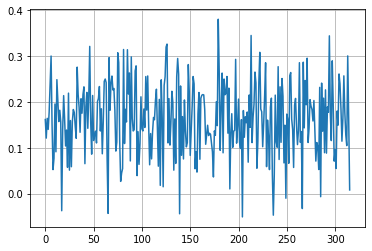

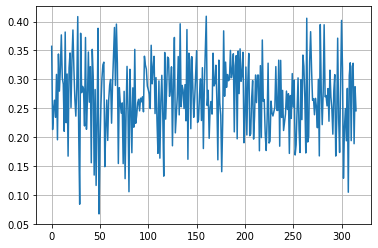

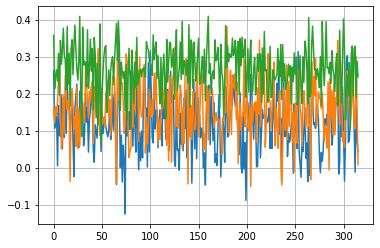

epoch 4


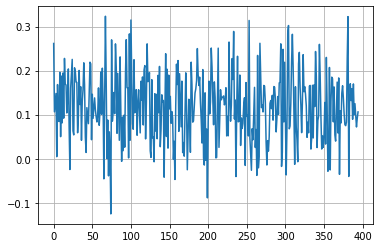

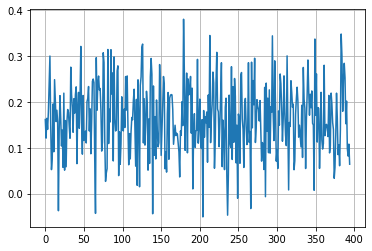

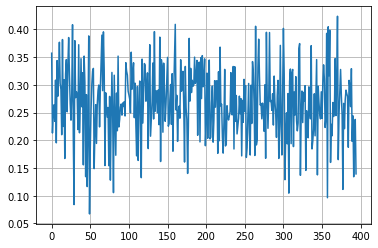

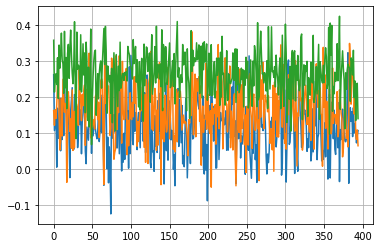

epoch 5


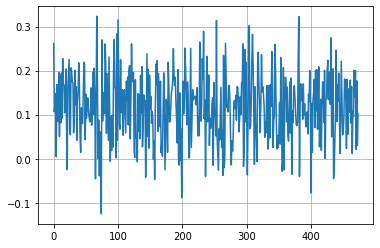

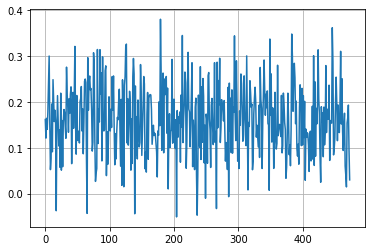

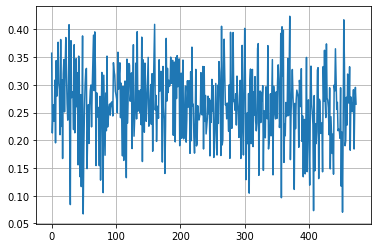

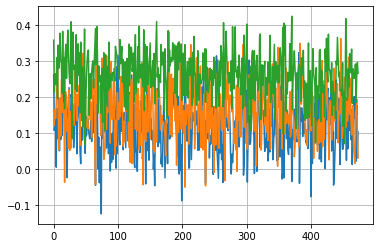

epoch 6


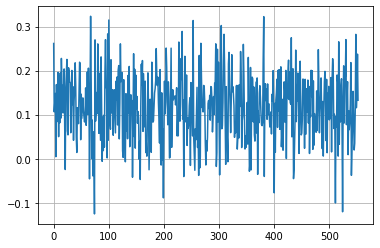

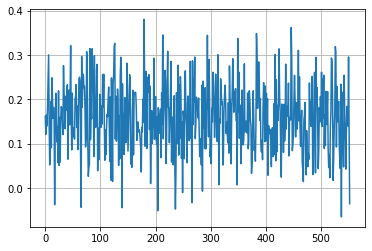

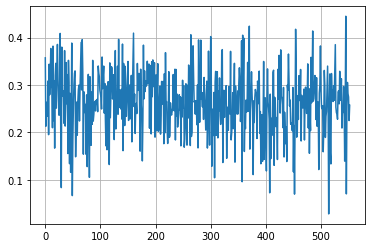

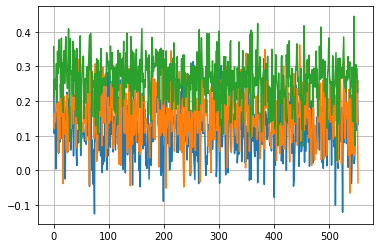

epoch 7


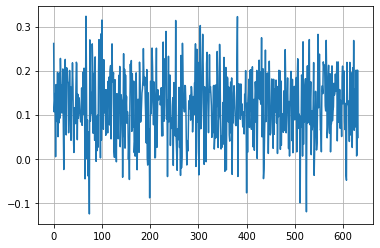

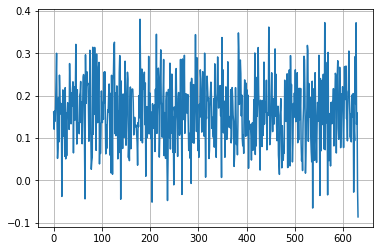

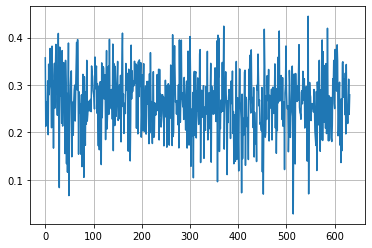

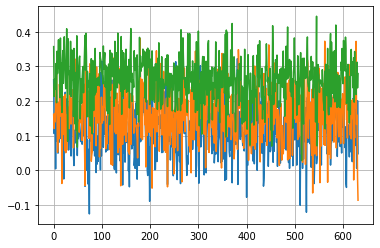

epoch 8


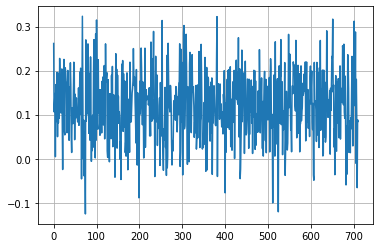

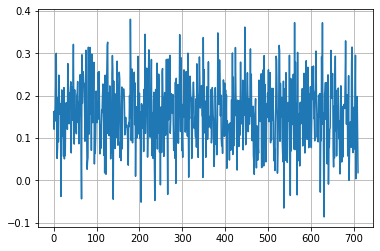

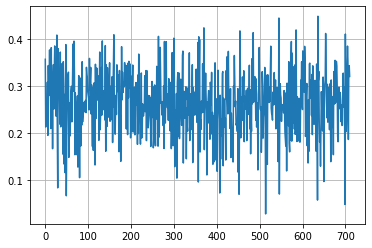

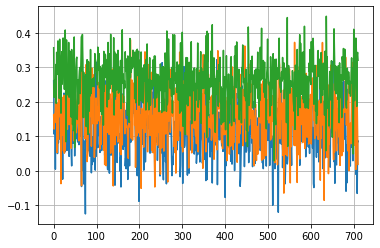

epoch 9


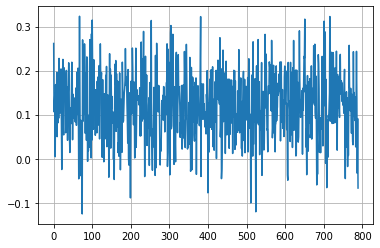

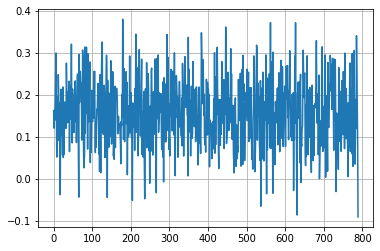

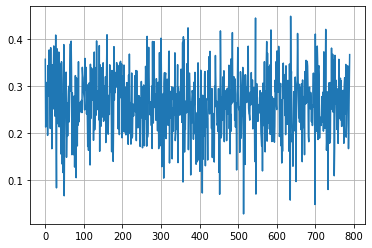

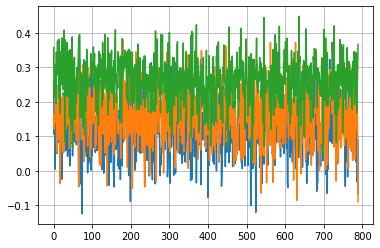

epoch 10


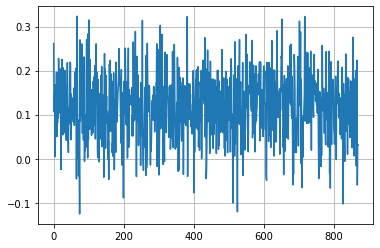

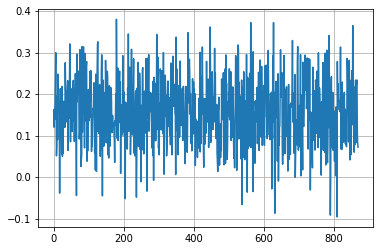

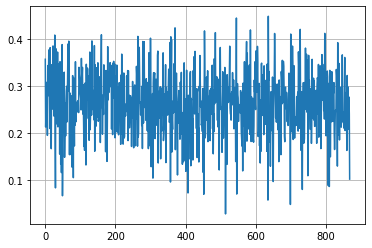

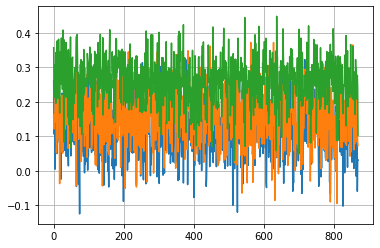

epoch 11


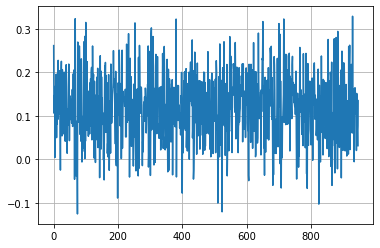

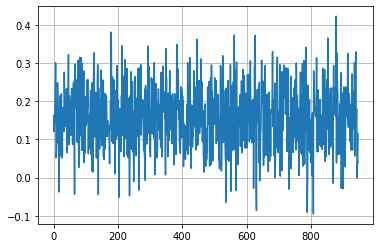

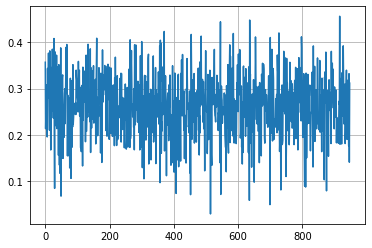

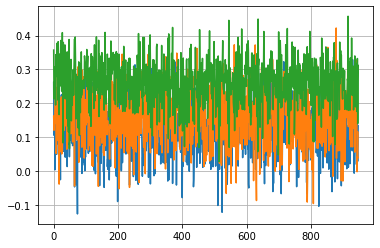

epoch 12


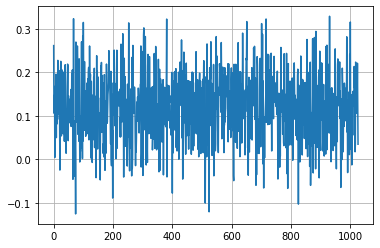

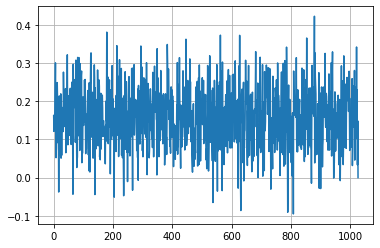

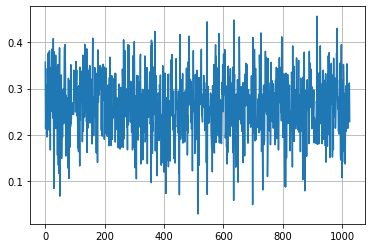

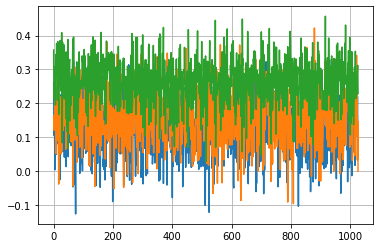

epoch 13


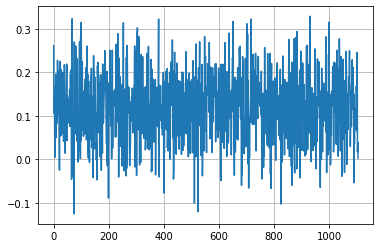

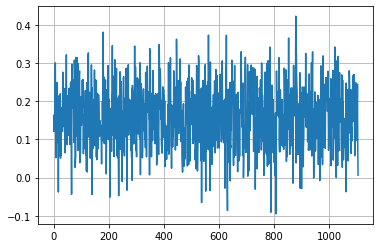

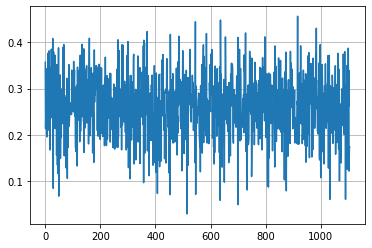

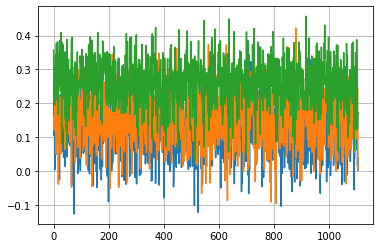

epoch 14


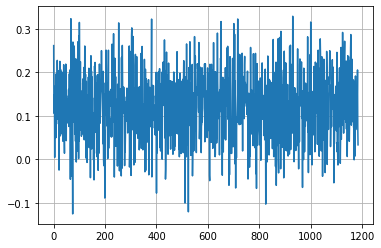

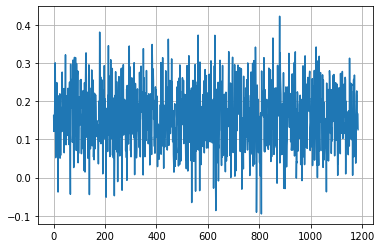

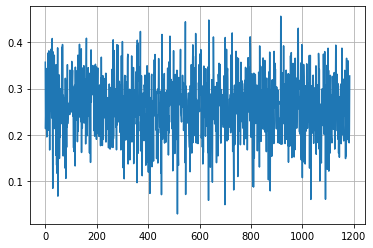

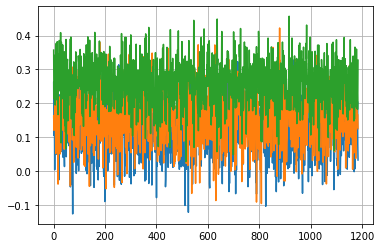

epoch 15


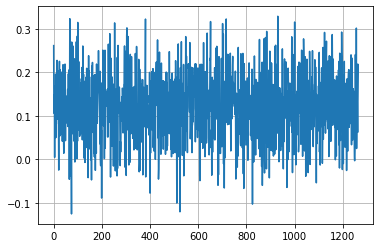

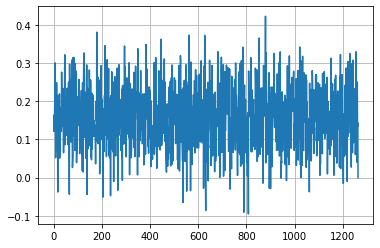

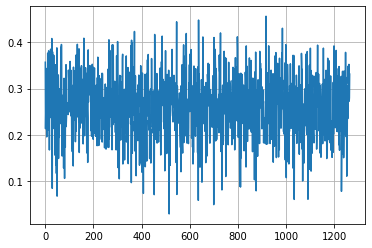

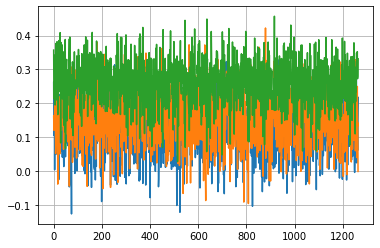

epoch 16


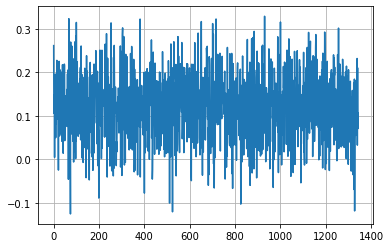

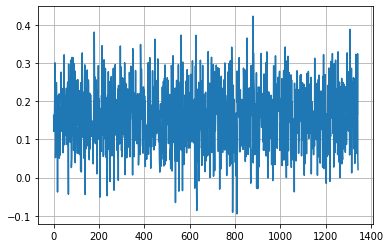

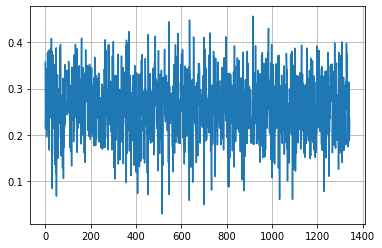

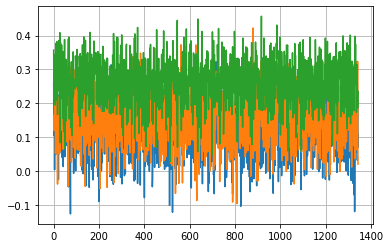

epoch 17


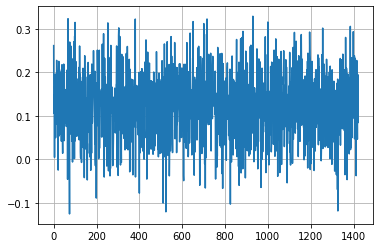

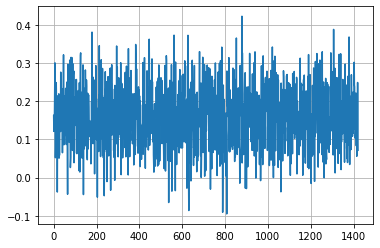

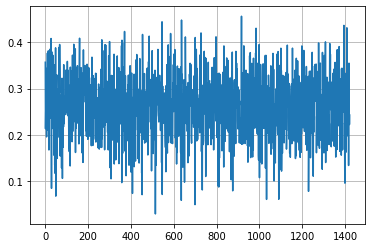

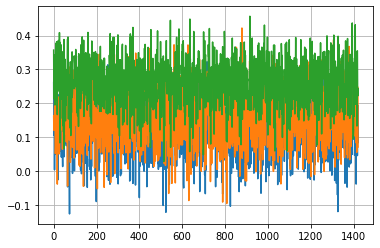

epoch 18


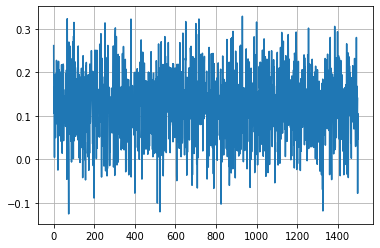

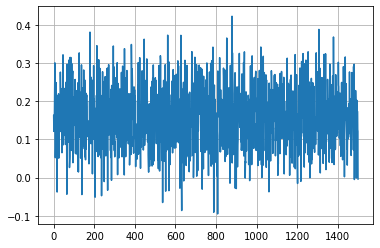

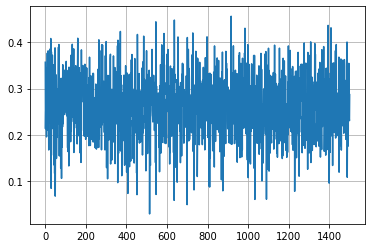

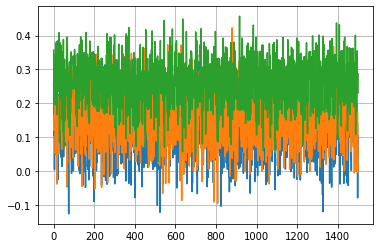

epoch 19


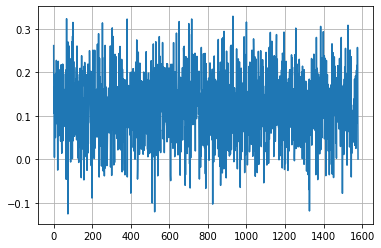

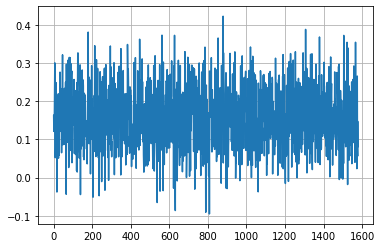

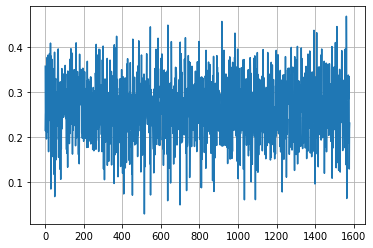

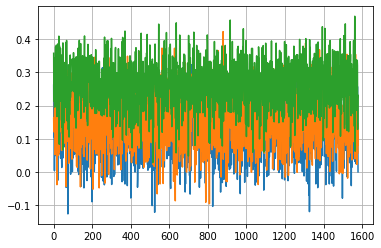

epoch 20


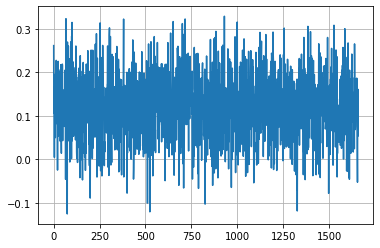

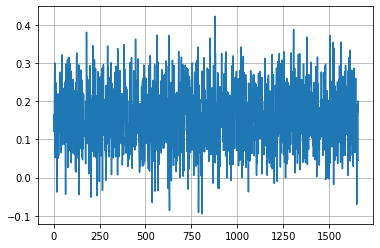

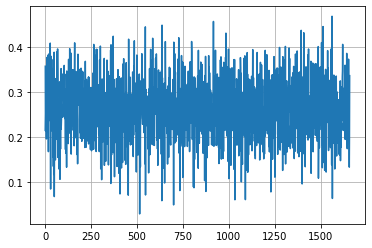

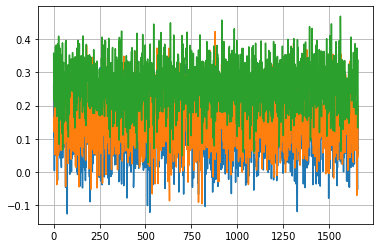

epoch 21


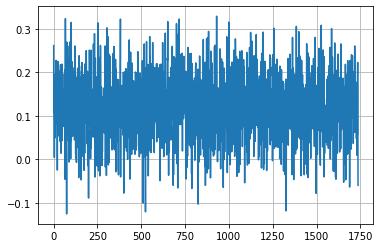

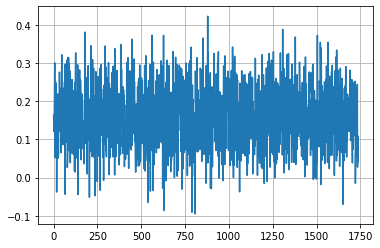

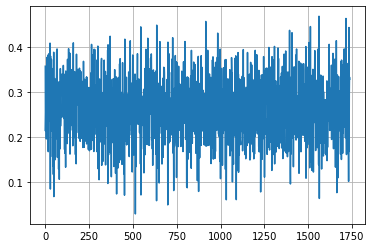

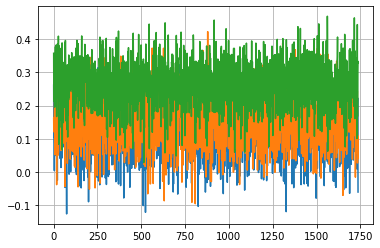

epoch 22


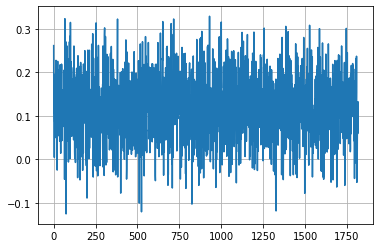

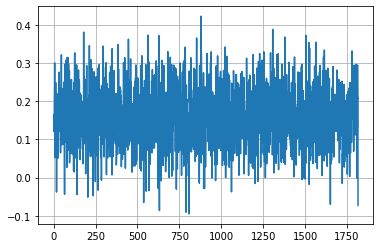

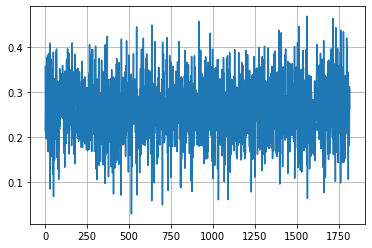

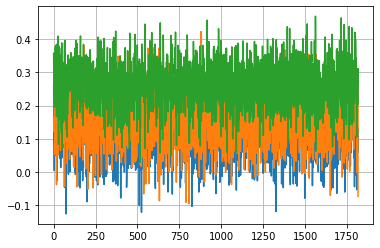

epoch 23


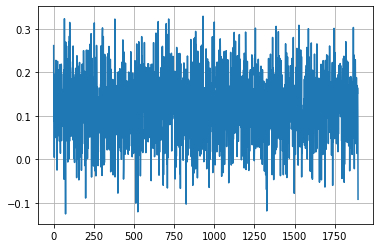

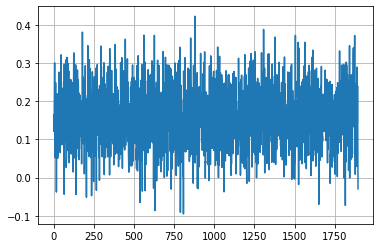

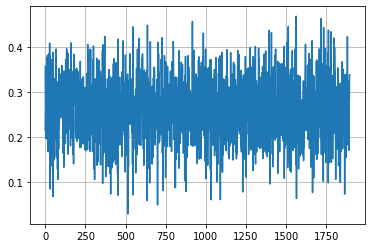

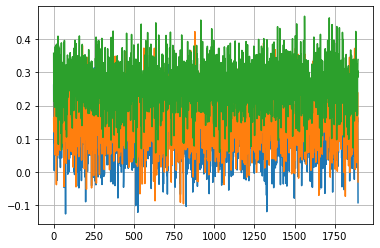

epoch 24


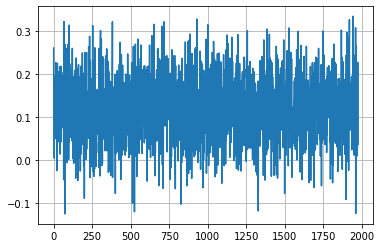

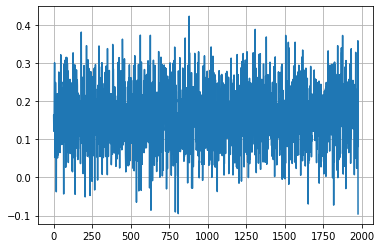

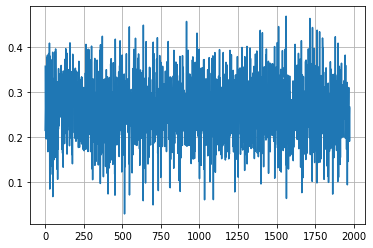

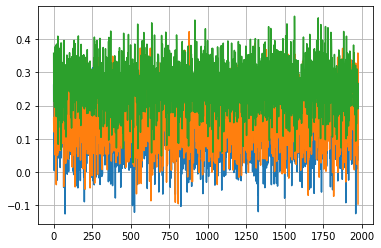

epoch 25


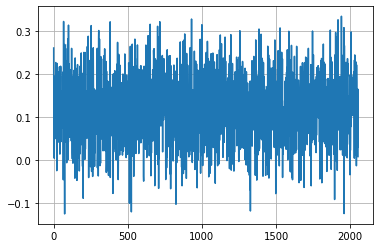

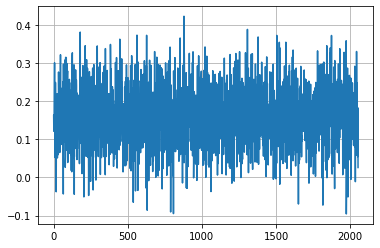

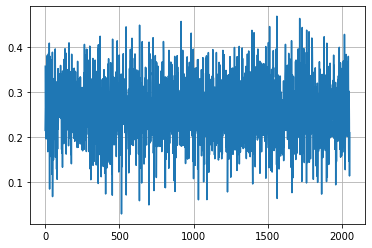

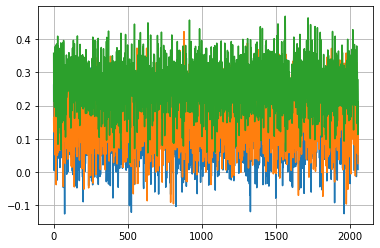

epoch 26


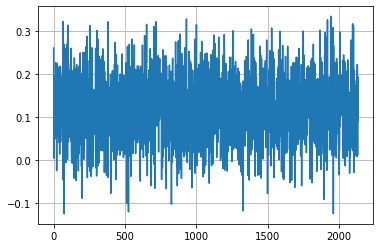

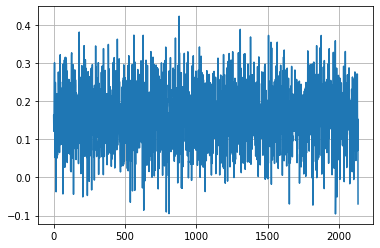

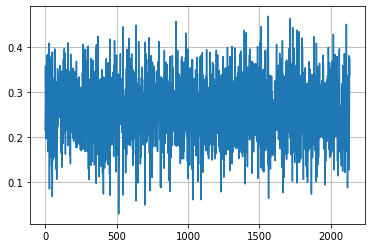

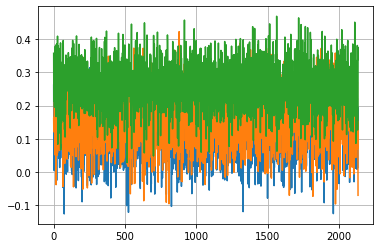

epoch 27


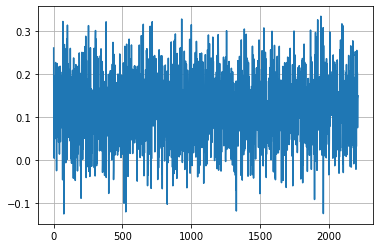

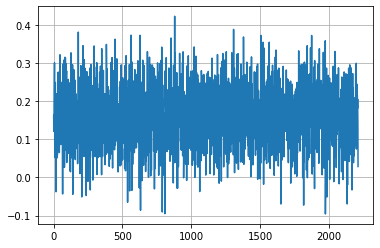

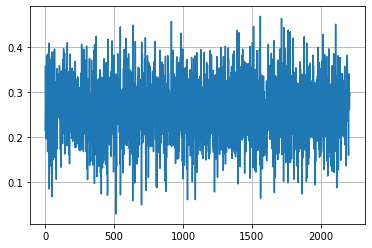

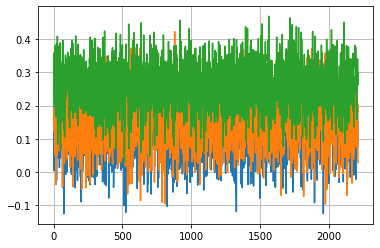

epoch 28


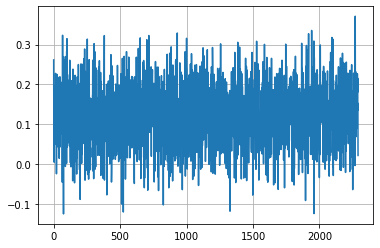

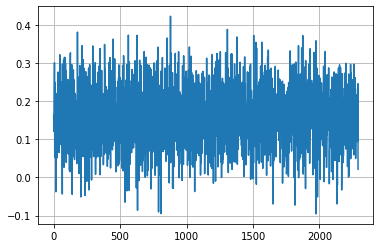

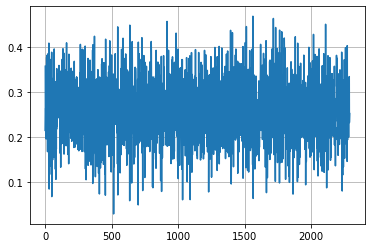

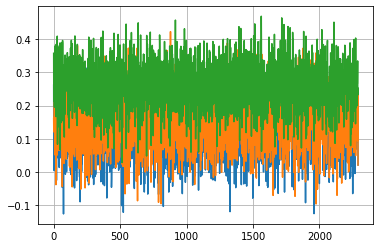

epoch 29


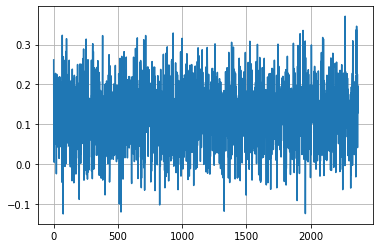

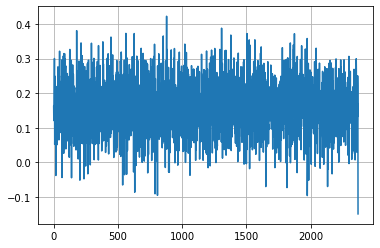

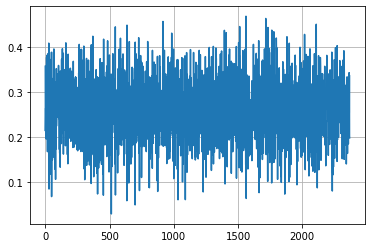

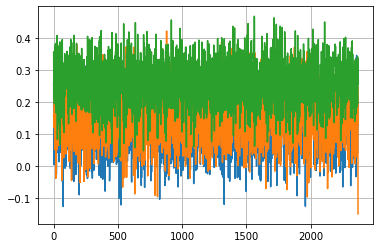

epoch 30


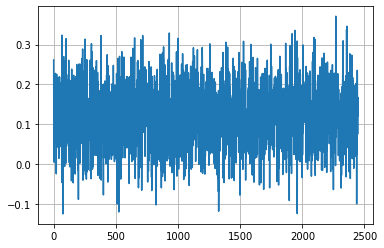

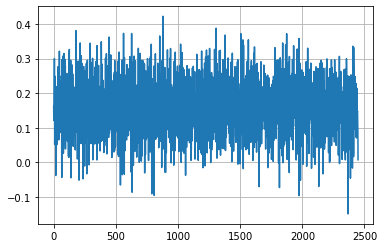

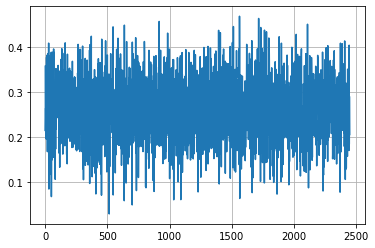

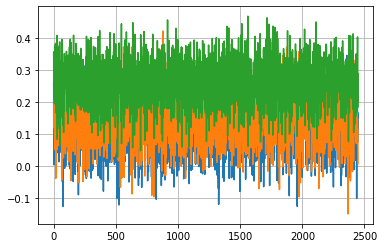

epoch 31


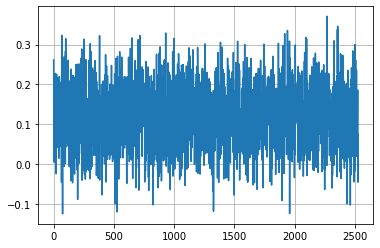

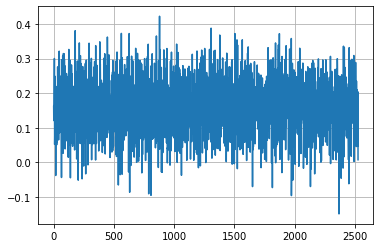

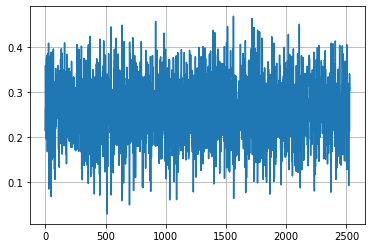

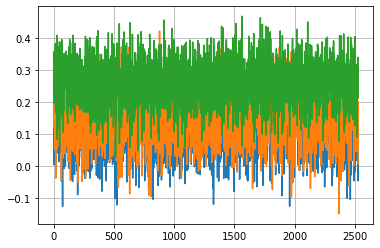

epoch 32


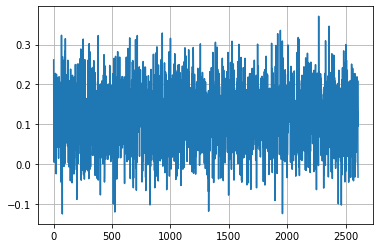

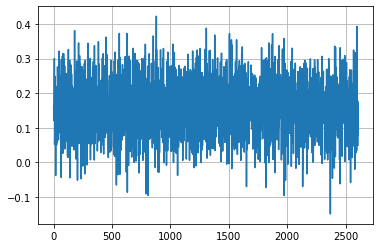

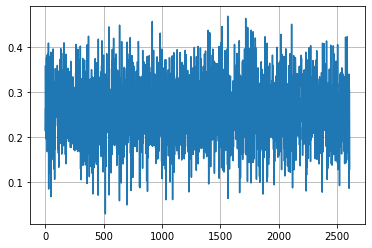

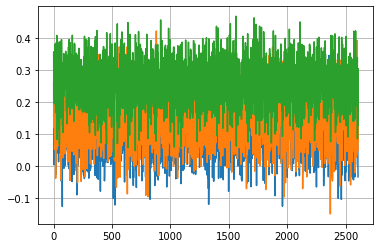

epoch 33


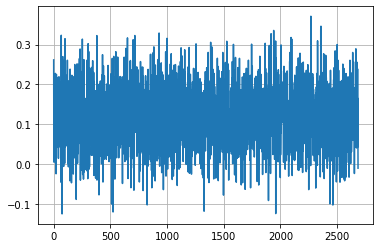

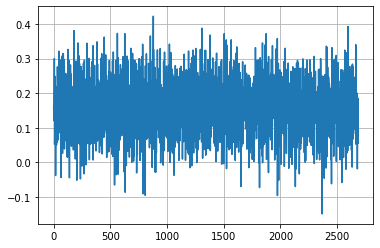

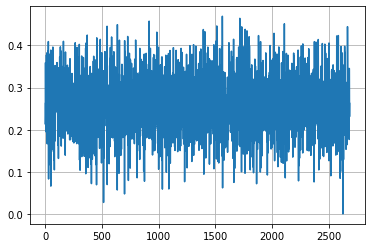

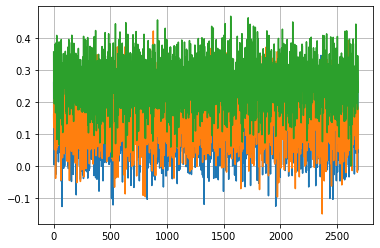

epoch 34


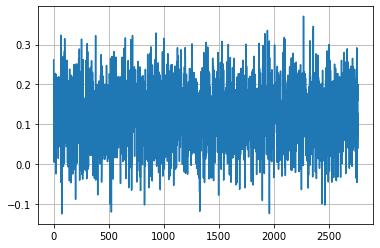

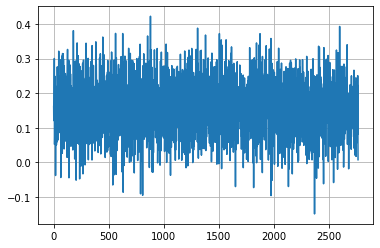

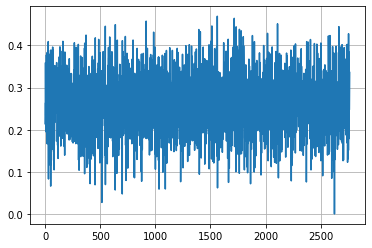

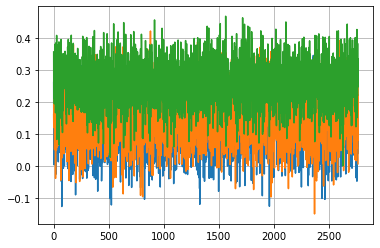

epoch 35


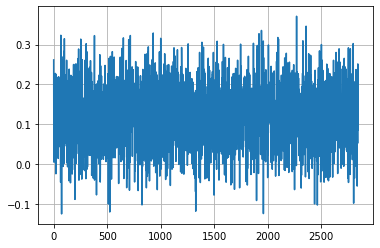

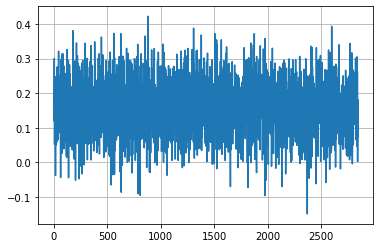

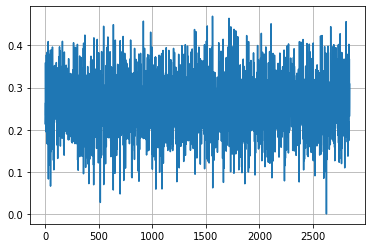

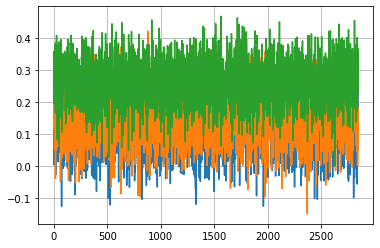

epoch 36


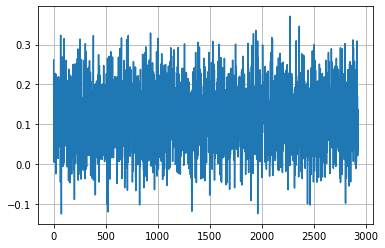

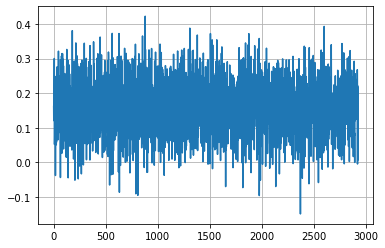

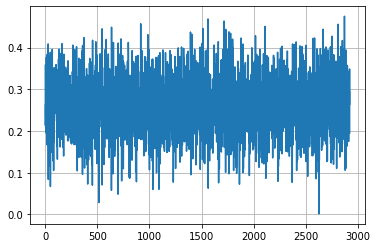

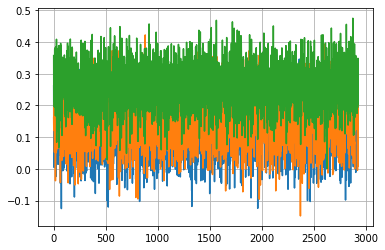

epoch 37


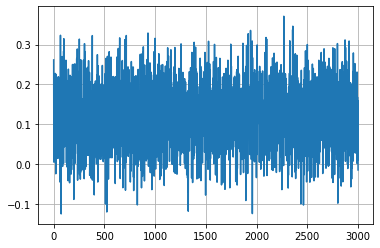

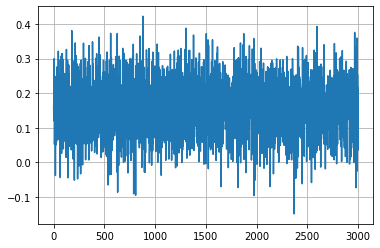

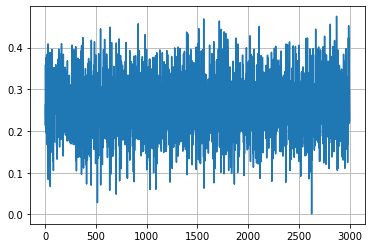

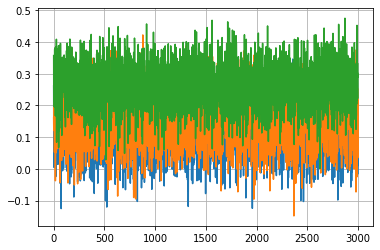

epoch 38


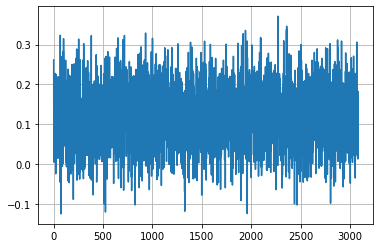

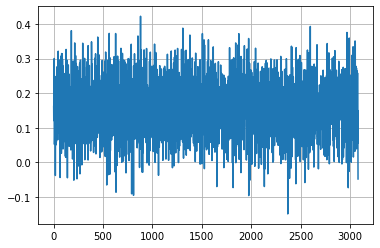

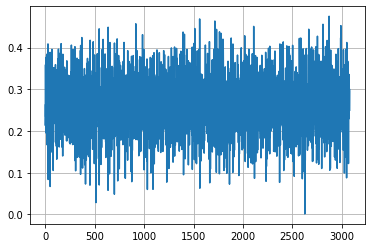

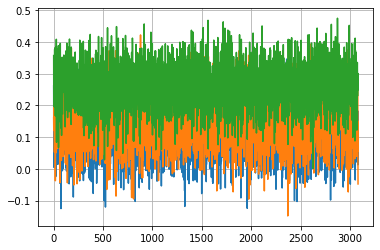

epoch 39


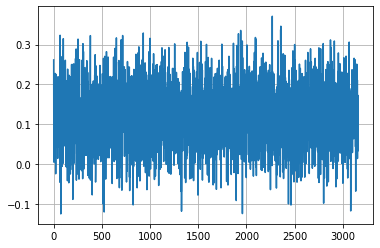

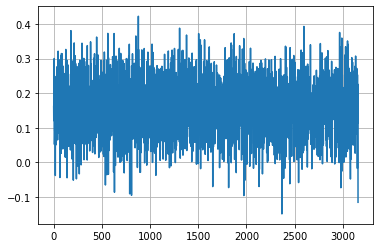

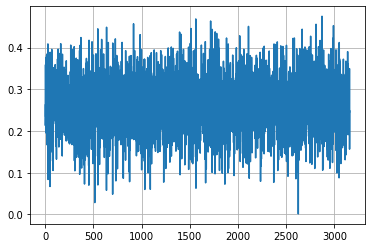

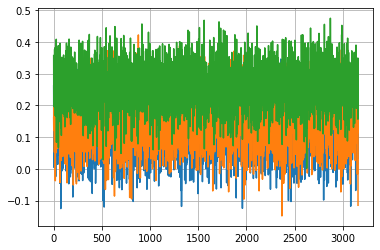

epoch 40


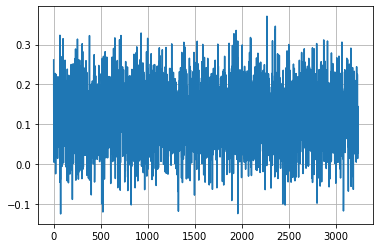

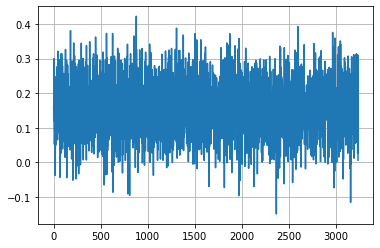

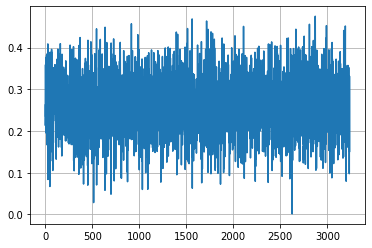

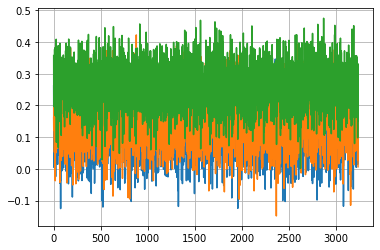

epoch 41


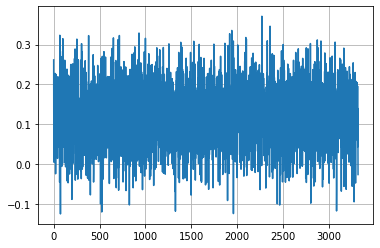

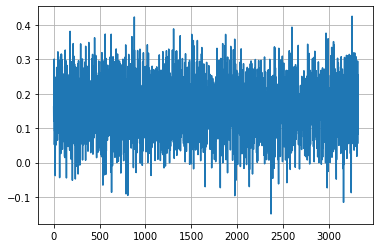

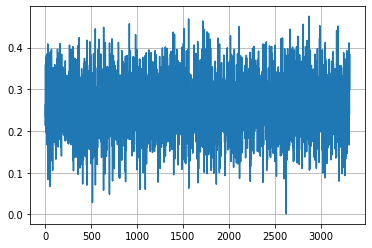

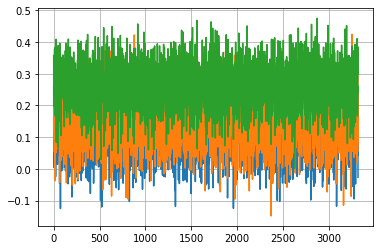

epoch 42


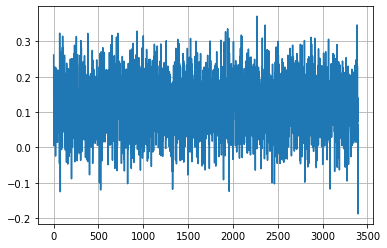

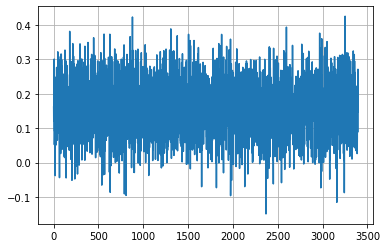

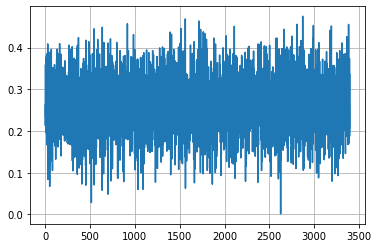

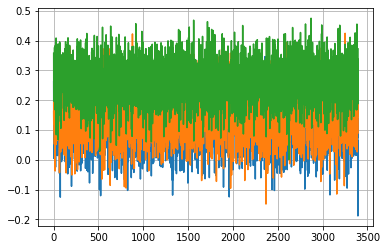

epoch 43


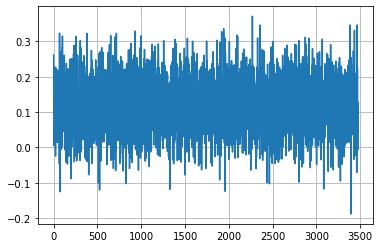

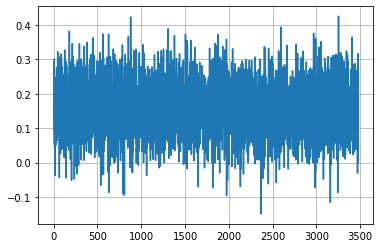

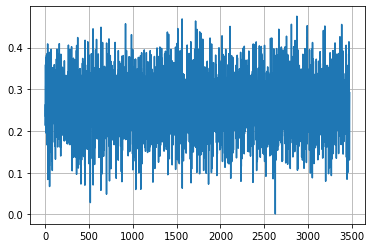

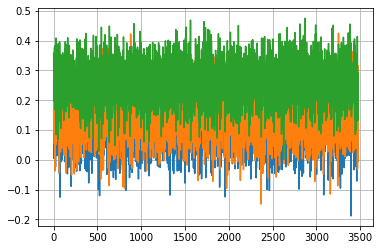

epoch 44


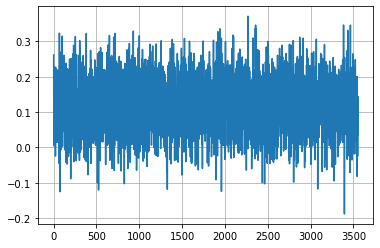

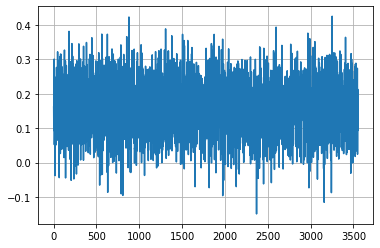

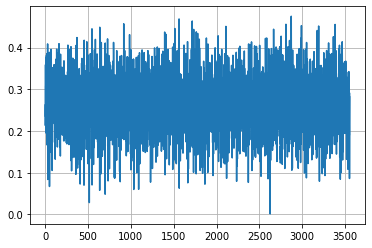

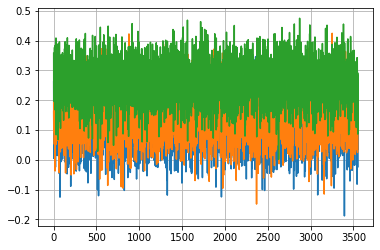

epoch 45


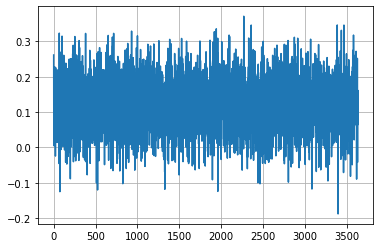

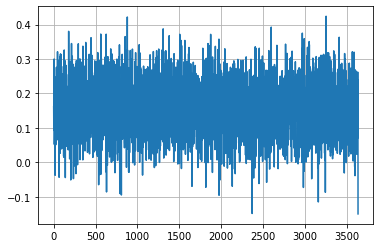

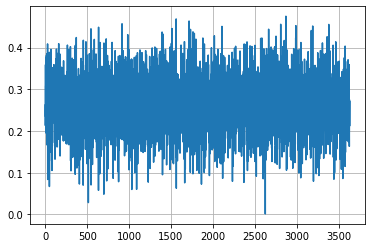

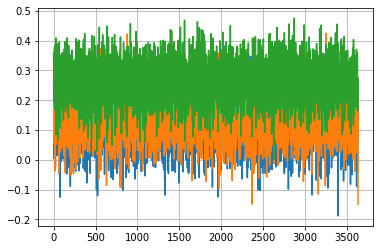

epoch 46


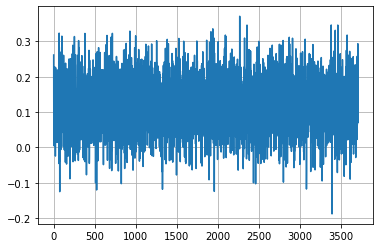

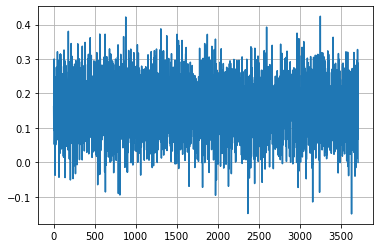

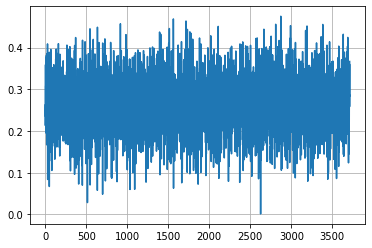

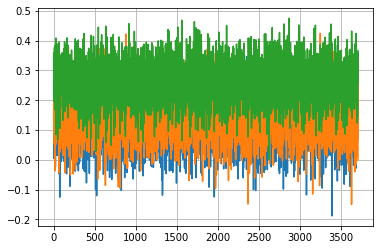

epoch 47


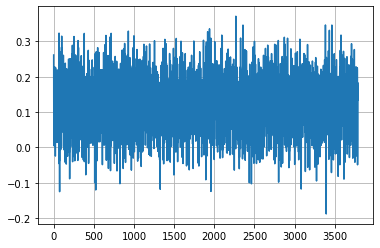

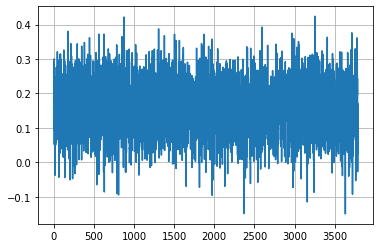

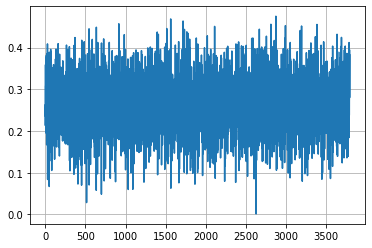

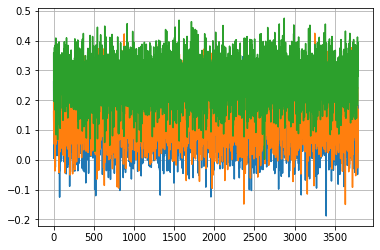

epoch 48


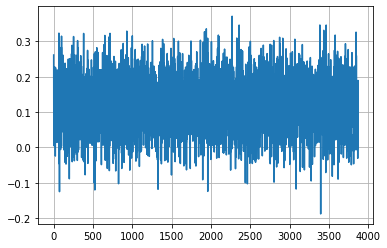

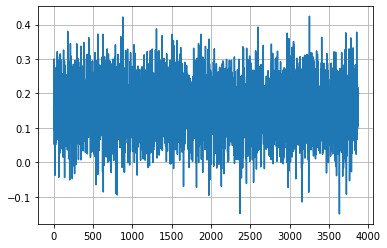

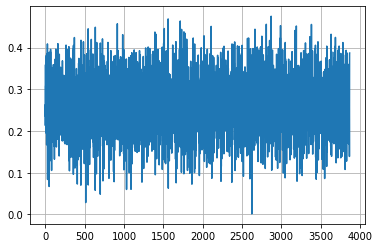

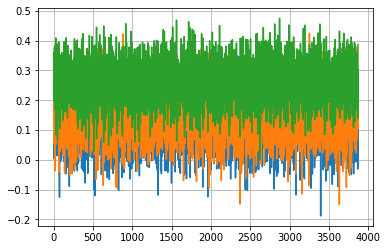

epoch 49


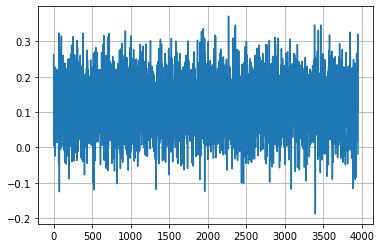

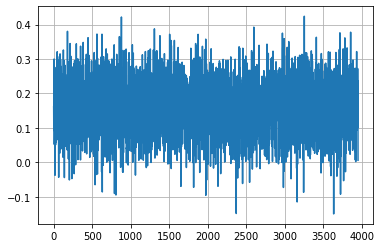

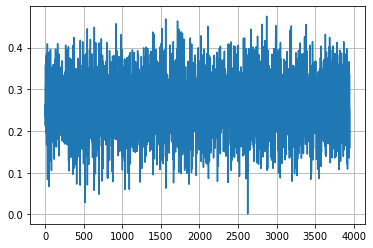

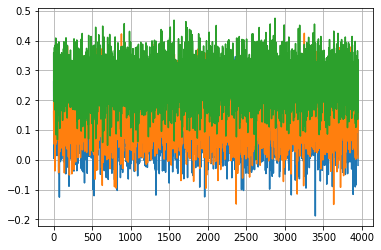

n_restart = 1
epoch 0


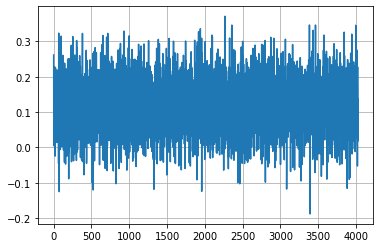

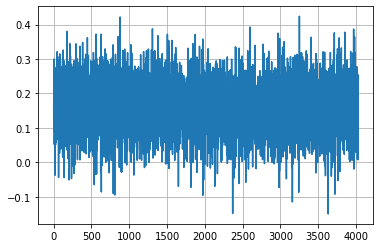

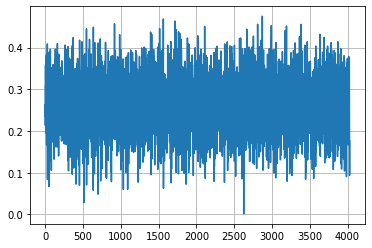

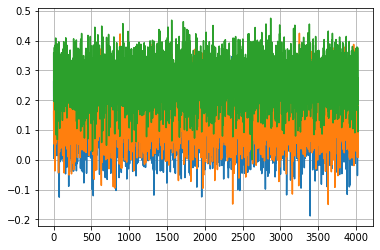

epoch 1


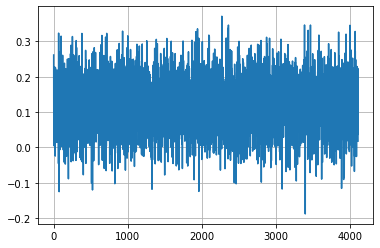

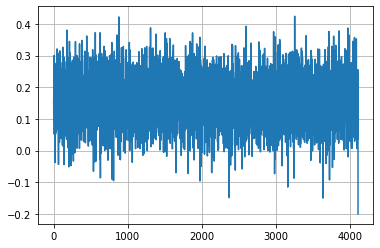

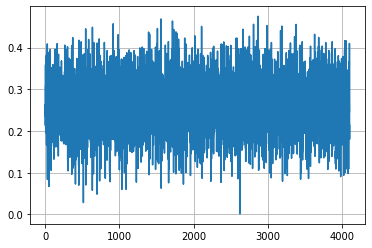

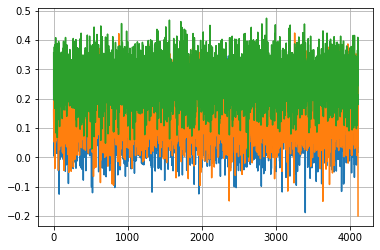

epoch 2


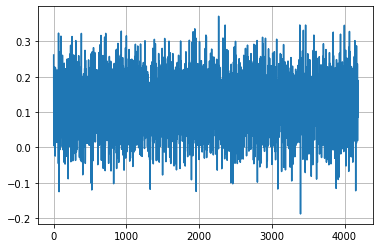

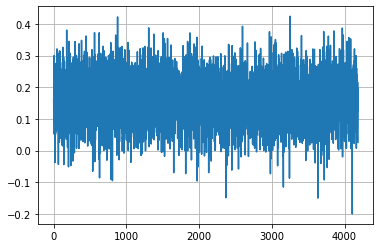

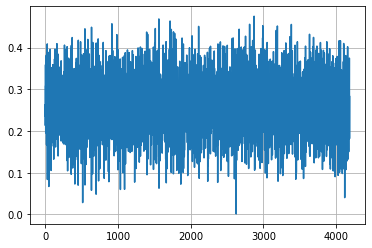

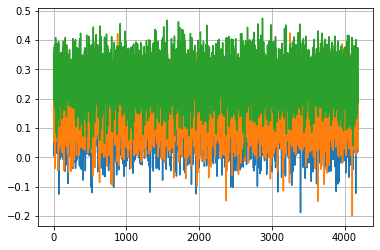

epoch 3


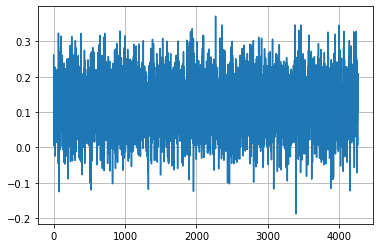

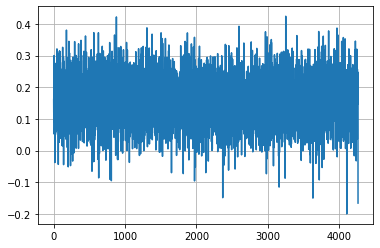

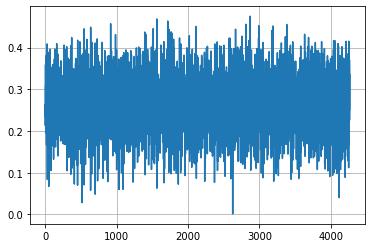

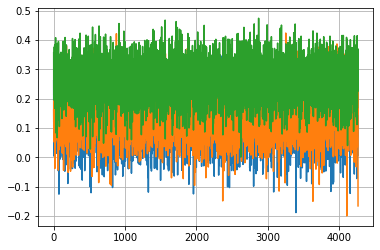

epoch 4


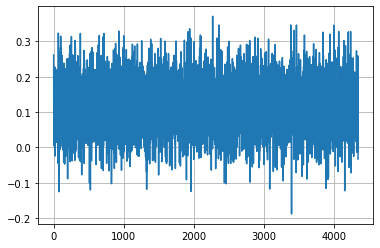

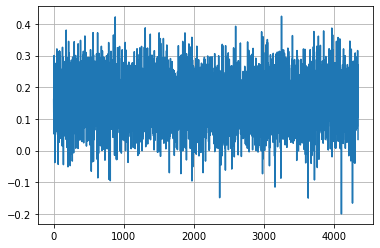

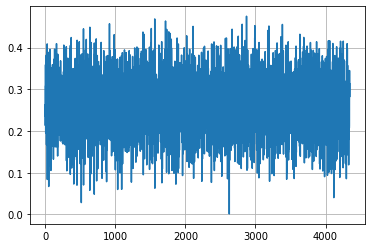

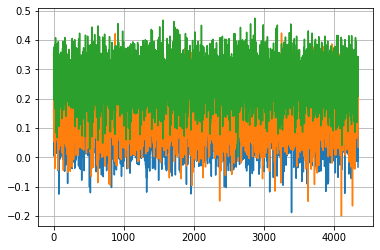

epoch 5


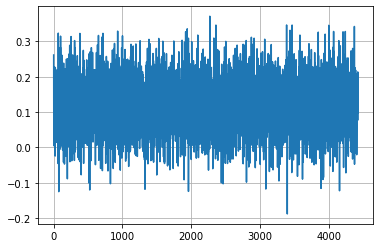

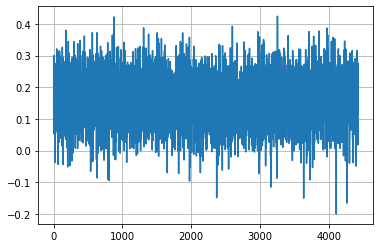

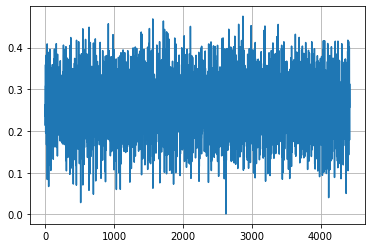

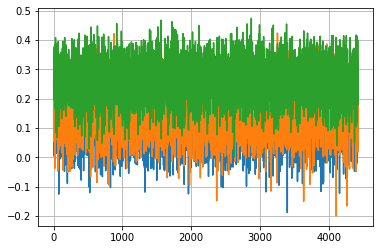

epoch 6


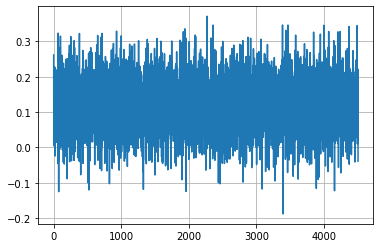

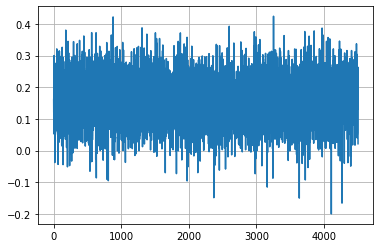

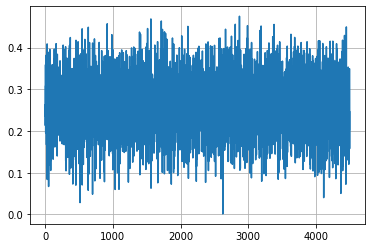

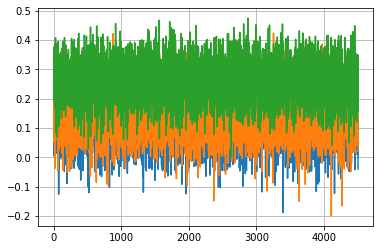

epoch 7


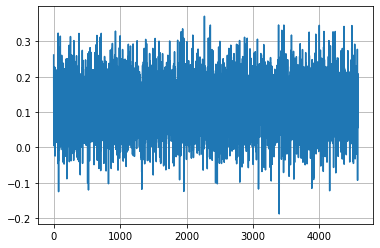

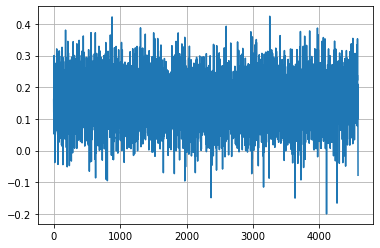

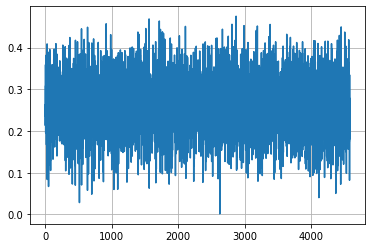

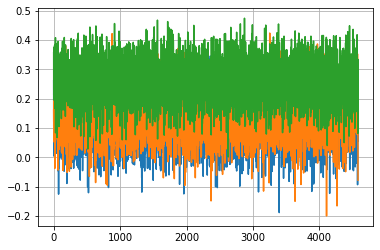

epoch 8


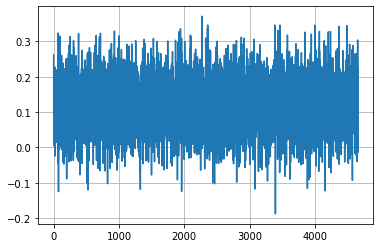

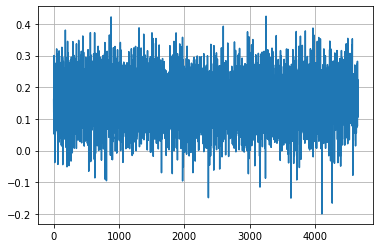

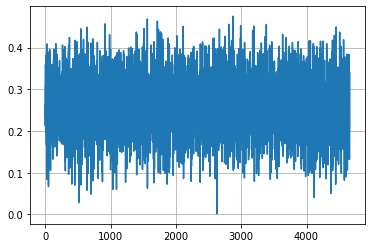

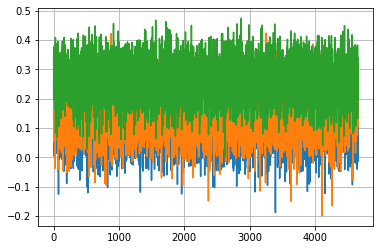

epoch 9


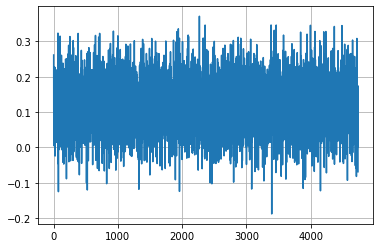

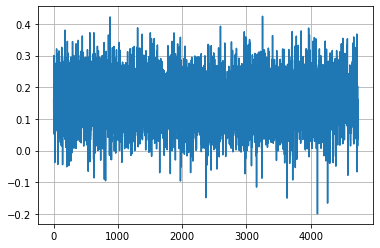

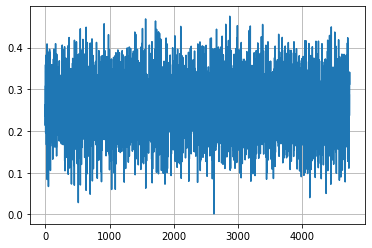

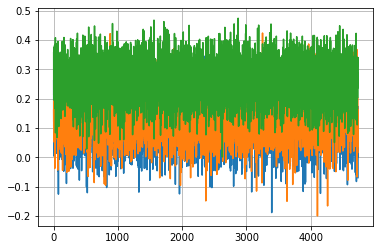

epoch 10


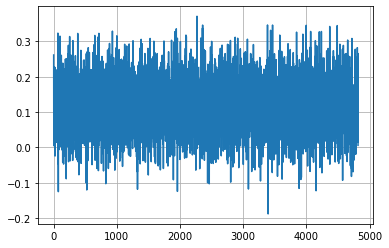

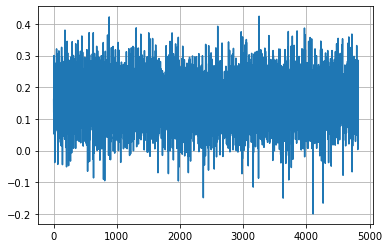

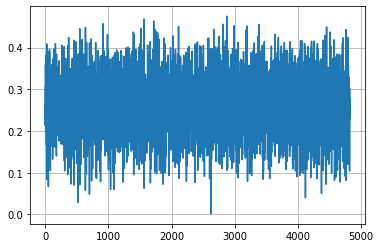

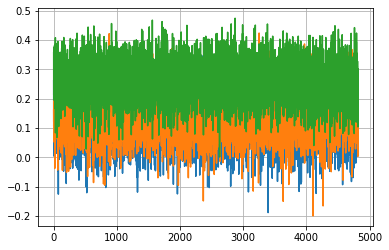

epoch 11


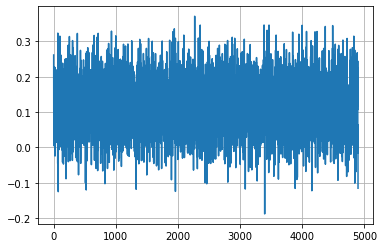

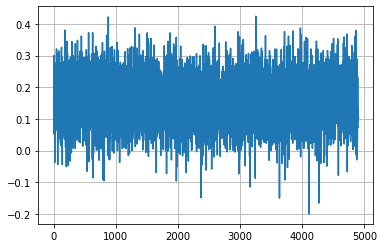

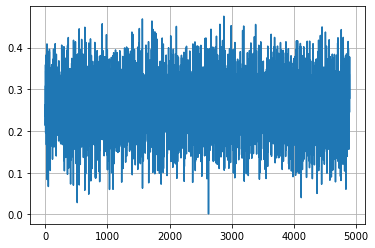

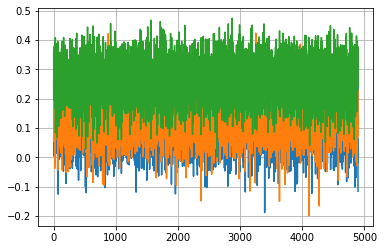

epoch 12


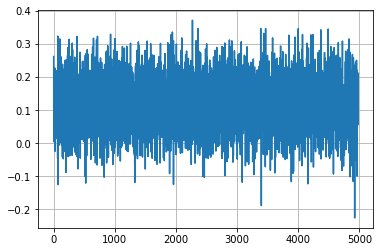

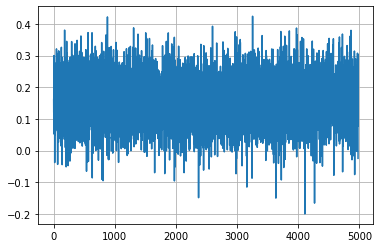

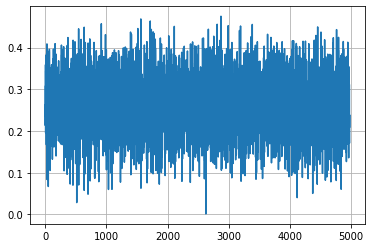

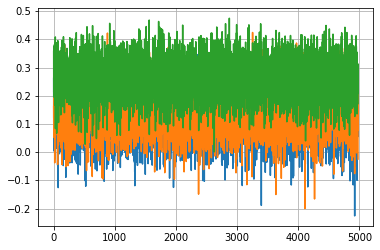

epoch 13


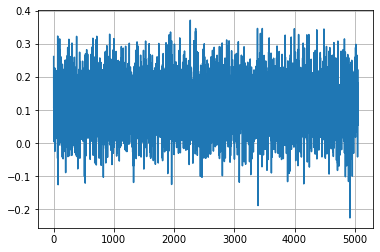

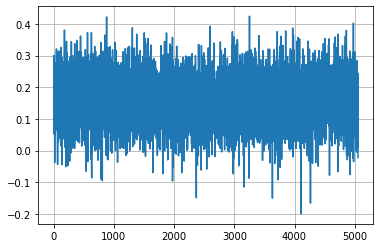

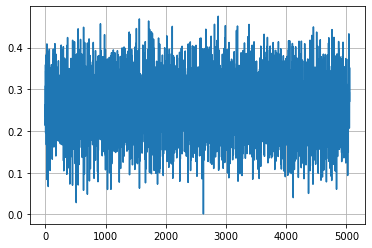

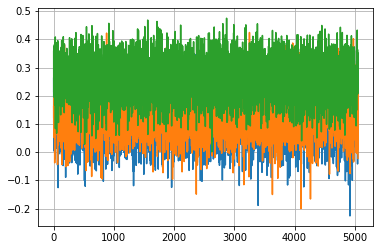

epoch 14


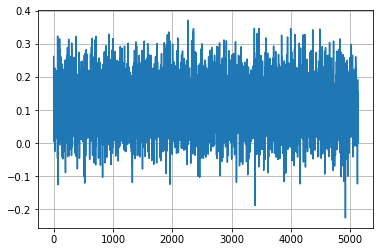

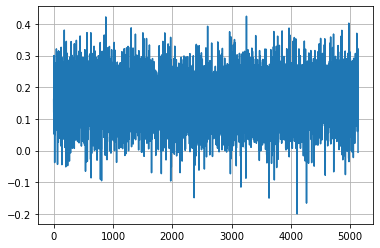

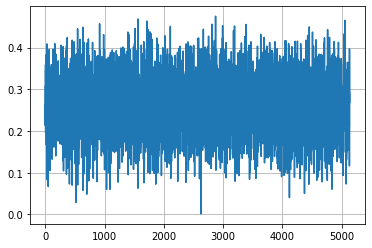

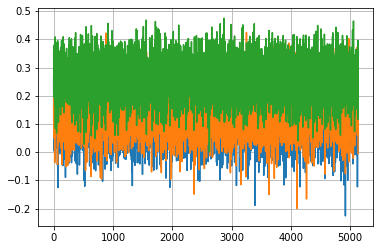

epoch 15


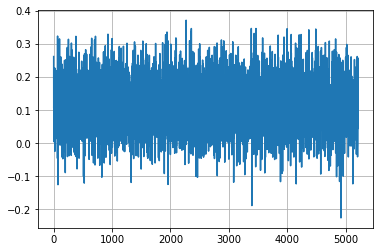

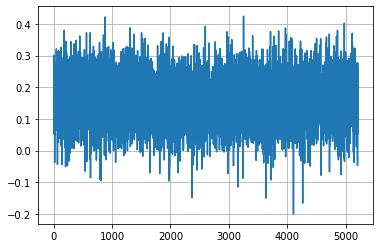

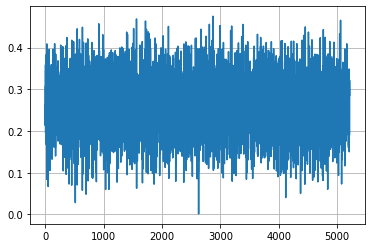

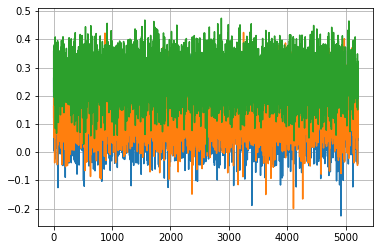

epoch 16


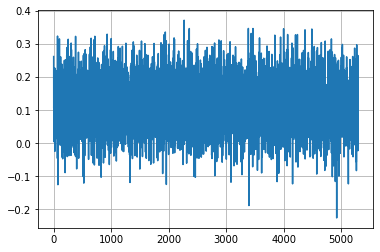

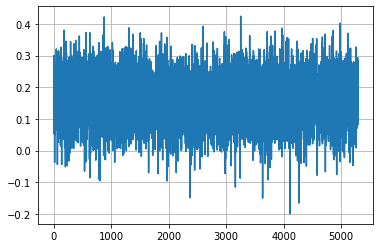

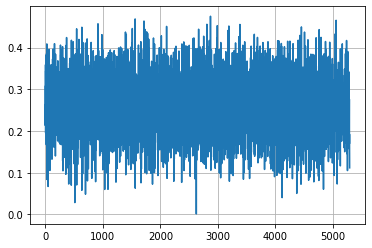

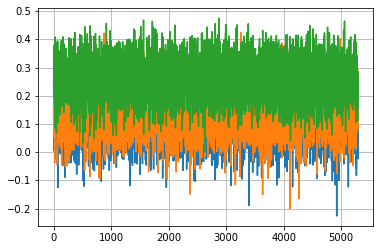

epoch 17


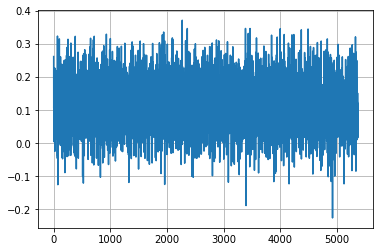

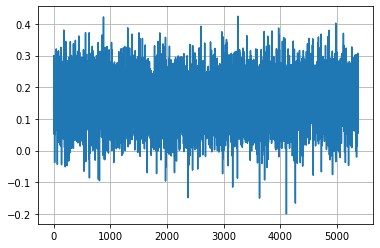

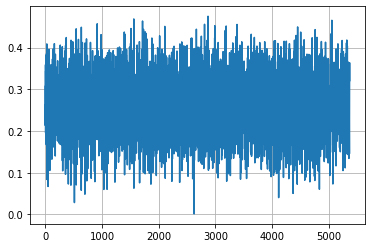

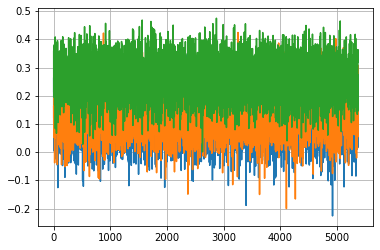

epoch 18


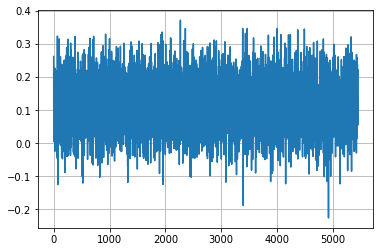

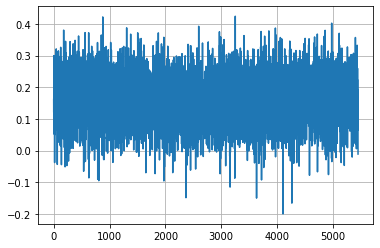

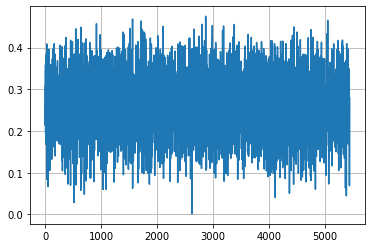

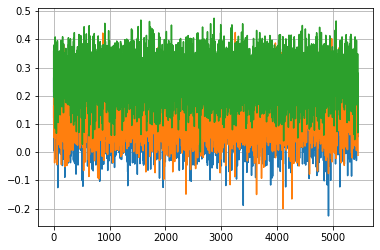

epoch 19


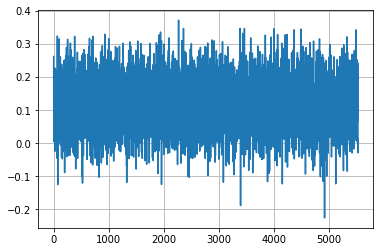

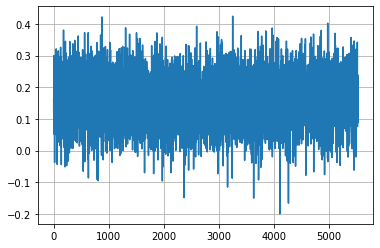

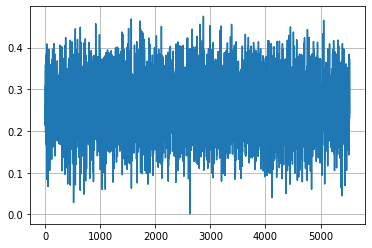

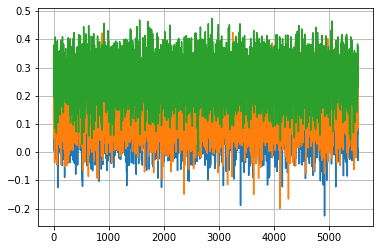

epoch 20


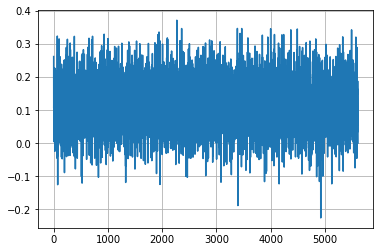

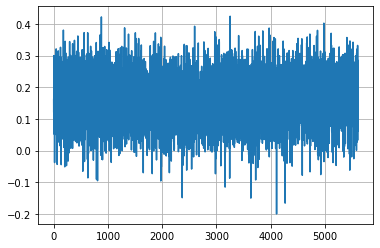

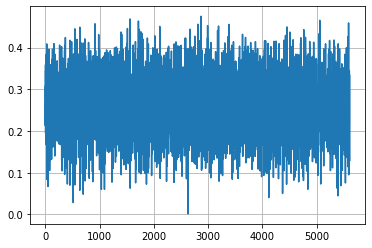

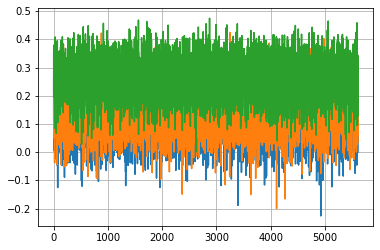

epoch 21


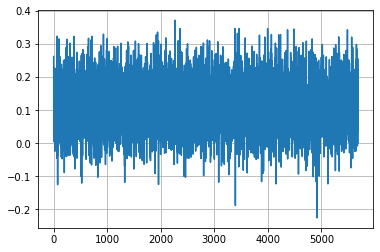

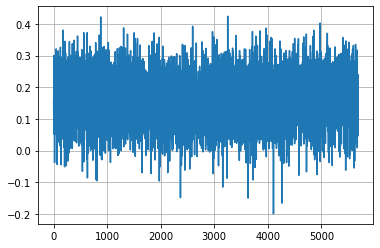

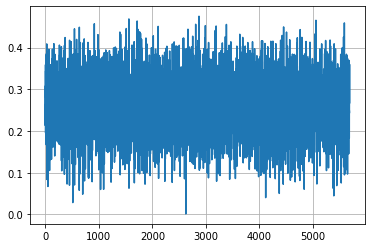

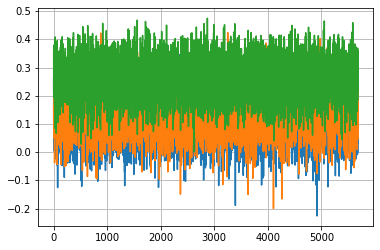

KeyboardInterrupt: 

In [29]:
gradient_align = []
gradient_align2 = []
gradient_align3 = []
cifar10_testset = torchvision.datasets.CIFAR10('/home/fmejia/fmejia/Cypercat/cyphercat/datasets//', train=False, transform=transform, download=True)
cifar10_testloader = torch.utils.data.DataLoader(cifar10_testset, batch_size=batch_size, shuffle=True, num_workers=2)
class_criterion = nn.CrossEntropyLoss()
criterion = nn.CrossEntropyLoss()
cos = nn.CosineSimilarity(dim = 0)
for ii in range(10):
    print('n_restart = ' + str(ii))  
    for jj in range(n_epoch):

        for batch, batch_eval, batch_eval2, batch_train in zip(
            cifar10_testloader, alt_trainloader, alt_trainloader, cifar10_testloader): 
            imgs, labels = batch
            imgs_eval, labels_eval = batch_eval
            imgs_eval2, labels_eval2 = batch_eval2
            imgs_train, labels_train = batch_train
            
            imgs, labels = imgs.to(device), labels.to(device)  
            imgs_eval, labels_eval = imgs_eval.to(device), labels_eval.to(device)
            imgs_eval2, labels_eval2 = imgs_eval2.to(device), labels_eval2.to(device)
            imgs_train, labels_train = imgs_train.to(device), labels_train.to(device)

            ## train with weighted data
            with torch.enable_grad():
                output = net.forward_with_param(imgs, w0)
                loss = criterion(output, labels)
            gw, = torch.autograd.grad(loss, w0, grad_outputs = torch.tensor(lr).to(device)) 
            
            outputs = net.forward_with_param(imgs_train, w0)
            loss = class_criterion(outputs, labels_train) 
            ggw, = torch.autograd.grad(loss, w0) 

            ## test loss
            outputs = net.forward_with_param(imgs_eval, w0)
            loss_test = class_criterion(outputs, labels_eval) 
            dw, = torch.autograd.grad(loss_test, w0)
            
            ## test loss
            outputs = net.forward_with_param(imgs_eval2, w0)
            loss_test = class_criterion(outputs, labels_eval2) 
            dw2, = torch.autograd.grad(loss_test, w0)
            
            gradient_align.append(cos(gw,dw).item())
            gradient_align2.append(cos(gw,ggw).item())
            gradient_align3.append(cos(dw,dw2).item())



        print('epoch ' + str(jj))    

        plt.plot(gradient_align)
        plt.grid(True)
        plt.show() 
        plt.plot(gradient_align2)
        plt.grid(True)
        plt.show()
        plt.plot(gradient_align3)
        plt.grid(True)
        plt.show()
        plt.plot(gradient_align)
        plt.plot(gradient_align2)
        plt.plot(gradient_align3)
        plt.grid(True)
        plt.show()
      


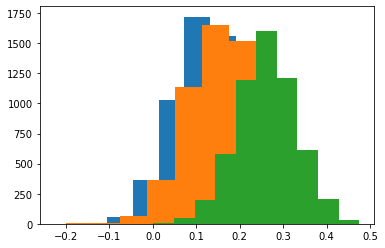

In [30]:
plt.hist(gradient_align)
plt.hist(gradient_align2)
# plt.grid(True)
# plt.show()
plt.hist(gradient_align3)
# plt.grid(True)
plt.show()

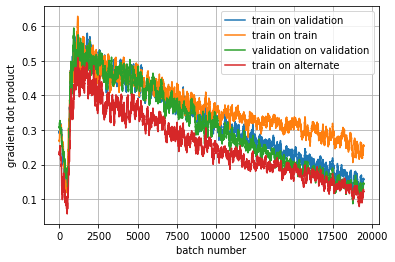

In [21]:
def moving_average(a, n=100) :
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n
plt.plot(moving_average(gradient_align), label = 'train on validation')
plt.plot(moving_average(gradient_align2), label = 'train on train')
plt.plot(moving_average(gradient_align3), label = 'validation on validation')
plt.plot(moving_average(gradient_align4), label = 'train on alternate')
plt.xlabel('batch number')
plt.ylabel('gradient dot product')
plt.grid(True)
plt.legend()
# plt.savefig('gradient_dot_product.png')
plt.show()


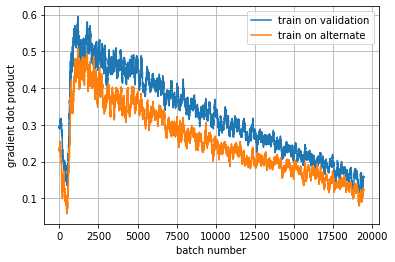

In [22]:
def moving_average(a, n=100) :
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n
plt.plot(moving_average(gradient_align), label = 'train on validation')
plt.plot(moving_average(gradient_align4), label = 'train on alternate')
plt.xlabel('batch number')
plt.ylabel('gradient dot product')
plt.grid(True)
plt.legend()
# plt.savefig('gradient_dot_product.png')
plt.show()


In [22]:
print(torch.tensor(gradient_align).mean())
print(torch.tensor(gradient_align2).mean())
eval_target_net(net, cifar10_testloader, w0, classes=classes)

tensor(-0.1018)
tensor(-0.1021)
Accuracy of airplane : 80.00 %
Accuracy of automobile : 70.10 %
Accuracy of bird : 73.20 %
Accuracy of cat : 46.10 %
Accuracy of deer : 66.60 %
Accuracy of dog : 55.40 %
Accuracy of frog : 74.00 %
Accuracy of horse : 77.70 %
Accuracy of ship : 84.30 %
Accuracy of truck : 84.20 %

Total accuracy = 71.16 %




71.16

Files already downloaded and verified
Files already downloaded and verified
1


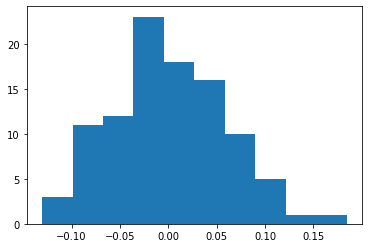

Files already downloaded and verified
Files already downloaded and verified
2


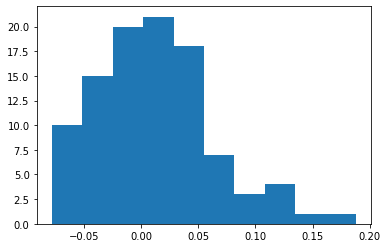

Files already downloaded and verified
Files already downloaded and verified
4


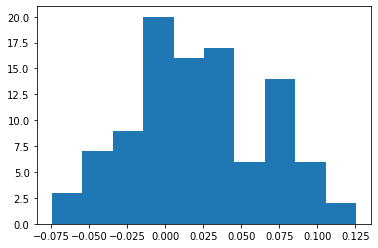

Files already downloaded and verified
Files already downloaded and verified
8


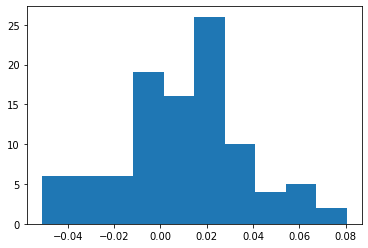

Files already downloaded and verified
Files already downloaded and verified
16


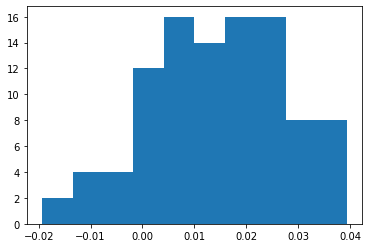

Files already downloaded and verified
Files already downloaded and verified
32


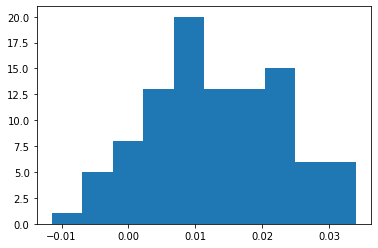

Files already downloaded and verified
Files already downloaded and verified
64


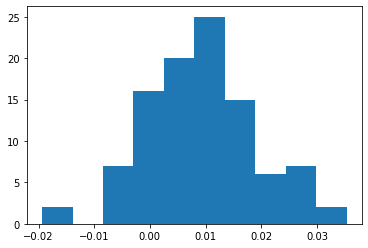

Files already downloaded and verified
Files already downloaded and verified
128


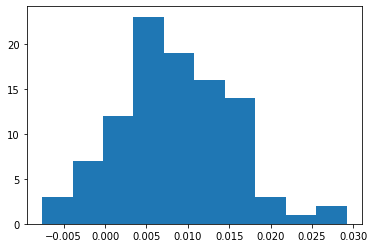

In [30]:
w = torch.tensor(net.get_param().cpu().detach().numpy(), requires_grad = True).to(device) 
class_criterion = nn.CrossEntropyLoss()

for i in range(8):
    batch_size = 128
    batch_size_eval = 2**(i)
    # define series of transforms to pre process images 
    transform = torchvision.transforms.Compose([
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
    ])


    # load training set 
    cifar10_trainset = torchvision.datasets.CIFAR10('/home/fmejia/fmejia/Cypercat/cyphercat/datasets//', train=True, transform=transform, download=True)
    cifar10_trainloader = torch.utils.data.DataLoader(cifar10_trainset, batch_size=batch_size, shuffle=True, num_workers=2)

    # load test set 
    cifar10_testset = torchvision.datasets.CIFAR10('/home/fmejia/fmejia/Cypercat/cyphercat/datasets//', train=False, transform=transform, download=True)
    cifar10_testloader = torch.utils.data.DataLoader(cifar10_testset, batch_size=batch_size_eval, shuffle=False, num_workers=2)
    gradient_align = []
    for j in range(100):
        # display sample from dataset 
        imgs,labels = iter(cifar10_trainloader).next()
        imgs_test,labels_test = iter(cifar10_testloader).next()
        
        imgs, labels = imgs.to(device), labels.to(device)
        imgs_test, labels_test = imgs_test.to(device), labels_test.to(device)
        
        outputs = net.forward_with_param(imgs, w)
        loss = class_criterion(outputs, labels) 
        gw, = torch.autograd.grad(loss, w) 

        ## test loss
        outputs = net.forward_with_param(imgs_test, w )
        loss_test = class_criterion(outputs, labels_test) 
        dw, = torch.autograd.grad(loss_test, w)
        gradient_align.append((gw*dw).sum().item())
    print(2**(i))
    plt.hist(gradient_align)
    plt.show()

/home/fmejia/anaconda3/envs/pytorch1.4/lib/python3.6/site-packages/ipykernel_launcher.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


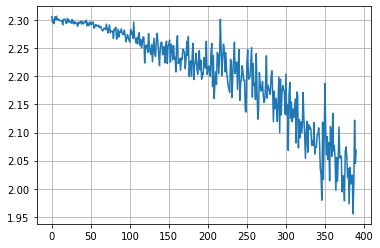

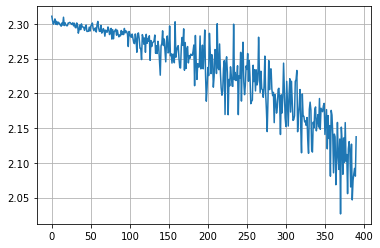

0


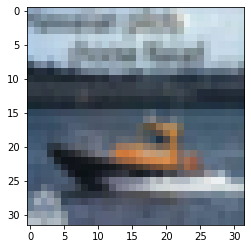

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


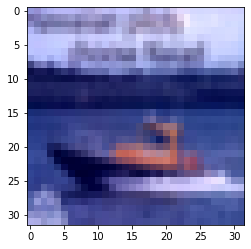

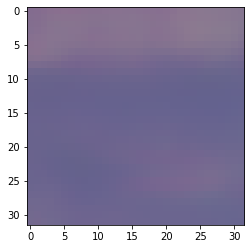

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


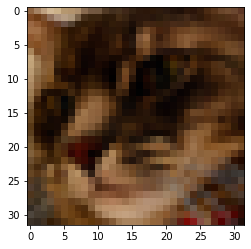

Accuracy of airplane : 12.00 %
Accuracy of automobile : 12.00 %
Accuracy of bird : 0.00 %
Accuracy of cat : 0.30 %
Accuracy of deer : 0.00 %
Accuracy of dog : 47.70 %
Accuracy of frog : 55.80 %
Accuracy of horse : 20.50 %
Accuracy of ship : 29.30 %
Accuracy of truck : 49.20 %

Total accuracy = 22.68 %




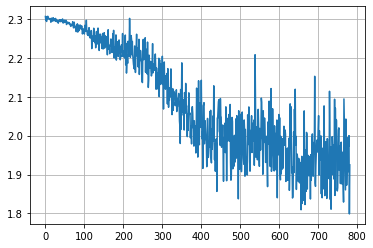

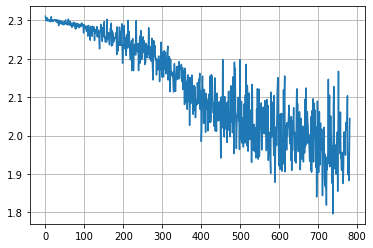

1


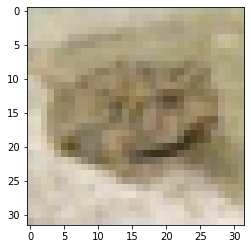

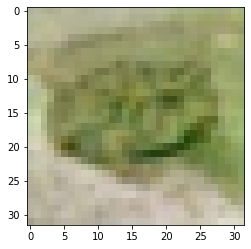

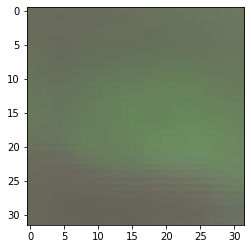

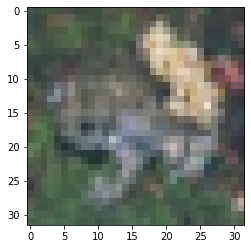

Accuracy of airplane : 44.50 %
Accuracy of automobile : 26.30 %
Accuracy of bird : 0.00 %
Accuracy of cat : 5.50 %
Accuracy of deer : 0.00 %
Accuracy of dog : 48.40 %
Accuracy of frog : 48.80 %
Accuracy of horse : 26.70 %
Accuracy of ship : 39.10 %
Accuracy of truck : 47.10 %

Total accuracy = 28.64 %




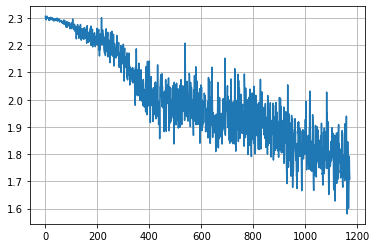

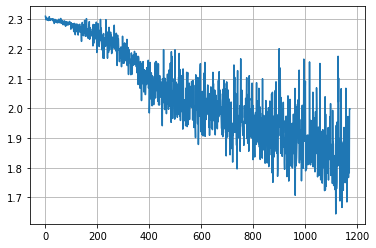

2


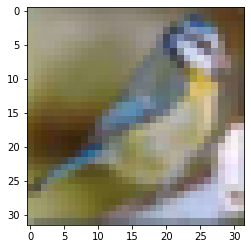

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


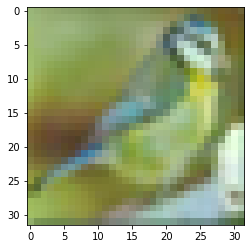

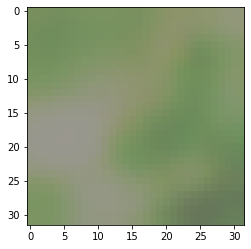

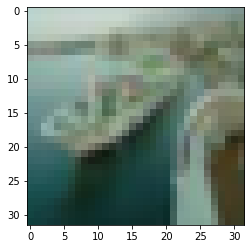

Accuracy of airplane : 46.50 %
Accuracy of automobile : 34.00 %
Accuracy of bird : 1.50 %
Accuracy of cat : 30.00 %
Accuracy of deer : 17.70 %
Accuracy of dog : 41.30 %
Accuracy of frog : 25.40 %
Accuracy of horse : 51.50 %
Accuracy of ship : 24.40 %
Accuracy of truck : 57.20 %

Total accuracy = 32.95 %




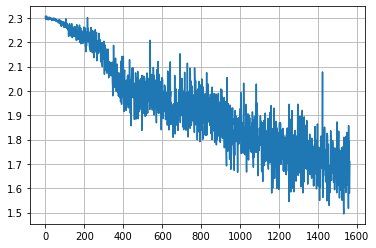

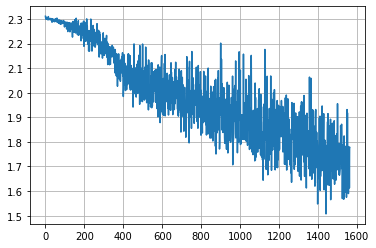

3


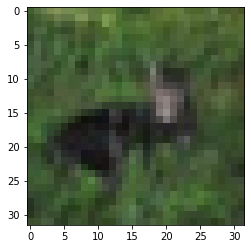

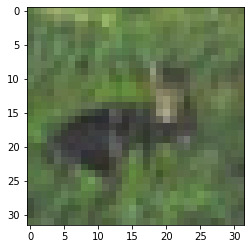

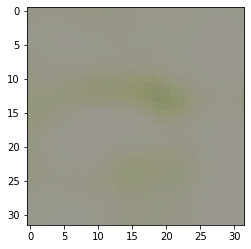

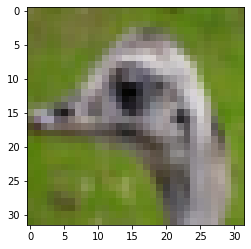

Accuracy of airplane : 59.20 %
Accuracy of automobile : 41.10 %
Accuracy of bird : 1.90 %
Accuracy of cat : 39.50 %
Accuracy of deer : 8.00 %
Accuracy of dog : 33.70 %
Accuracy of frog : 27.30 %
Accuracy of horse : 39.40 %
Accuracy of ship : 46.50 %
Accuracy of truck : 52.20 %

Total accuracy = 34.88 %




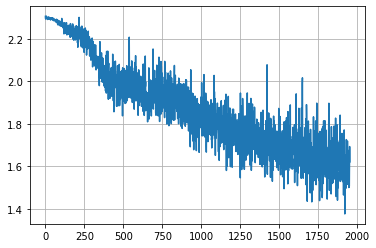

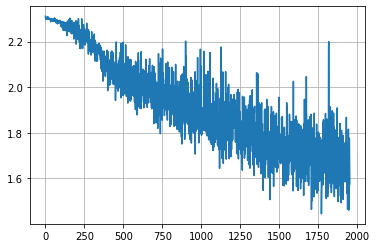

4


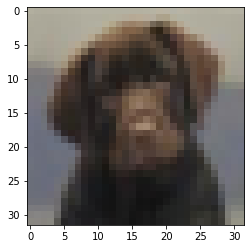

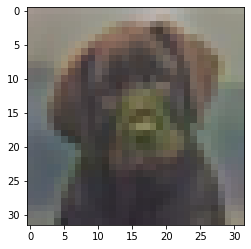

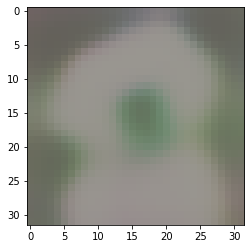

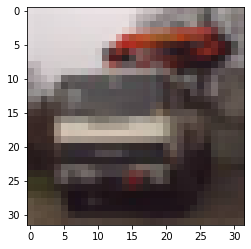

Accuracy of airplane : 59.60 %
Accuracy of automobile : 27.40 %
Accuracy of bird : 9.60 %
Accuracy of cat : 31.20 %
Accuracy of deer : 14.40 %
Accuracy of dog : 43.20 %
Accuracy of frog : 65.40 %
Accuracy of horse : 54.10 %
Accuracy of ship : 29.40 %
Accuracy of truck : 64.60 %

Total accuracy = 39.89 %




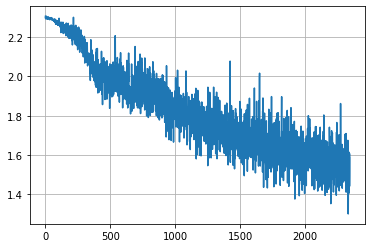

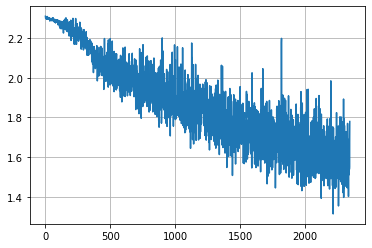

5


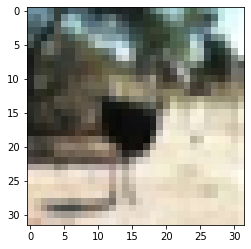

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


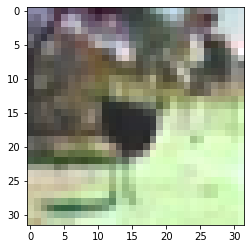

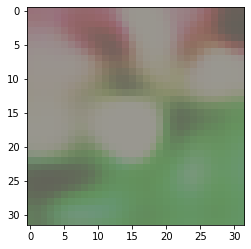

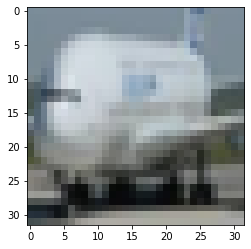

Accuracy of airplane : 35.40 %
Accuracy of automobile : 16.00 %
Accuracy of bird : 10.40 %
Accuracy of cat : 23.70 %
Accuracy of deer : 26.50 %
Accuracy of dog : 68.90 %
Accuracy of frog : 55.70 %
Accuracy of horse : 57.00 %
Accuracy of ship : 34.80 %
Accuracy of truck : 42.90 %

Total accuracy = 37.13 %




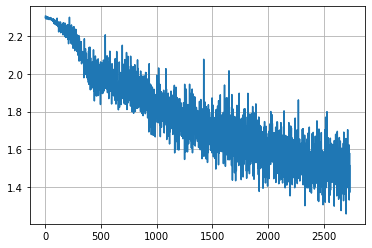

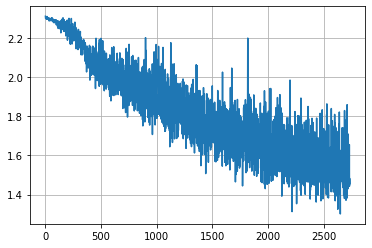

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6


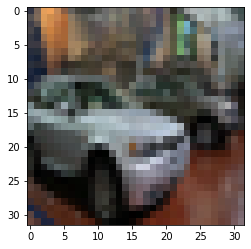

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


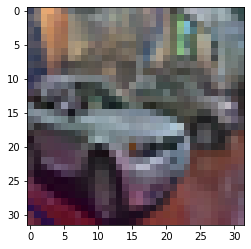

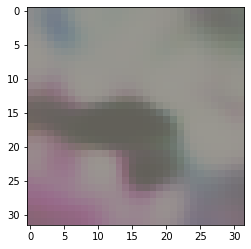

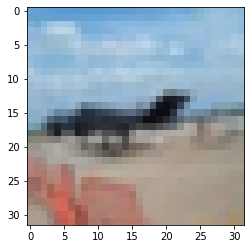

Accuracy of airplane : 66.00 %
Accuracy of automobile : 55.50 %
Accuracy of bird : 23.90 %
Accuracy of cat : 19.00 %
Accuracy of deer : 26.20 %
Accuracy of dog : 52.60 %
Accuracy of frog : 60.50 %
Accuracy of horse : 55.60 %
Accuracy of ship : 48.80 %
Accuracy of truck : 42.90 %

Total accuracy = 45.10 %




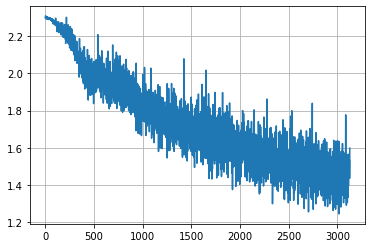

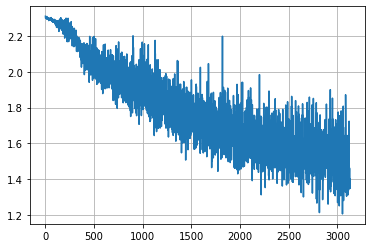

7


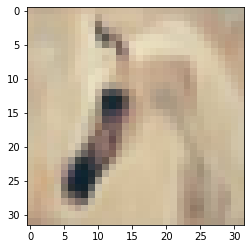

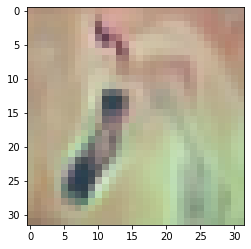

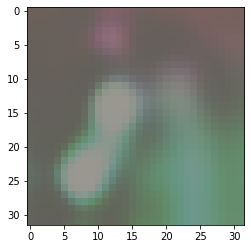

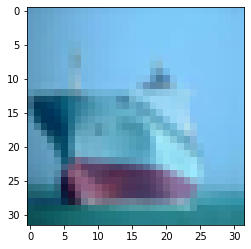

Accuracy of airplane : 45.00 %
Accuracy of automobile : 56.20 %
Accuracy of bird : 16.60 %
Accuracy of cat : 37.50 %
Accuracy of deer : 23.60 %
Accuracy of dog : 17.00 %
Accuracy of frog : 79.20 %
Accuracy of horse : 67.10 %
Accuracy of ship : 50.90 %
Accuracy of truck : 60.60 %

Total accuracy = 45.37 %




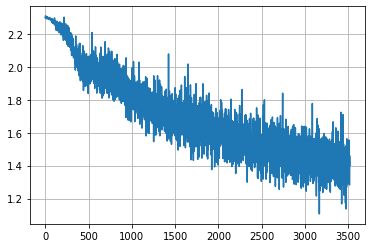

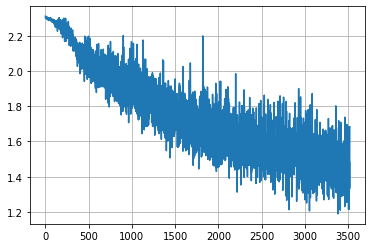

8


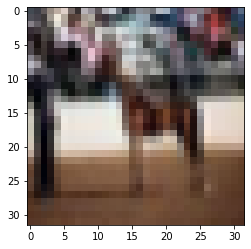

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


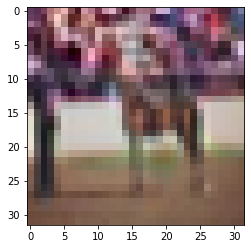

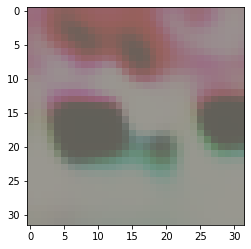

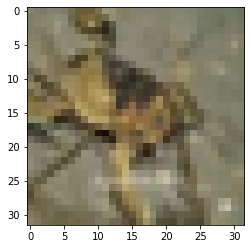

Accuracy of airplane : 61.40 %
Accuracy of automobile : 68.10 %
Accuracy of bird : 29.10 %
Accuracy of cat : 35.40 %
Accuracy of deer : 27.60 %
Accuracy of dog : 30.10 %
Accuracy of frog : 67.50 %
Accuracy of horse : 61.40 %
Accuracy of ship : 62.00 %
Accuracy of truck : 52.90 %

Total accuracy = 49.55 %




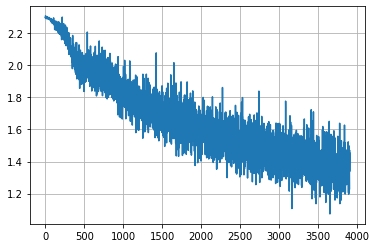

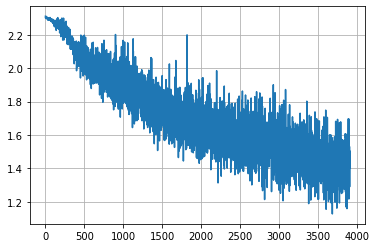

9


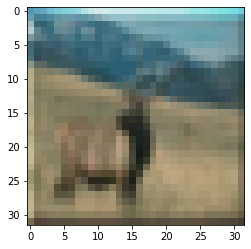

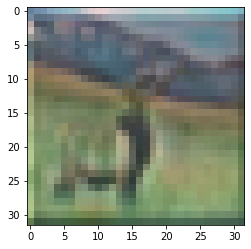

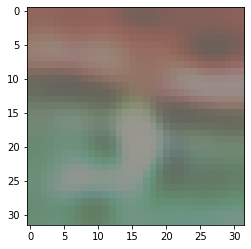

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


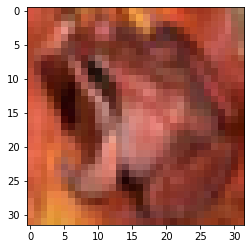

Accuracy of airplane : 72.00 %
Accuracy of automobile : 46.90 %
Accuracy of bird : 29.90 %
Accuracy of cat : 49.60 %
Accuracy of deer : 28.00 %
Accuracy of dog : 47.90 %
Accuracy of frog : 59.80 %
Accuracy of horse : 66.90 %
Accuracy of ship : 32.70 %
Accuracy of truck : 57.10 %

Total accuracy = 49.08 %




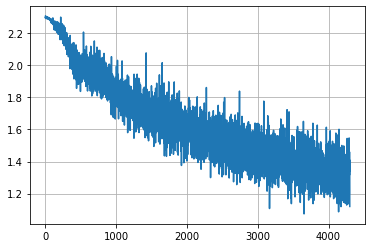

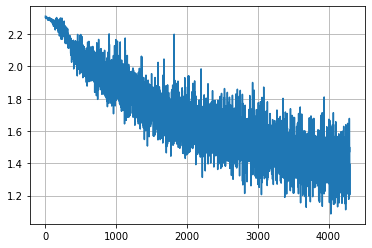

10


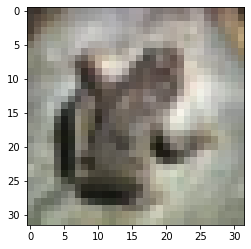

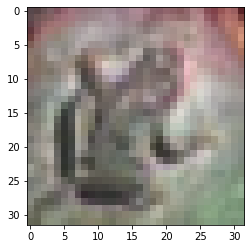

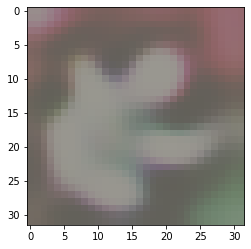

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


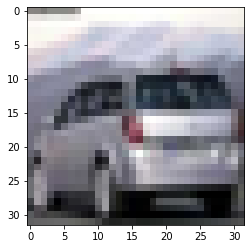

Accuracy of airplane : 63.70 %
Accuracy of automobile : 72.40 %
Accuracy of bird : 45.90 %
Accuracy of cat : 39.40 %
Accuracy of deer : 33.50 %
Accuracy of dog : 35.50 %
Accuracy of frog : 70.10 %
Accuracy of horse : 37.80 %
Accuracy of ship : 68.00 %
Accuracy of truck : 45.90 %

Total accuracy = 51.22 %




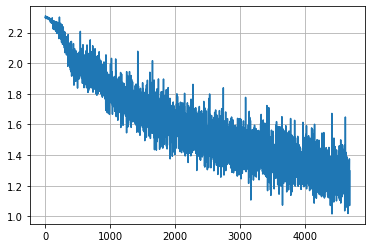

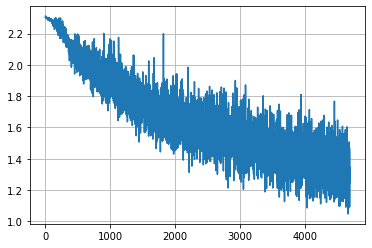

11


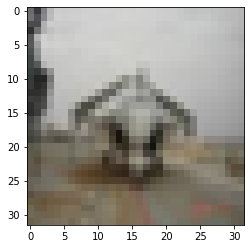

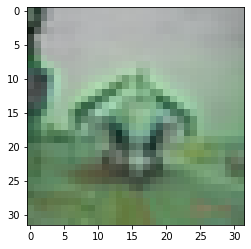

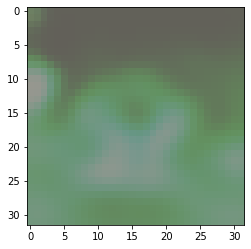

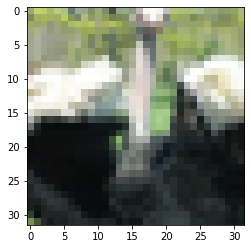

Accuracy of airplane : 70.40 %
Accuracy of automobile : 59.20 %
Accuracy of bird : 18.40 %
Accuracy of cat : 56.90 %
Accuracy of deer : 29.50 %
Accuracy of dog : 44.60 %
Accuracy of frog : 68.10 %
Accuracy of horse : 72.20 %
Accuracy of ship : 41.20 %
Accuracy of truck : 63.10 %

Total accuracy = 52.36 %




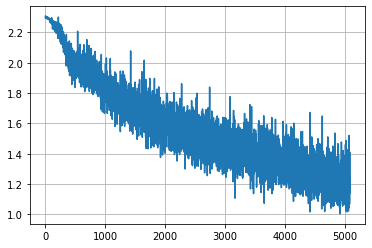

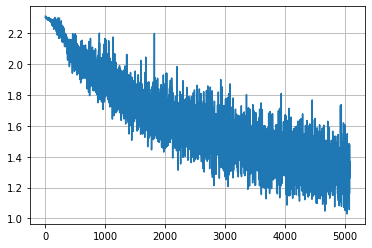

12


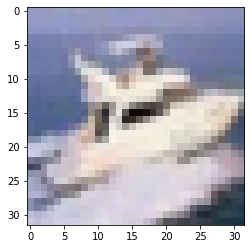

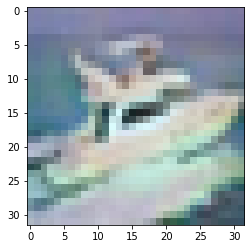

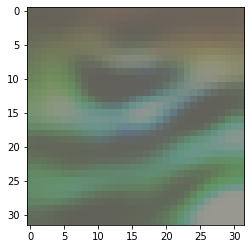

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


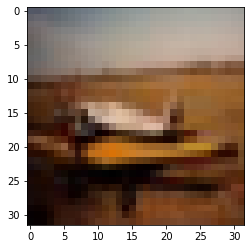

Accuracy of airplane : 63.00 %
Accuracy of automobile : 63.70 %
Accuracy of bird : 41.70 %
Accuracy of cat : 38.30 %
Accuracy of deer : 28.20 %
Accuracy of dog : 45.90 %
Accuracy of frog : 78.20 %
Accuracy of horse : 66.90 %
Accuracy of ship : 79.10 %
Accuracy of truck : 49.20 %

Total accuracy = 55.42 %




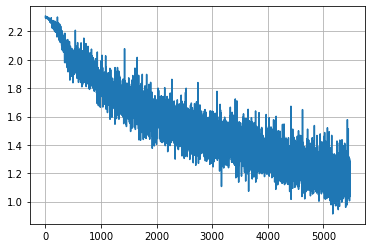

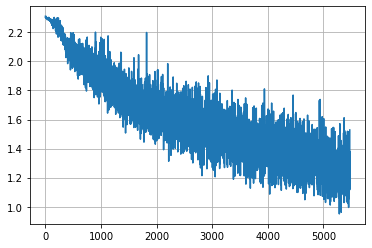

13


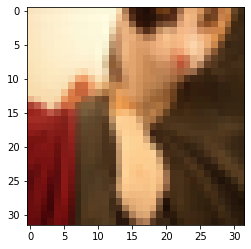

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


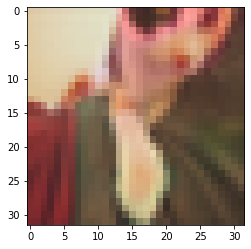

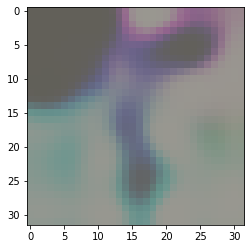

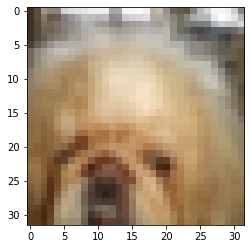

Accuracy of airplane : 62.00 %
Accuracy of automobile : 58.90 %
Accuracy of bird : 11.10 %
Accuracy of cat : 33.40 %
Accuracy of deer : 29.30 %
Accuracy of dog : 57.30 %
Accuracy of frog : 46.60 %
Accuracy of horse : 84.70 %
Accuracy of ship : 50.20 %
Accuracy of truck : 76.60 %

Total accuracy = 51.01 %




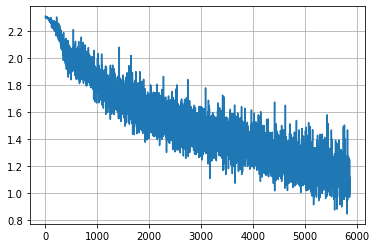

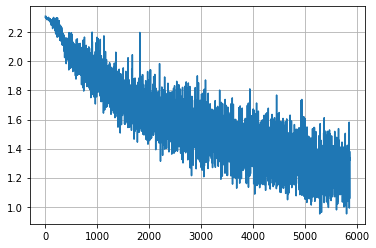

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


14


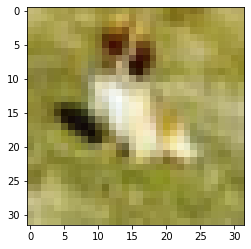

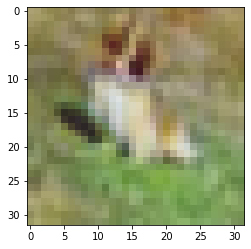

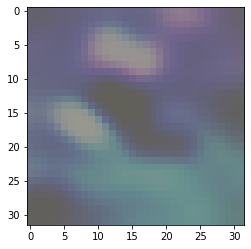

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


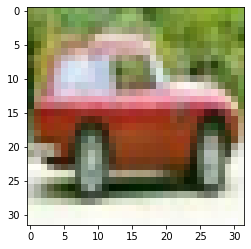

Accuracy of airplane : 73.10 %
Accuracy of automobile : 63.40 %
Accuracy of bird : 28.50 %
Accuracy of cat : 40.70 %
Accuracy of deer : 40.00 %
Accuracy of dog : 58.50 %
Accuracy of frog : 74.10 %
Accuracy of horse : 74.40 %
Accuracy of ship : 58.90 %
Accuracy of truck : 66.30 %

Total accuracy = 57.79 %




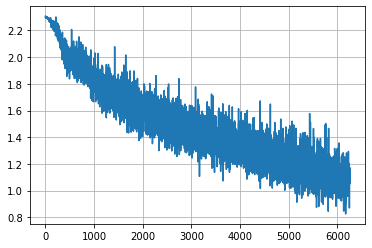

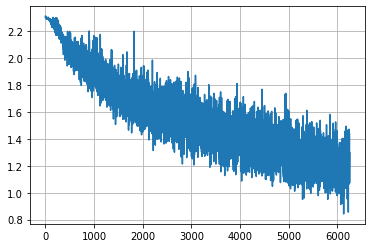

15


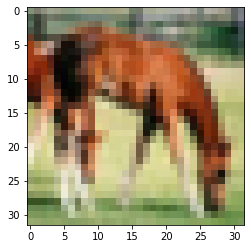

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


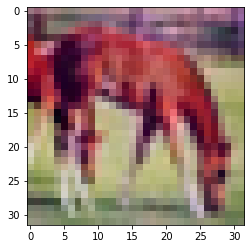

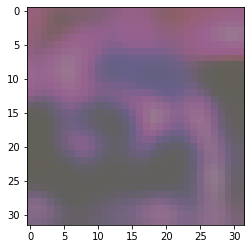

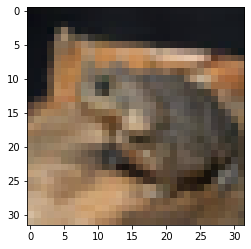

Accuracy of airplane : 72.90 %
Accuracy of automobile : 63.00 %
Accuracy of bird : 39.50 %
Accuracy of cat : 42.10 %
Accuracy of deer : 34.90 %
Accuracy of dog : 65.30 %
Accuracy of frog : 60.00 %
Accuracy of horse : 77.30 %
Accuracy of ship : 60.00 %
Accuracy of truck : 68.10 %

Total accuracy = 58.31 %




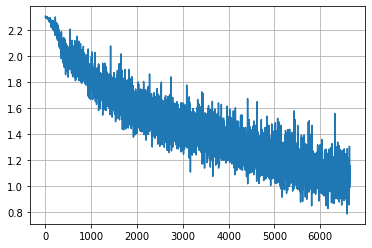

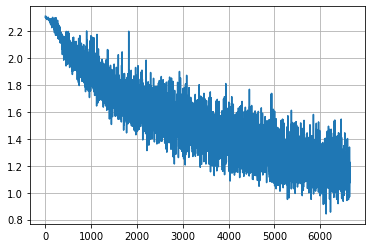

16


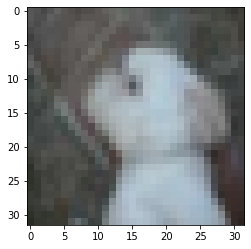

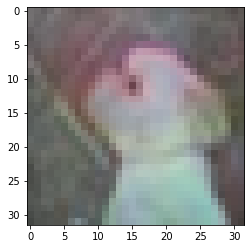

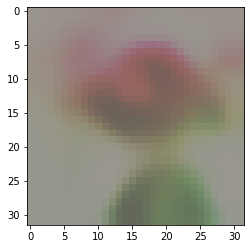

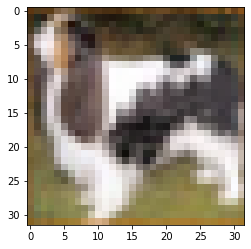

Accuracy of airplane : 54.50 %
Accuracy of automobile : 71.20 %
Accuracy of bird : 53.60 %
Accuracy of cat : 42.60 %
Accuracy of deer : 43.00 %
Accuracy of dog : 52.00 %
Accuracy of frog : 80.90 %
Accuracy of horse : 67.70 %
Accuracy of ship : 75.90 %
Accuracy of truck : 65.00 %

Total accuracy = 60.64 %




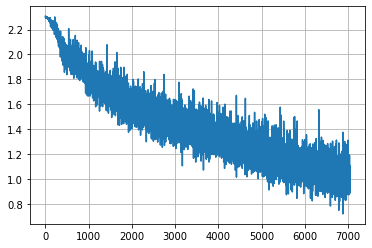

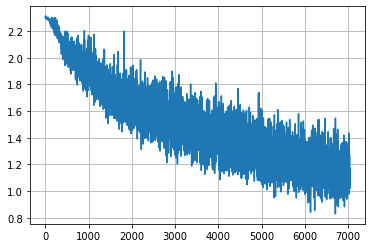

17


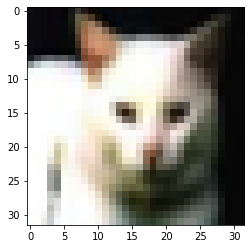

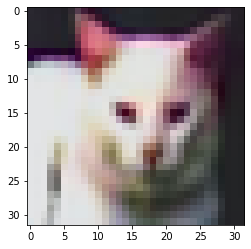

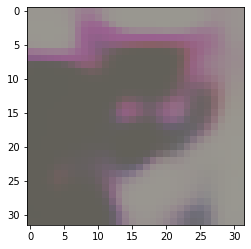

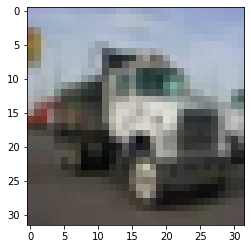

Accuracy of airplane : 67.40 %
Accuracy of automobile : 74.70 %
Accuracy of bird : 27.80 %
Accuracy of cat : 54.10 %
Accuracy of deer : 66.00 %
Accuracy of dog : 40.90 %
Accuracy of frog : 57.60 %
Accuracy of horse : 74.50 %
Accuracy of ship : 71.90 %
Accuracy of truck : 71.90 %

Total accuracy = 60.68 %




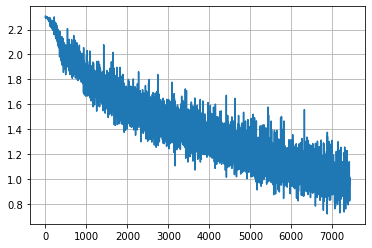

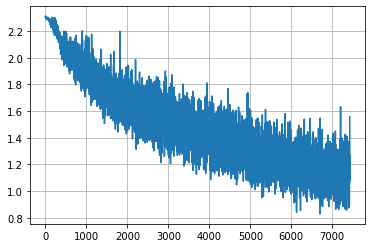

18


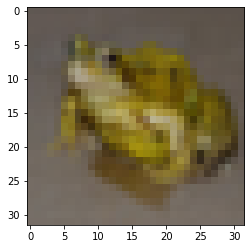

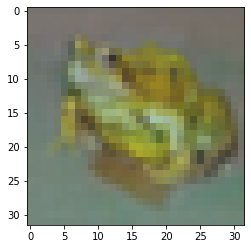

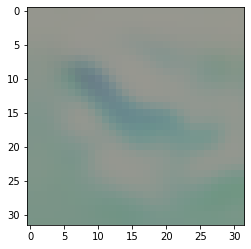

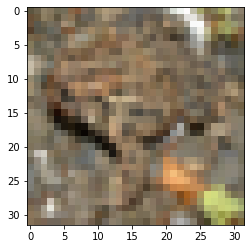

Accuracy of airplane : 56.30 %
Accuracy of automobile : 82.30 %
Accuracy of bird : 44.60 %
Accuracy of cat : 45.20 %
Accuracy of deer : 52.10 %
Accuracy of dog : 44.60 %
Accuracy of frog : 81.90 %
Accuracy of horse : 74.10 %
Accuracy of ship : 70.90 %
Accuracy of truck : 70.10 %

Total accuracy = 62.21 %




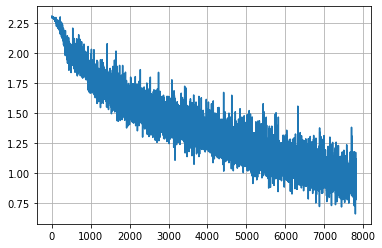

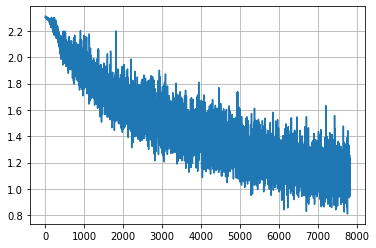

19


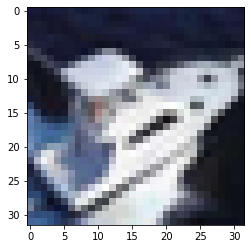

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


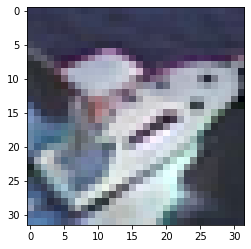

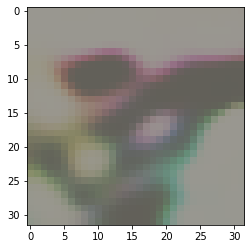

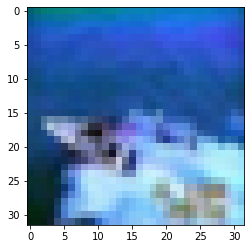

Accuracy of airplane : 75.00 %
Accuracy of automobile : 75.70 %
Accuracy of bird : 18.20 %
Accuracy of cat : 31.90 %
Accuracy of deer : 68.40 %
Accuracy of dog : 44.50 %
Accuracy of frog : 48.40 %
Accuracy of horse : 83.80 %
Accuracy of ship : 60.40 %
Accuracy of truck : 77.50 %

Total accuracy = 58.38 %




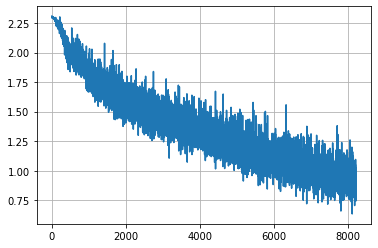

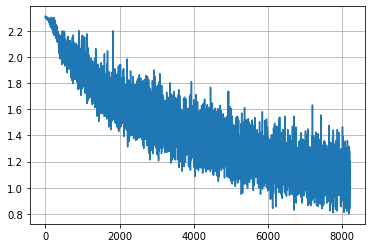

20


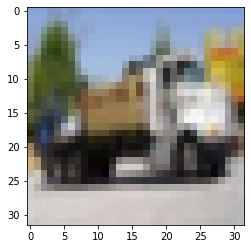

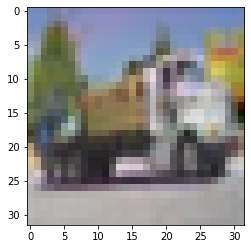

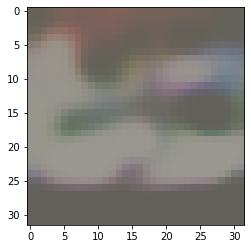

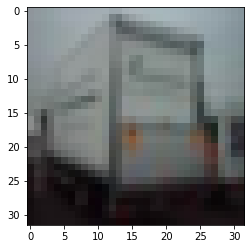

Accuracy of airplane : 78.20 %
Accuracy of automobile : 87.00 %
Accuracy of bird : 68.60 %
Accuracy of cat : 38.30 %
Accuracy of deer : 44.90 %
Accuracy of dog : 29.70 %
Accuracy of frog : 81.00 %
Accuracy of horse : 68.80 %
Accuracy of ship : 62.60 %
Accuracy of truck : 60.10 %

Total accuracy = 61.92 %




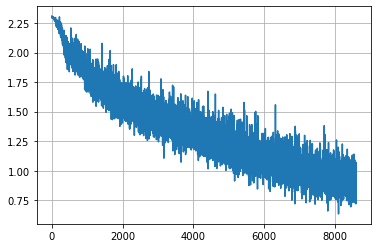

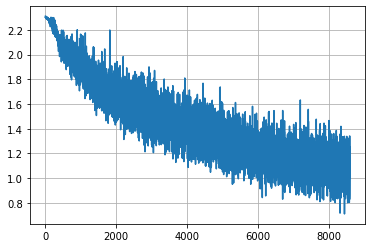

21


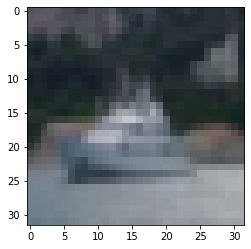

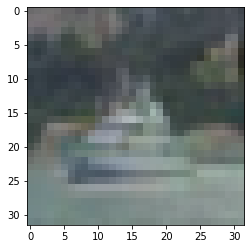

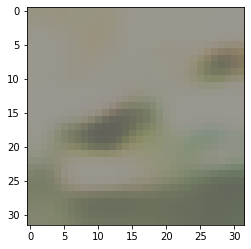

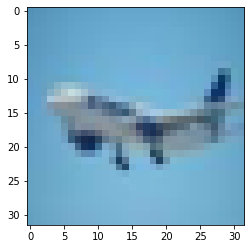

Accuracy of airplane : 70.40 %
Accuracy of automobile : 70.60 %
Accuracy of bird : 45.40 %
Accuracy of cat : 40.50 %
Accuracy of deer : 62.40 %
Accuracy of dog : 56.10 %
Accuracy of frog : 81.00 %
Accuracy of horse : 79.00 %
Accuracy of ship : 61.70 %
Accuracy of truck : 76.60 %

Total accuracy = 64.37 %




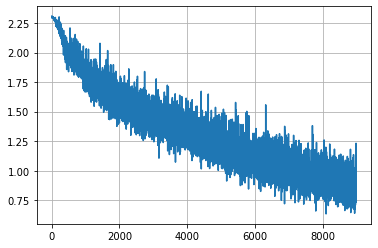

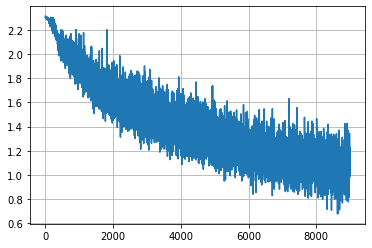

22


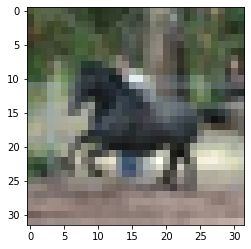

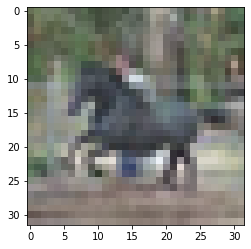

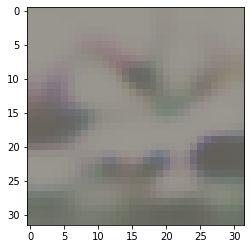

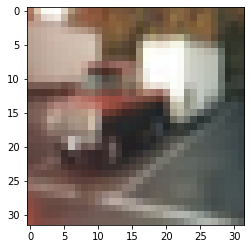

Accuracy of airplane : 72.60 %
Accuracy of automobile : 81.90 %
Accuracy of bird : 32.50 %
Accuracy of cat : 52.80 %
Accuracy of deer : 75.80 %
Accuracy of dog : 54.40 %
Accuracy of frog : 59.30 %
Accuracy of horse : 68.80 %
Accuracy of ship : 79.40 %
Accuracy of truck : 61.10 %

Total accuracy = 63.86 %




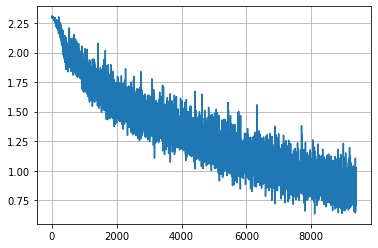

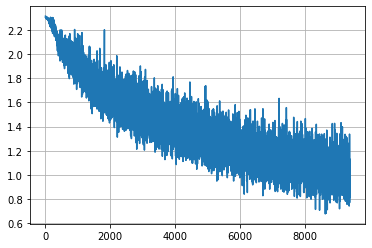

23


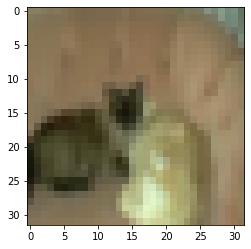

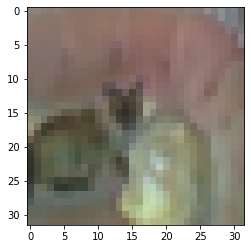

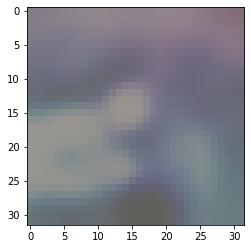

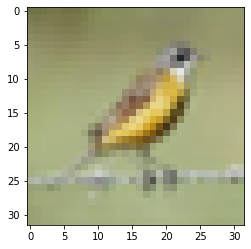

Accuracy of airplane : 68.20 %
Accuracy of automobile : 81.40 %
Accuracy of bird : 62.20 %
Accuracy of cat : 43.80 %
Accuracy of deer : 43.00 %
Accuracy of dog : 50.50 %
Accuracy of frog : 89.30 %
Accuracy of horse : 57.00 %
Accuracy of ship : 77.20 %
Accuracy of truck : 67.40 %

Total accuracy = 64.00 %




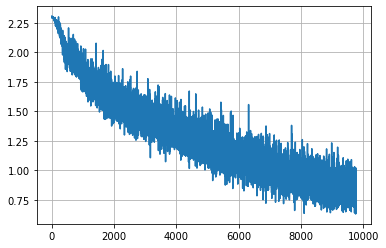

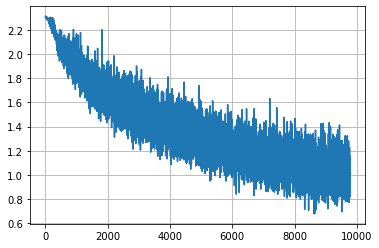

24


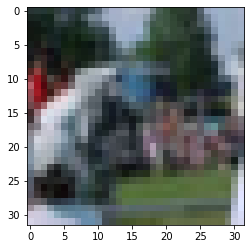

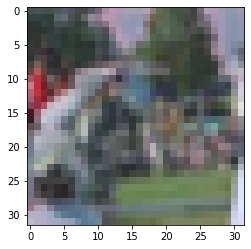

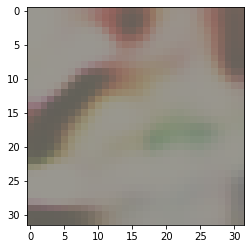

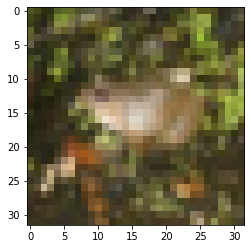

Accuracy of airplane : 66.00 %
Accuracy of automobile : 72.00 %
Accuracy of bird : 53.70 %
Accuracy of cat : 38.90 %
Accuracy of deer : 68.00 %
Accuracy of dog : 45.20 %
Accuracy of frog : 91.70 %
Accuracy of horse : 71.70 %
Accuracy of ship : 78.60 %
Accuracy of truck : 65.00 %

Total accuracy = 65.08 %




In [ ]:
class_criterion = nn.CrossEntropyLoss()

gradient_losses = []
gradient_losses2 = []
gradient_losses3 = []
lr = 1e-02

net = utils.ResNet('BasicBlock', [2, 2, 2, 2], num_classes=10)
net = net.to(device)
w = torch.tensor(net.get_param().cpu().detach().numpy(), requires_grad = True).to(device) 

# optimizer = optim.SGD([im_noise0], lr=0.1, momentum=0.9) 
optimizer = optim.Adam(Generator.parameters(), lr= 1e-5, betas=(0.5, 0.999))

for epoch in range(1000):
    for batch, batch_test in zip(cifar10_trainloader, cifar10_testloader5):
        imgs, labels, _ = batch
        imgs_test, labels_test = batch_test        

        ## train
        imgs, labels = imgs.to(device), labels.to(device)
        imgs_test, labels_test = imgs_test.to(device), labels_test.to(device)

        with torch.enable_grad():
            im_noise0 = Generator(imgs)
            outputs = net.forward_with_param(torch.clamp(imgs + im_noise0, imgs.min(), imgs.max()), w)
            loss = class_criterion(outputs, labels) 
        gw, = torch.autograd.grad(loss, w, grad_outputs = torch.tensor(lr).to(device),create_graph=True) 
        w = w.sub(gw).requires_grad_()

        ## test loss
        outputs = net.forward_with_param(imgs_test, w )
        loss_test = class_criterion(outputs, labels_test) 

        loss_test.backward()
        optimizer.step()
        optimizer.zero_grad()
        
        gradient_losses.append(loss.item())
        gradient_losses2.append(loss_test.item())

        w = torch.tensor(w.detach(), requires_grad = True)  

    plt.plot(gradient_losses)
    plt.grid(True)
    plt.show()
    plt.plot(gradient_losses2)
    plt.grid(True)
    plt.show()

    print(epoch)
    imshow((imgs[0,:,:,:]).squeeze().cpu().detach().numpy())  
    imshow(torch.clamp(imgs + (im_noise0), imgs.min(), imgs.max())[0,:,:,:].squeeze().cpu().detach().numpy())
    imshow((im_noise0)[0,:,:,:].squeeze().cpu().detach().numpy())
    imshow((imgs_test[0,:,:,:]).squeeze().cpu().detach().numpy()) 
    eval_target_net(net, cifar10_testloader, w, classes=classes)


n_restart = 0
epoch 0


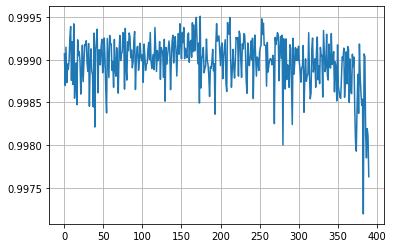

epoch 1


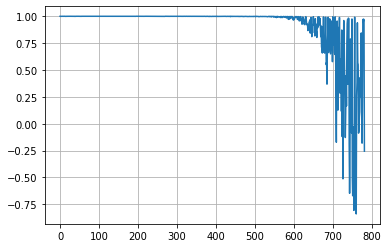

epoch 2


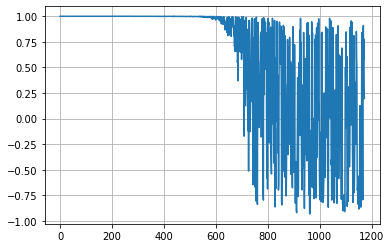

epoch 3


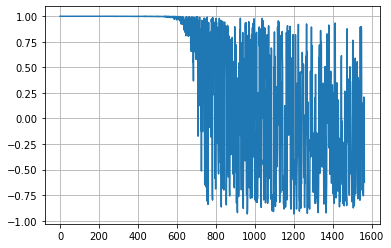

epoch 4


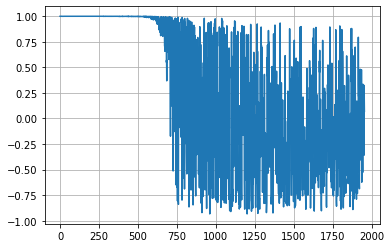

epoch 5


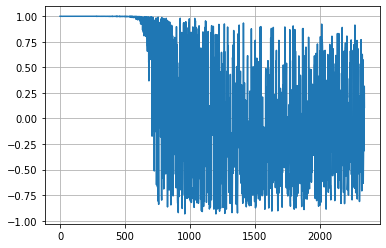

epoch 6


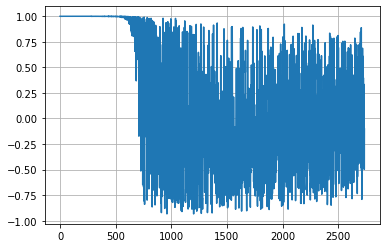

epoch 7


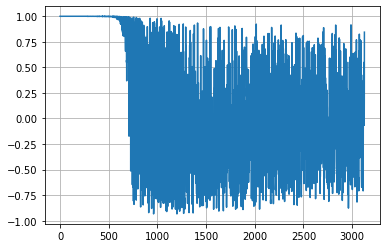

epoch 8


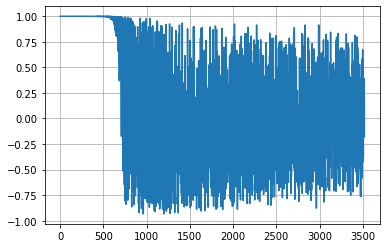

epoch 9


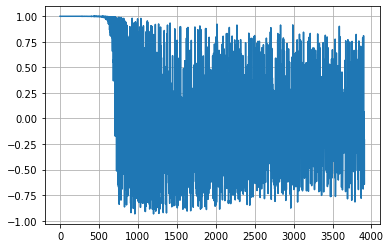

epoch 10


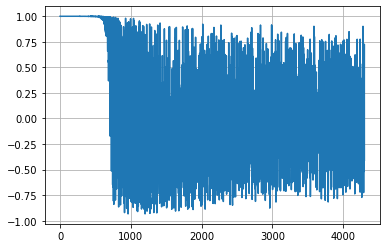

epoch 11


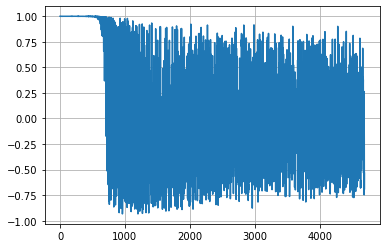

epoch 12


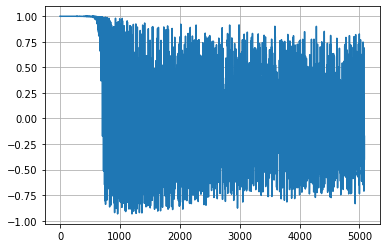

epoch 13


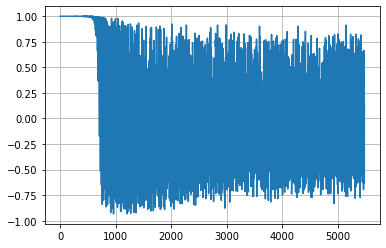

epoch 14


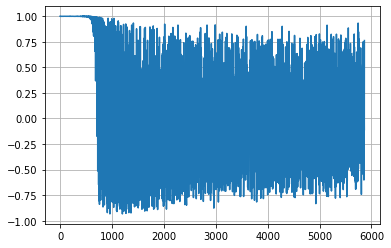

epoch 15


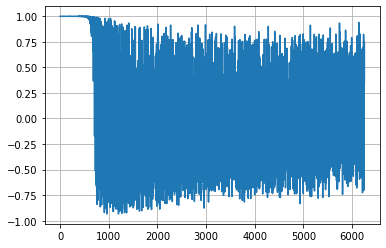

epoch 16


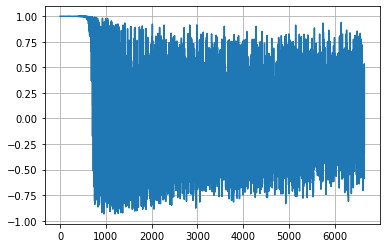

epoch 17


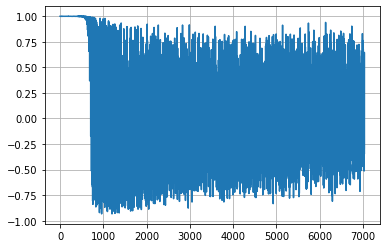

epoch 18


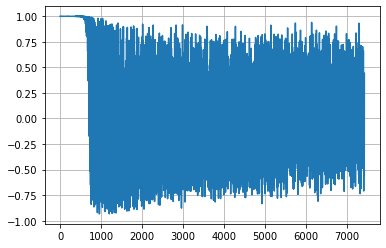

epoch 19


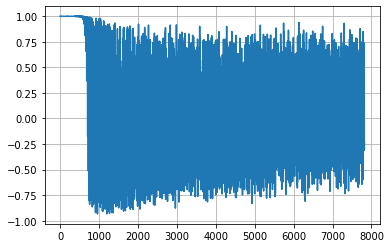

epoch 20


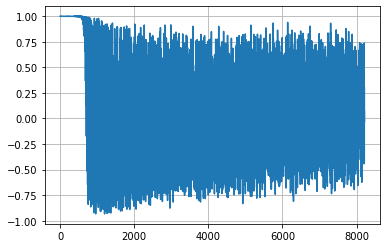

epoch 21


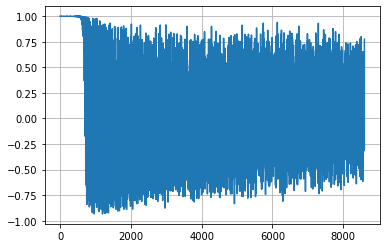

epoch 22


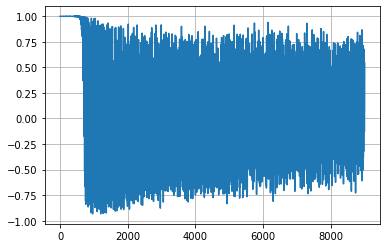

epoch 23


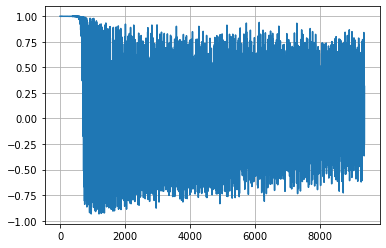

epoch 24


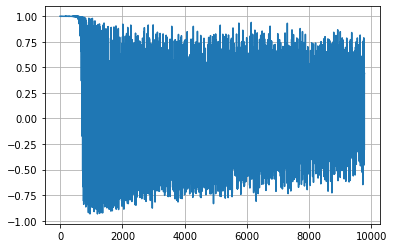

epoch 25


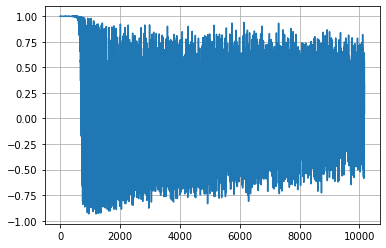

epoch 26


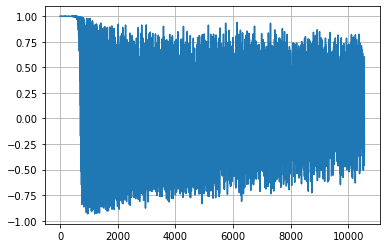

epoch 27


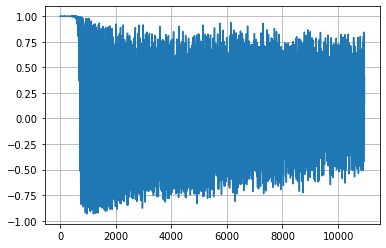

epoch 28


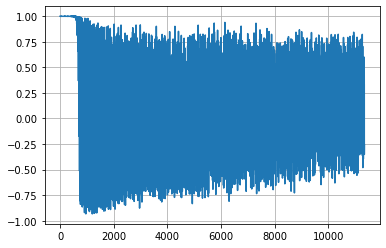

epoch 29


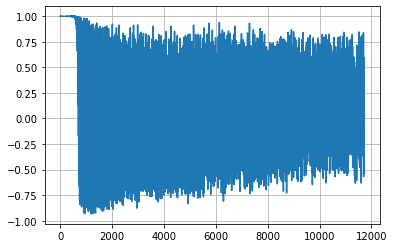

epoch 30


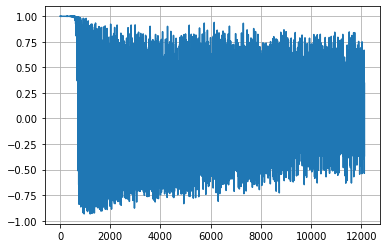

epoch 31


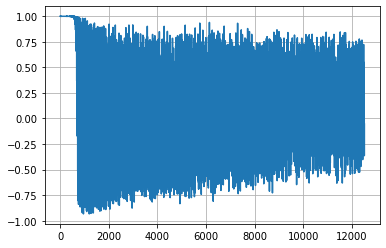

epoch 32


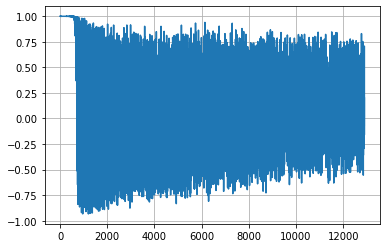

epoch 33


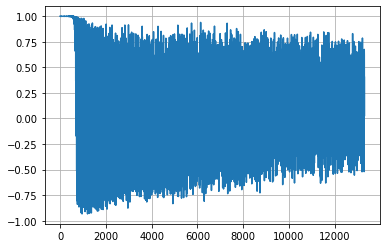

epoch 34


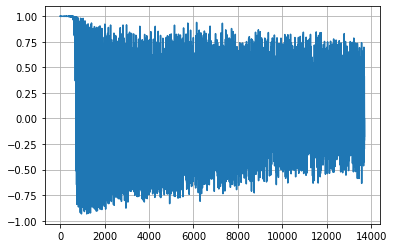

epoch 35


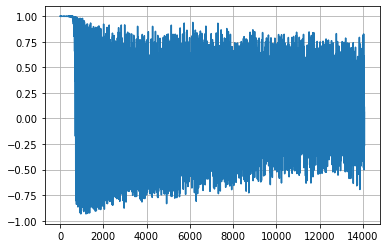

epoch 36


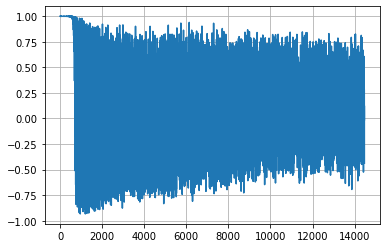

epoch 37


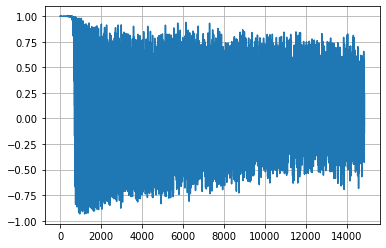

epoch 38


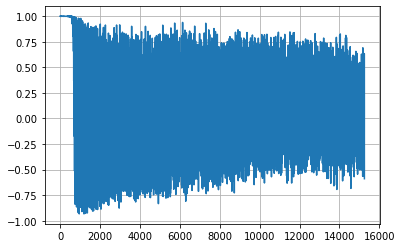

epoch 39


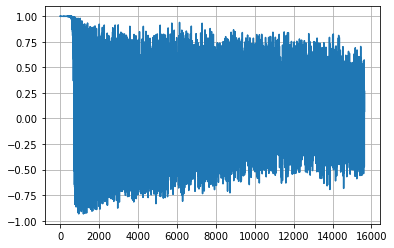

epoch 40


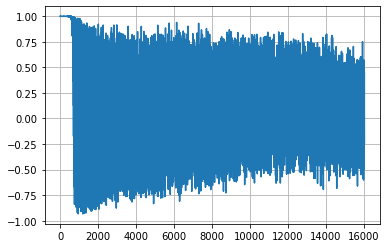

epoch 41


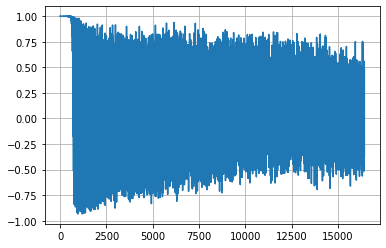

epoch 42


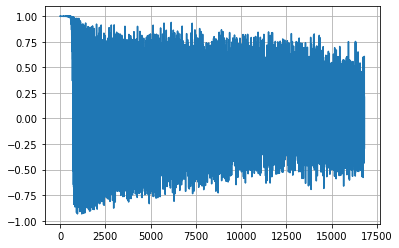

epoch 43


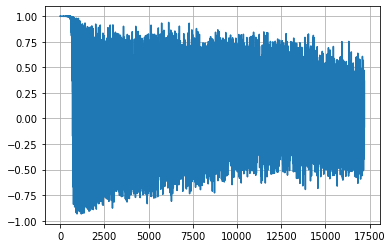

epoch 44


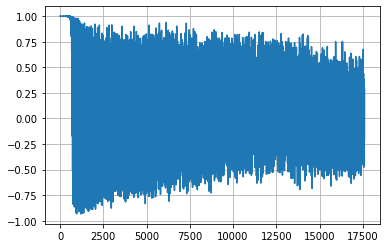

epoch 45


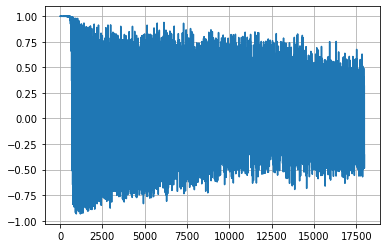

epoch 46


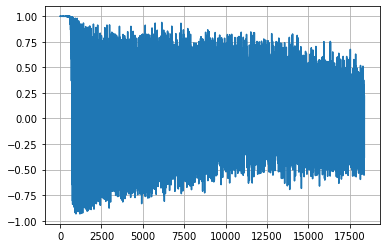

epoch 47


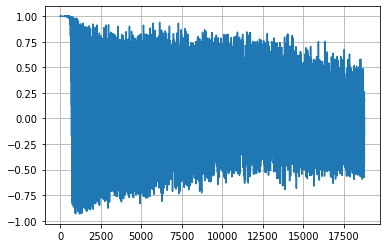

epoch 48


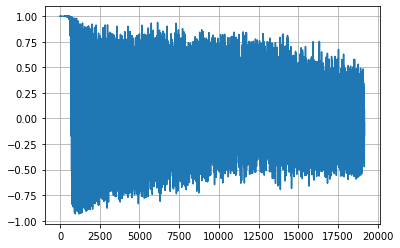

epoch 49


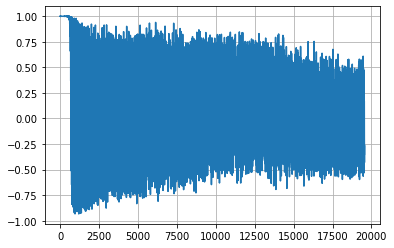

In [31]:
losses = []  
losses_syn = []

w = torch.tensor(net.get_param().cpu().detach().numpy(), requires_grad = True).to(device) 
class_criterion = nn.CrossEntropyLoss()

lr_synthetic = 1e-2
lr = 1e-2

# for i in range(1000):
n_epoch = 50
n_restarts = 1
gradient_align = []
gradient_align2 = []

criterion = nn.CrossEntropyLoss()
cos = nn.CosineSimilarity(dim = 0)
for ii in range(n_restarts):
    print('n_restart = ' + str(ii))
    net = utils.ResNet('BasicBlock', [2, 2, 2, 2], num_classes=10)
    net = net.to(device)
    w0 = torch.tensor(net.get_param().cpu().detach().numpy(), requires_grad = True).to(device)    
    for jj in range(n_epoch):

        for batch in cifar10_trainloader: 
            imgs, labels,_ = batch
           
            
            imgs, labels = imgs.to(device), labels.to(device)  
 
            ## train with weighted data
            with torch.enable_grad():
                output = net.forward_with_param(imgs, w0)
                loss = criterion(output, labels)
            gw, = torch.autograd.grad(loss, w0, grad_outputs = torch.tensor(lr).to(device)) 

            w0 = w0.sub(gw).requires_grad_()
            
            outputs = net.forward_with_param(imgs, w0)
            loss = class_criterion(outputs, labels) 
            ggw, = torch.autograd.grad(loss, w0) 

            gradient_align.append(cos(gw,ggw).item())

        print('epoch ' + str(jj))    

        plt.plot(gradient_align)
        plt.grid(True)
        plt.show() 

